In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import LSTM,Dense
from sklearn.metrics import mean_squared_error
import seaborn as sns

In [8]:
# This data analysis is a sort of distrubing. I got the data from kaggle
# resourse: https://www.kaggle.com/datasets/x1akshay/sexual-assault-rape-vioation-india-1970-2020/code

hello


In [9]:
# loading the data 

df = pd.read_csv('State wise Sexual Assault (Detailed) 1999 - 2013.csv')

In [11]:
#inspecting the data

df.head()

,STATE/UT,YEAR,No. Of Cases In Which Offenders Were Known To The Victims,No. Of Cases In Which Offenders Were Parents / Close Family Members,No. Of Cases In Which Offenders Were Relatives,No. Of Cases In Which Offenders Were Neighbours,No. Of Cases In Which Offenders Were Other Known Persons
0,Andhra Pradesh,2001,871,4,81,247,539
1,Andhra Pradesh,2002,999,5,94,302,598
2,Andhra Pradesh,2003,946,15,82,299,550
3,Andhra Pradesh,2004,924,5,69,313,537
4,Andhra Pradesh,2005,935,18,98,399,420


In [18]:
def shape(df):
    return f"The shape of the data is {df.shape[0]} rows and {df.shape[1]} columns"

print(shape(df))

The shape of the data is 513 rows and 7 columns


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 513 entries, 0 to 512
Data columns (total 7 columns):
 #   Column                                                               Non-Null Count  Dtype 
---  ------                                                               --------------  ----- 
 0   STATE/UT                                                             513 non-null    object
 1   YEAR                                                                 513 non-null    int64 
 2   No. Of Cases In Which Offenders Were Known To The Victims            513 non-null    object
 3   No. Of Cases In Which Offenders Were Parents / Close Family Members  513 non-null    object
 4   No. Of Cases In Which Offenders Were Relatives                       513 non-null    object
 5   No. Of Cases In Which Offenders Were Neighbours                      513 non-null    object
 6   No. Of Cases In Which Offenders Were Other Known Persons             513 non-null    object
dtypes: int64(1), objec

In [21]:
df.describe(include='int')

,YEAR
count,513.000000
mean,2006.095517
std,4.344159
min,1999.000000
25%,2003.000000
50%,2006.000000
75%,2010.000000
max,2013.000000


In [ ]:
# Data cleaning and missing values

In [22]:
print(df.isnull().sum()) # data is having 0 null values

STATE/UT                                                               0
YEAR                                                                   0
No. Of Cases In Which Offenders Were Known To The Victims              0
No. Of Cases In Which Offenders Were Parents / Close Family Members    0
No. Of Cases In Which Offenders Were Relatives                         0
No. Of Cases In Which Offenders Were Neighbours                        0
No. Of Cases In Which Offenders Were Other Known Persons               0
dtype: int64


In [25]:
print(df.dtypes)

STATE/UT                                                               object
YEAR                                                                    int64
No. Of Cases In Which Offenders Were Known To The Victims              object
No. Of Cases In Which Offenders Were Parents / Close Family Members    object
No. Of Cases In Which Offenders Were Relatives                         object
No. Of Cases In Which Offenders Were Neighbours                        object
No. Of Cases In Which Offenders Were Other Known Persons               object
dtype: object


In [27]:
# as from the above datatypes we can see that some of the columns are of str, lets check for the unique values and 
# try to find the value that is leading to string

In [28]:
df['No. Of Cases In Which Offenders Were Known To The Victims'].unique()

array(['871', '999', '946', '924', '935', '1049', '1070', '1257', '1188',
       '1362', '1442', '1341', '33', '38', '31', '42', '35', '37', '48',
       '59', '47', '46', '817', '970', '1095', '1171', '1182', '1214',
       '1404', '1438', '1620', '1721', '1700', '1716', '888', '1040',
       '963', '1383', '1147', '1232', '1555', '1302', '929', '795', '934',
       '908', '959', '992', '898', '969', '981', '995', '982', '971',
       '976', '1012', '1053', '1034', '12', '11', '29', '36', '17', '19',
       '20', '27', '43', '34', '28', '55', '285', '253', '202', '321',
       '314', '354', '307', '370', '419', '404', '438', '461', '398',
       '292', '304', '386', '457', '608', '447', '603', '720', '733',
       '668', '124', '136', '118', '142', '139', '111', '159', '157',
       '180', '133', '168', '175', '169', '186', '211', '206', '201',
       '250', '275', '219', '237', '245', '276', '456', '488', '444',
       '525', '678', '747', '742', '719', '771', '784', '812', '183',
  

In [29]:
df['No. Of Cases In Which Offenders Were Neighbours'].unique()

array(['247', '302', '299', '313', '399', '404', '469', '513', '335',
       '507', '362', '521', '1', '4', '9', '7', '0', '6', '2', '5', '146',
       '286', '458', '510', '444', '555', '336', '204', '689', '438',
       '418', '268', '382', '340', '352', '678', '508', '634', '615',
       '593', '519', '479', '408', '217', '283', '151', '232', '254',
       '342', '370', '333', '323', '379', '392', '301', '14', '8', '16',
       '13', '39', '43', '70', '59', '57', '74', '81', '111', '61', '58',
       '107', '90', '127', '133', '285', '224', '234', '267', '312',
       '393', '253', '32', '42', '23', '41', '33', '31', '20', '36', '25',
       '51', '40', '60', '65', '77', '71', '222', '163', '291', '153',
       '173', '225', '186', '266', '306', '357', '54', '95', '92', '100',
       '115', '117', '93', '169', '142', '227', '231', '149', '171',
       '147', '244', '203', '762', '968', '1007', '938', '999', '1397',
       '1279', '1254', '1223', '1849', '1779', '394', '378', '410', 

In [30]:
df['No. Of Cases In Which Offenders Were Other Known Persons'].unique()

array(['539', '598', '550', '537', '420', '452', '492', '615', '815',
       '835', '1051', '811', '31', '34', '21', '32', '35', '39', '40',
       '52', '45', '37', '43', '637', '649', '543', '581', '691', '955',
       '1193', '702', '1204', '1210', '1419', '496', '693', '593', '694',
       '629', '591', '923', '692', '409', '314', '506', '384', '723',
       '523', '661', '480', '448', '467', '535', '502', '531', '487',
       '652', '6', '20', '9', '12', '10', '18', '23', '19', '33', '228',
       '193', '148', '222', '227', '262', '212', '249', '276', '317',
       '333', '366', '236', '142', '198', '231', '288', '206', '331',
       '301', '363', '289', '347', '85', '83', '84', '66', '122', '134',
       '88', '128', '111', '143', '121', '129', '117', '115', '166',
       '173', '140', '182', '181', '208', '233', '61', '229', '361',
       '472', '527', '385', '410', '353', '370', '100', '135', '96',
       '164', '183', '259', '210', '188', '264', '340', '282', '220',
       '2

In [31]:
df['No. Of Cases In Which Offenders Were Parents / Close Family Members'].unique()

array(['4', '5', '15', '18', '1', '7', '13', '2', '0', '8', '10', '19',
       '12', '9', '3', '6', '63', '39', '78', '110', '97', '31', '24',
       '21', '30', '14', '16', '52', '20', '120', '94', '22', '11', '28',
       '17', '38', '47', '301', '72', '123', '141', '29', '49', '36',
       '40', '35', '76', '44', '43', '77', '23', '37', '65', '50', '32',
       '33', '42', '70', '114', '26', '41', '79', '108', '56', '25', 'NR',
       '87', '396', '402'], dtype=object)

In [32]:
df['No. Of Cases In Which Offenders Were Relatives'].unique()

array(['81', '94', '82', '69', '98', '192', '102', '116', '36', '20',
       '29', '9', '1', '0', '3', '26', '25', '75', '65', '40', '108',
       '112', '34', '220', '66', '72', '2', '4', '17', '5', '15', '14',
       '18', '13', '123', '47', '137', '127', '135', '51', '16', '11',
       '19', '22', '55', '8', '35', '7', '30', '23', '43', '58', '10',
       '12', '6', '28', '32', '49', '74', '78', '50', '46', '84', '117',
       '85', '24', '31', '42', '33', '44', '38', '27', '56', '188', '174',
       '239', '253', '230', '180', '173', '202', '232', '301', '255',
       '70', '60', '54', '89', '111', '73', '93', '97', '153', '53', '92',
       '136', '61', '48', '52', '100', '118', '77', '95', '101', '134',
       '57', '67', '71', '76', '96', '87', '114', '148', '83', '79',
       '107', '237', '39', '106', '59', '156', '99', '103', '125', '280',
       '91', '251', '167', '195', '110', '128', 'NR', '678', '21', '699'],
      dtype=object)

In [ ]:
# Upon observing the data for the above 4 columns we got know that the data is having a 'NR' value in every column
# hence replacing the value 'NR' to 0 and changing to int type

In [33]:
df['No. Of Cases In Which Offenders Were Known To The Victims'].replace('NR',0,inplace=True)

In [35]:
df[['No. Of Cases In Which Offenders Were Known To The Victims']] = df[['No. Of Cases In Which Offenders Were Known To The Victims']].apply(pd.to_numeric)

In [36]:
df["No. Of Cases In Which Offenders Were Neighbours"].replace('NR',0,inplace=True)

In [37]:
df[["No. Of Cases In Which Offenders Were Neighbours"]]=df[["No. Of Cases In Which Offenders Were Neighbours"]].apply(pd.to_numeric)

In [38]:
df['No. Of Cases In Which Offenders Were Other Known Persons'].replace('NR',0,inplace=True)

In [39]:
df[['No. Of Cases In Which Offenders Were Other Known Persons']] = df[['No. Of Cases In Which Offenders Were Other Known Persons']].apply(pd.to_numeric)

In [40]:
df['No. Of Cases In Which Offenders Were Parents / Close Family Members'].replace('NR',0,inplace=True)

In [42]:
df['No. Of Cases In Which Offenders Were Parents / Close Family Members'] = df['No. Of Cases In Which Offenders Were Parents / Close Family Members'].astype('int')

In [47]:
df['No. Of Cases In Which Offenders Were Relatives'].replace('NR',0,inplace=True)

In [49]:
df['No. Of Cases In Which Offenders Were Relatives'] = df['No. Of Cases In Which Offenders Were Relatives'].apply(pd.to_numeric)

In [50]:
df.dtypes

STATE/UT                                                               object
YEAR                                                                    int64
No. Of Cases In Which Offenders Were Known To The Victims               int64
No. Of Cases In Which Offenders Were Parents / Close Family Members     int32
No. Of Cases In Which Offenders Were Relatives                          int64
No. Of Cases In Which Offenders Were Neighbours                         int64
No. Of Cases In Which Offenders Were Other Known Persons                int64
dtype: object

In [51]:
df.isnull().sum()

STATE/UT                                                               0
YEAR                                                                   0
No. Of Cases In Which Offenders Were Known To The Victims              0
No. Of Cases In Which Offenders Were Parents / Close Family Members    0
No. Of Cases In Which Offenders Were Relatives                         0
No. Of Cases In Which Offenders Were Neighbours                        0
No. Of Cases In Which Offenders Were Other Known Persons               0
dtype: int64

### Exploratory Data Analysis EDA

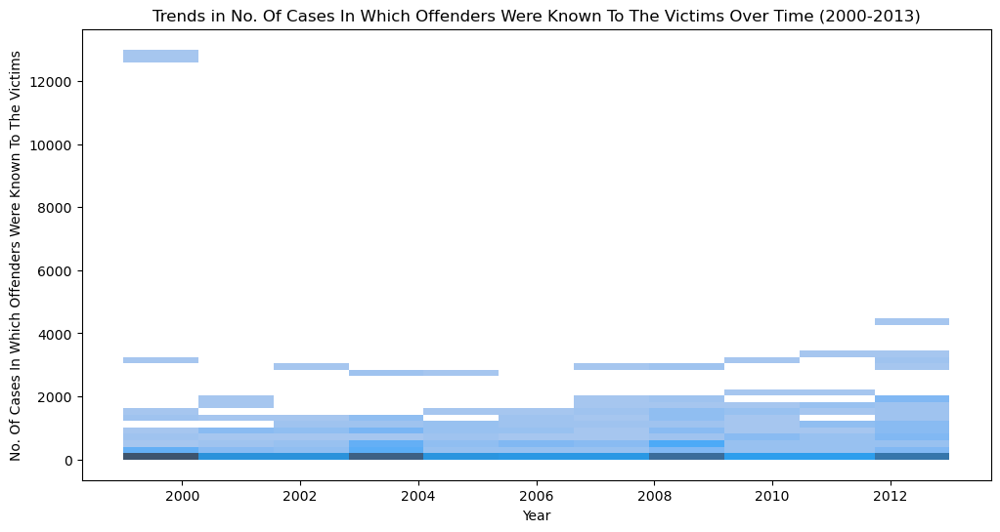

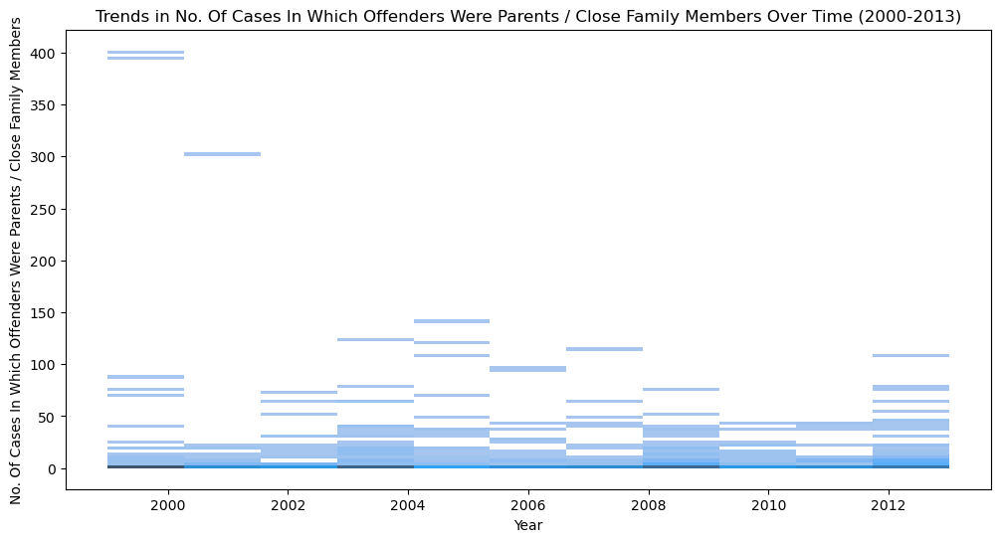

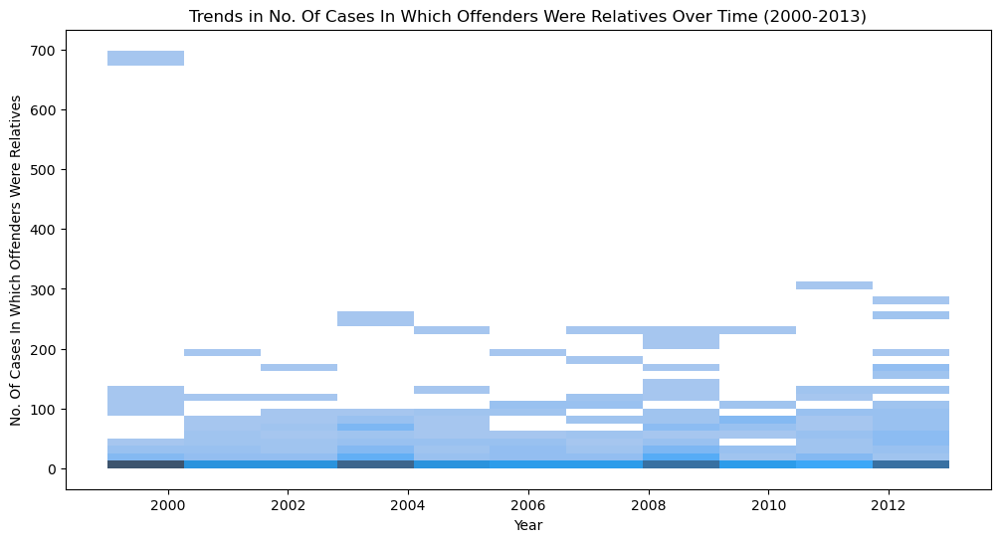

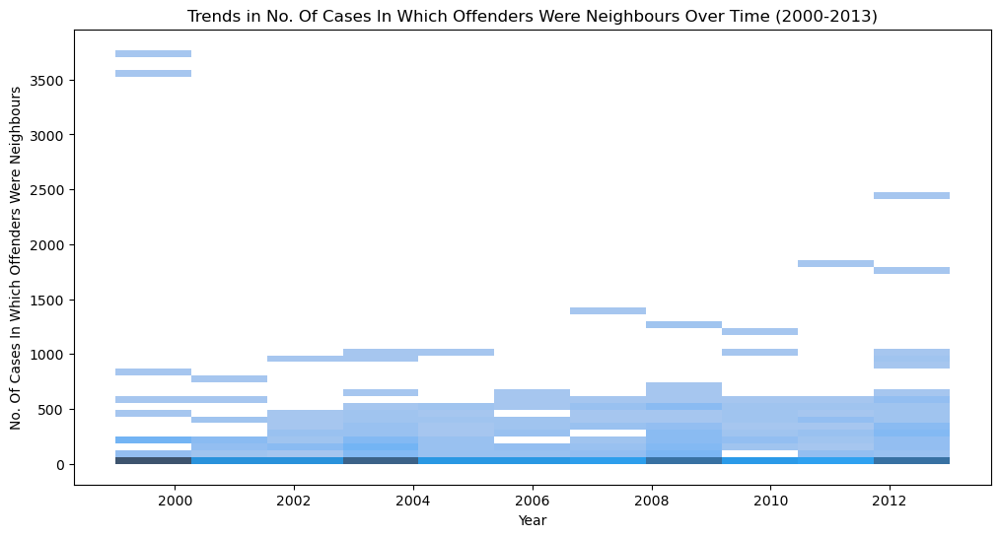

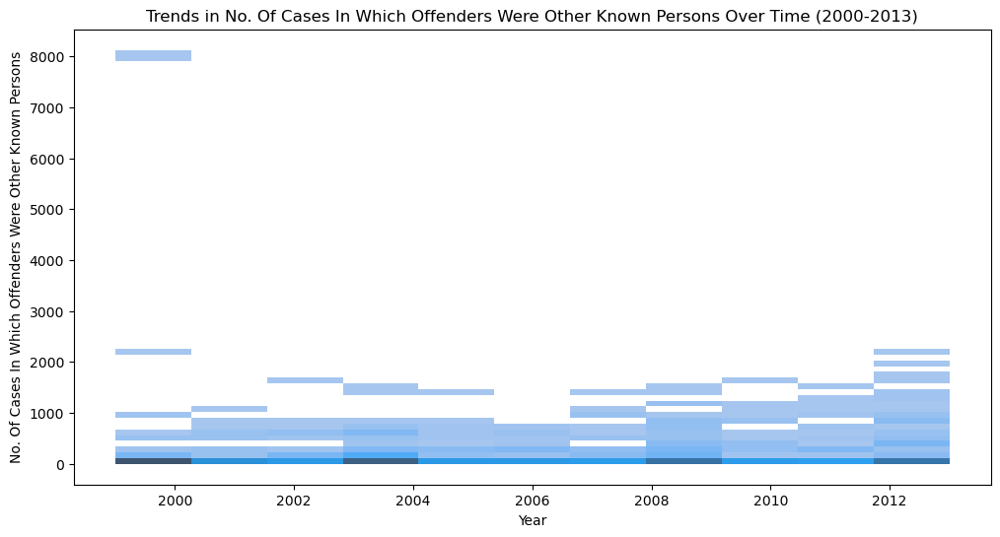

In [63]:
# Distribution of Rape Cases by Offender Type Across Years: An Exploratory Analysis

columns_to_plot = df.iloc[:,2:]

# creating a histogram for each column

for column in columns_to_plot:
    plt.figure(figsize=(12,6))
    sns.histplot(x='YEAR',y=column,data=df,kde=True)
    plt.xlabel('Year')
    plt.ylabel(column)
    plt.title(f'Trends in {column} Over Time (2000-2013)')
    plt.show()

## As per the above plots we can clearly see that the incidents are mostly by known people

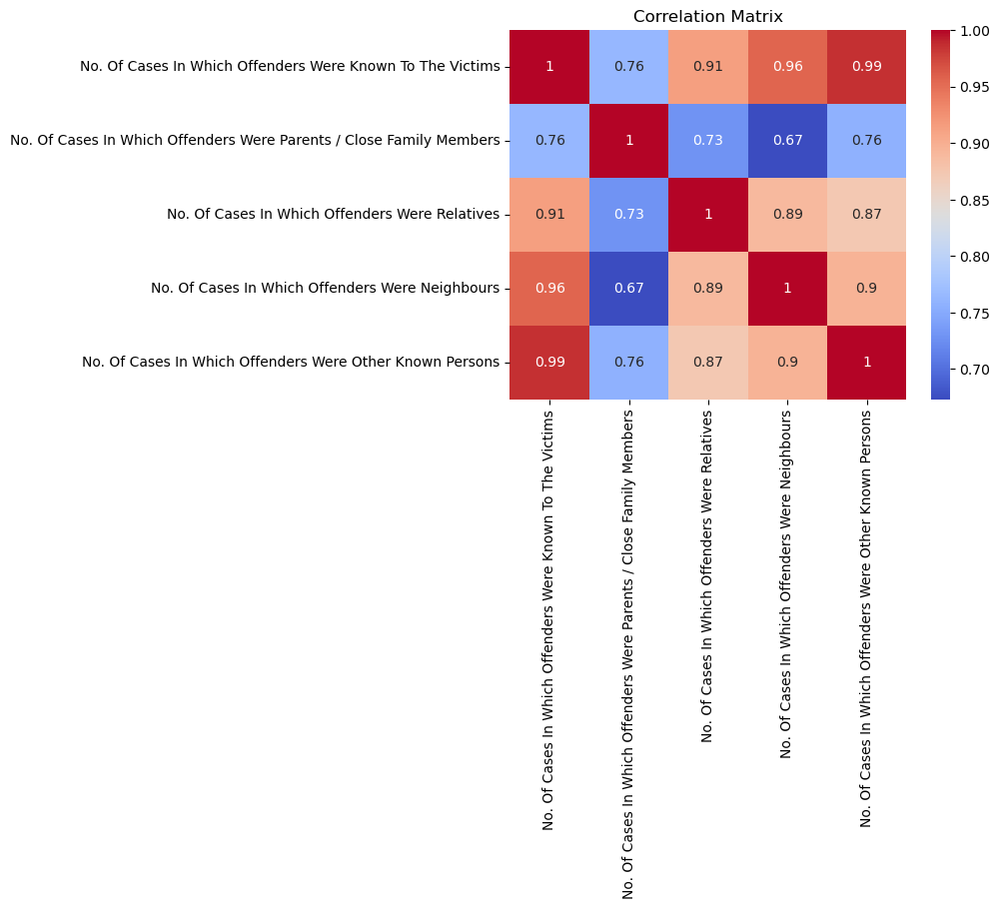

In [65]:
# Correlation Analysis

corr_matrix = df.iloc[:,2:].corr()
sns.heatmap(corr_matrix,annot=True,cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

#### The above correlation matrix is clearly showing that 'No. of cases which Offenders were known to victims' are mostly known people

##### 1. Become Victim because of the offender who happened to be a Relative is 0.91%
##### 2. Become Victim because of the offender who happened to be a Neighbour is 0.96%

### Time Series Analysis

In [70]:
# Plotting the trend over years
# Setting the YEAR as index

df_time = df.copy()
df_time.set_index('YEAR',inplace=True)

In [84]:
# Converting the YEAR the index to datetime

df_time.index = pd.to_datetime(df_time.index,format='%Y')

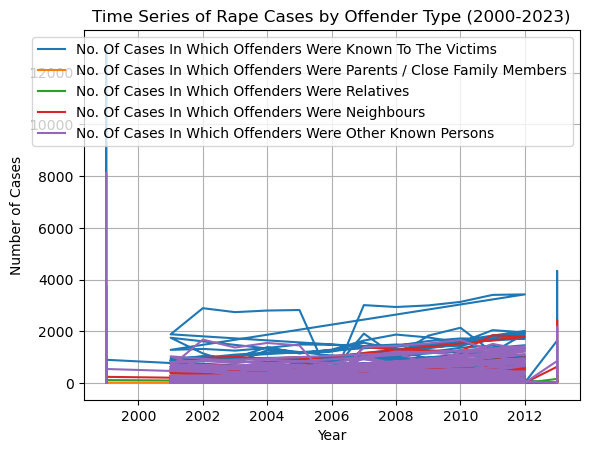

In [87]:
numeric_columns = df_time.select_dtypes(include=int)

for column in numeric_columns:
    plt.plot(df_time.index,df_time[column],label=column)

plt.xlabel('Year')
plt.ylabel('Number of Cases')
plt.title('Time Series of Rape Cases by Offender Type (2000-2023)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# as the data clearly shows some rise
# will plot one column i.e., 'No. Of Cases In Which Offenders Were Known To The Victims' as because
# known people are being a destruction . Lets analyize that section

In [89]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [107]:
# Chose a numeric column for ARIMA modeling

column = 'No. Of Cases In Which Offenders Were Known To The Victims'

# check for stationarity

result = adfuller(df_time[column].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

ADF Statistic: -4.677089563269561
p-value: 9.289972405826496e-05


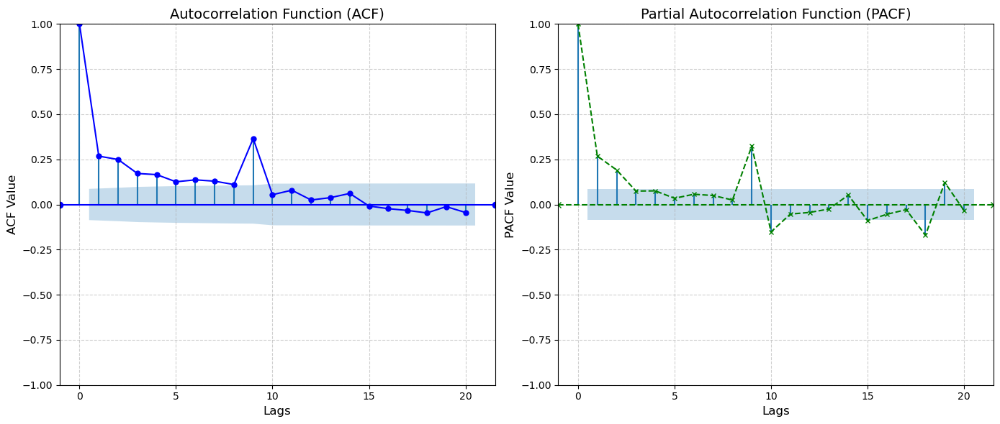

In [108]:
# Plotting ACF and PACF
plt.figure(figsize=(14, 6))

# ACF plot
plt.subplot(1, 2, 1)
plot_acf(df_time[column].dropna(), lags=20, ax=plt.gca(), color='blue', marker='o', linestyle='-')
plt.title('Autocorrelation Function (ACF)', fontsize=14)
plt.xlabel('Lags', fontsize=12)
plt.ylabel('ACF Value', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# PACF plot
plt.subplot(1, 2, 2)
plot_pacf(df_time[column].dropna(), lags=20, ax=plt.gca(), color='green', marker='x', linestyle='--')
plt.title('Partial Autocorrelation Function (PACF)', fontsize=14)
plt.xlabel('Lags', fontsize=12)
plt.ylabel('PACF Value', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

In [ ]:
'''
**  I had data of 10 years (for some states we have alone 1999 year but rest of the states 
    have from 2001-2013 historic data of No. Of Cases In Which Offenders Were Known To The Victims ) 
    as we know ACF and PACF is used to check the autocorrelation with in the previous timesteps which had a capacity to say the 
    upocoming strong effects based on the historic data in this case number of cases.

** as the ACF says the combination in effects and PACF says direct effect but both said for the upcoming 10 years numbers can
    grow certain percentage let's say PACF showed 30% as per data 9 means year 2023 according to the count of cases registered
    in the year 2013 now that should be 30% higher.

** as we are currently ahead of the curve we observed the happenings happened happening, see i have no data hence i couldn't 
able to predict the future i mean till 2024

** now we will use a techinque called data augmentation we use standard normal disribution technique so that we can have 
the predicted data to mean 0 and std of 1 for our previous data range

'''


In [193]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from scipy.stats import norm

In [175]:
# lets augment the data using TensorFlow
# upon augmentating the data to the till year we will try to predict any state as we have many states ( me: feeling ashmae)


# as the base data was cleand i am preparing another copy of it

df_model = df.copy()
df_model.dtypes  # we have copied the data verified by checking the data types as the uncleaned was all objects

df_model.head()


,STATE/UT,YEAR,No. Of Cases In Which Offenders Were Known To The Victims,No. Of Cases In Which Offenders Were Parents / Close Family Members,No. Of Cases In Which Offenders Were Relatives,No. Of Cases In Which Offenders Were Neighbours,No. Of Cases In Which Offenders Were Other Known Persons
0,Andhra Pradesh,2001,871,4,81,247,539
1,Andhra Pradesh,2002,999,5,94,302,598
2,Andhra Pradesh,2003,946,15,82,299,550
3,Andhra Pradesh,2004,924,5,69,313,537
4,Andhra Pradesh,2005,935,18,98,399,420


In [176]:
df_model.dtypes

STATE/UT                                                               object
YEAR                                                                    int64
No. Of Cases In Which Offenders Were Known To The Victims               int64
No. Of Cases In Which Offenders Were Parents / Close Family Members     int32
No. Of Cases In Which Offenders Were Relatives                          int64
No. Of Cases In Which Offenders Were Neighbours                         int64
No. Of Cases In Which Offenders Were Other Known Persons                int64
dtype: object

In [177]:
# converting the date column to dateformat 'Y'

df_model['YEAR'] = pd.to_datetime(df['YEAR'],format='%Y')

In [178]:
df_model.dtypes

STATE/UT                                                                       object
YEAR                                                                   datetime64[ns]
No. Of Cases In Which Offenders Were Known To The Victims                       int64
No. Of Cases In Which Offenders Were Parents / Close Family Members             int32
No. Of Cases In Which Offenders Were Relatives                                  int64
No. Of Cases In Which Offenders Were Neighbours                                 int64
No. Of Cases In Which Offenders Were Other Known Persons                        int64
dtype: object

In [179]:
# creating YEAR and STATE as index

df_model.set_index(['YEAR','STATE/UT'],inplace=True)

In [180]:
df_model.index

MultiIndex([('2001-01-01', 'Andhra Pradesh'),
            ('2002-01-01', 'Andhra Pradesh'),
            ('2003-01-01', 'Andhra Pradesh'),
            ('2004-01-01', 'Andhra Pradesh'),
            ('2005-01-01', 'Andhra Pradesh'),
            ('2006-01-01', 'Andhra Pradesh'),
            ('2007-01-01', 'Andhra Pradesh'),
            ('2008-01-01', 'Andhra Pradesh'),
            ('2009-01-01', 'Andhra Pradesh'),
            ('2010-01-01', 'Andhra Pradesh'),
            ...
            ('1999-01-01',       'Ludhiana'),
            ('1999-01-01',        'Madurai'),
            ('1999-01-01',         'Mumbai'),
            ('1999-01-01',         'Nagpur'),
            ('1999-01-01',          'Patna'),
            ('1999-01-01',           'Pune'),
            ('1999-01-01',          'Surat'),
            ('1999-01-01',        'Vadodra'),
            ('1999-01-01',       'Varanasi'),
            ('1999-01-01', 'Vishakhapatnam')],
           names=['YEAR', 'STATE/UT'], length=513)

In [161]:
df_model.isnull().sum() # we have 0 null values in the date

No. Of Cases In Which Offenders Were Known To The Victims              0
No. Of Cases In Which Offenders Were Parents / Close Family Members    0
No. Of Cases In Which Offenders Were Relatives                         0
No. Of Cases In Which Offenders Were Neighbours                        0
No. Of Cases In Which Offenders Were Other Known Persons               0
dtype: int64

In [167]:
# Getting the list of the states
# as we decied to predict the model per state, and since we are having 'STATE/UT',YEAR as the index of the data we are 
# using a method called .index.get_level_values() this will take a column value of the index and will create a index value
# for that column in this example state 

states = df_model.index.get_level_values('STATE/UT').unique()
print(states)

Index(['Andhra Pradesh', 'Arunachal Pradesh', 'Assam', 'Bihar', 'Chhattisgarh',
       'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu & Kashmir',
       'Jharkhand', 'Karnataka', 'Kerala', 'Madhya Pradesh', 'Maharashtra',
       'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Punjab',
       'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Tripura', 'Uttar Pradesh',
       'Uttarakhand', 'West Bengal', 'A&N Islands', 'Chandigarh', 'D&N Haveli',
       'Daman & Diu', 'Delhi UT', 'Lakshadweep', 'Puducherry',
       'jammu & Kashmir', 'Orissa', 'Total States', 'A & N Islands',
       'D & N Haveli', 'Daman & DIU', 'Delhi', 'Lakshadeep', 'Pondicherry',
       'Total (UTs)', 'Total (All-India)', 'Ahmedabad', 'Bangalore', 'Bhopal',
       'Calcutta', 'Chennai', 'Coimbatore', 'Hyderabad', 'Indore', 'Jaipur',
       'Kanpur', 'Kochi', 'Lucknow', 'Ludhiana', 'Madurai', 'Mumbai', 'Nagpur',
       'Patna', 'Pune', 'Surat', 'Vadodra', 'Varanasi', 'Vishakhapatnam'],
      dtype='object', na

In [ ]:
# # Splitting the data into training data and test data
# from sklearn.model_selection import train_test_split
# train_data, test_data = train_test_split(state_data,test_size=0.2,)

In [189]:
# Hyperparameters for LSTM Model

n_input = 6 # number of previous time stamps
n_years_features = 15
epochs = 50
batch_size = 1

In [190]:
df_model

No. Of Cases In Which Offenders Were Known To The Victims  \
YEAR       STATE/UT                                                                    
2001-01-01 Andhra Pradesh                                                871           
2002-01-01 Andhra Pradesh                                                999           
2003-01-01 Andhra Pradesh                                                946           
2004-01-01 Andhra Pradesh                                                924           
2005-01-01 Andhra Pradesh                                                935           
...                                                                      ...           
1999-01-01 Pune                                                           51           
           Surat                                                          17           
           Vadodra                                                        10           
           Varanasi                                                        0           
           Vishakhapatnam                                                 17           

                           No. Of Cases In Which Offenders Were Parents / Close Family Members  \
YEAR       STATE/UT                                                                              
2001-01-01 Andhra Pradesh                                                  4                     
2002-01-01 Andhra Pradesh                                                  5                     
2003-01-01 Andhra Pradesh                                                 15                     
2004-01-01 Andhra Pradesh                                                  5                     
2005-01-01 Andhra Pradesh                                                 18                     
...                                                                      ...                     
1999-01-01 Pune                                                            1                     
           Surat                                                           0                     
           Vadodra                                                         0                     
           Varanasi                                                        0                     
           Vishakhapatnam                                                  0                     

                           No. Of Cases In Which Offenders Were Relatives  \
YEAR       STATE/UT                                                         
2001-01-01 Andhra Pradesh                                              81   
2002-01-01 Andhra Pradesh                                              94   
2003-01-01 Andhra Pradesh                                              82   
2004-01-01 Andhra Pradesh                                              69   
2005-01-01 Andhra Pradesh                                              98   
...                                                                   ...   
1999-01-01 Pune                                                         1   
           Surat                                                        0   
           Vadodra                                                      0   
           Varanasi                                                     0   
           Vishakhapatnam                                               0   

                           No. Of Cases In Which Offenders Were Neighbours  \
YEAR       STATE/UT                                                          
2001-01-01 Andhra Pradesh                                              247   
2002-01-01 Andhra Pradesh                                              302   
2003-01-01 Andhra Pradesh                                              299   
2004-01-01 Andhra Pradesh                                              313   
2005-01-01 Andhra Pradesh                                              399   
...                                                        

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1822

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1892 - val_loss: 0.1306
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1483 - val_loss: 0.0696
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0480 - val_loss: 0.0666
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0760 - val_loss: 0.0638
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0675 - val_loss: 0.0626
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0747 - val_loss: 0.0615
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0657 - val_loss: 0.0606
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0624 - val_loss: 0.0615
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0563 - val_loss: 0.0600
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0676 - val_loss: 0.0591
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0602 - val_loss: 0.0580
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0534 - val_loss: 0.0575

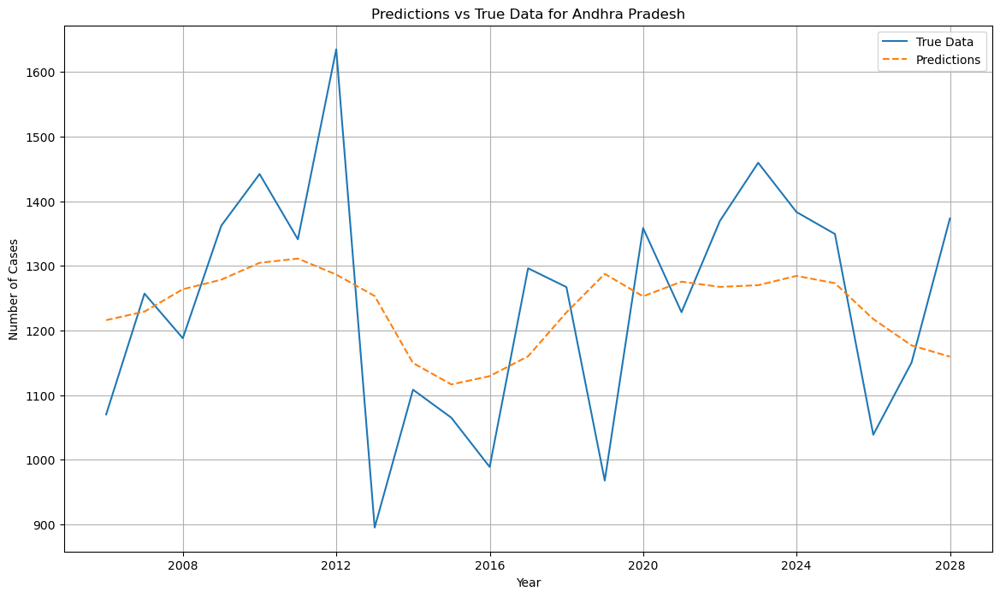

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2225

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2026 - val_loss: 0.0893
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1345 - val_loss: 0.0599
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0731 - val_loss: 0.0594
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0558 - val_loss: 0.0583
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0532 - val_loss: 0.0581
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0600 - val_loss: 0.0571
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0624 - val_loss: 0.0566
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0549 - val_loss: 0.0575
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0769 - val_loss: 0.0558
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0716 - val_loss: 0.0567
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0404 - val_loss: 0.0555
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0313 - val_loss: 0.0554

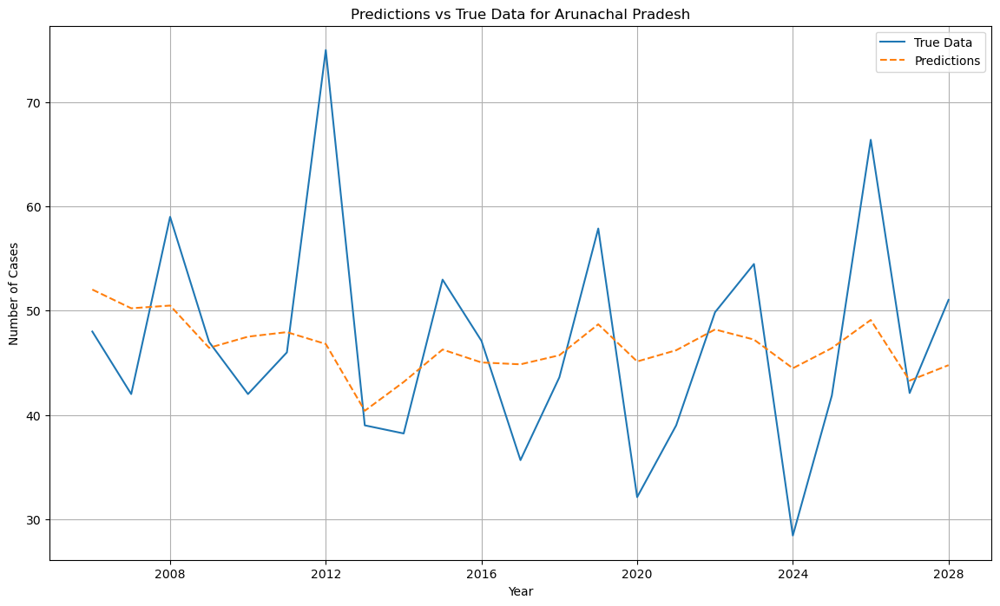

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2821

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.2849 - val_loss: 0.2295
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2589 - val_loss: 0.0992
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0854 - val_loss: 0.0736
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0954 - val_loss: 0.0706
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0551 - val_loss: 0.0705
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1041 - val_loss: 0.0702
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0517 - val_loss: 0.0693
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0623 - val_loss: 0.0704
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0580 - val_loss: 0.0695
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0826 - val_loss: 0.0693
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0580 - val_loss: 0.0683
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0971 - val_loss: 0.0686

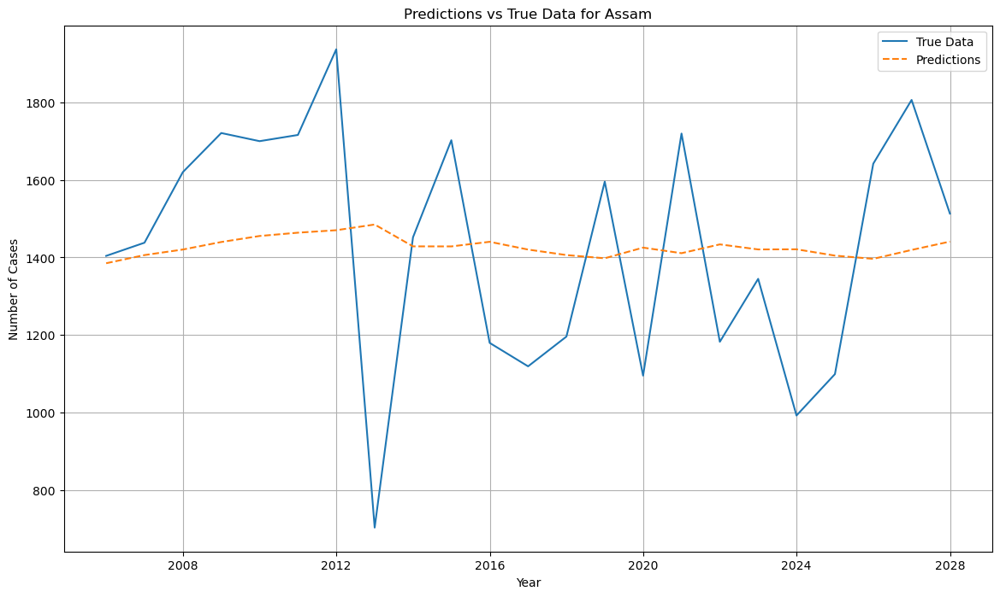

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2036

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.2016 - val_loss: 0.1300
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1299 - val_loss: 0.0778
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0667 - val_loss: 0.0712
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0741 - val_loss: 0.0706
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0960 - val_loss: 0.0699
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0512 - val_loss: 0.0698
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0591 - val_loss: 0.0695
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0954 - val_loss: 0.0691
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0640 - val_loss: 0.0689
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0616 - val_loss: 0.0696
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1090 - val_loss: 0.0681
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0486 - val_loss: 0.0678

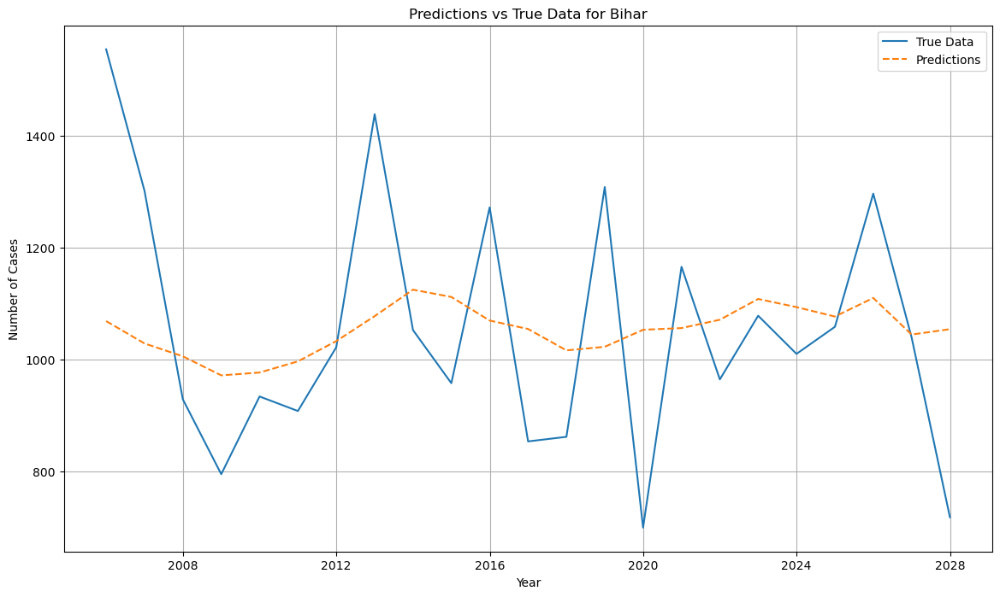

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/22 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - loss: 0.1402

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.2831 - val_loss: 0.1277
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1056 - val_loss: 0.0561
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0581 - val_loss: 0.0426
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0548 - val_loss: 0.0413
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0241 - val_loss: 0.0413
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0286 - val_loss: 0.0415
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0216 - val_loss: 0.0411
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0272 - val_loss: 0.0416
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0423 - val_loss: 0.0406
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0179 - val_loss: 0.0406
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0361 - val_loss: 0.0403
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0502 - val_loss: 0.0402

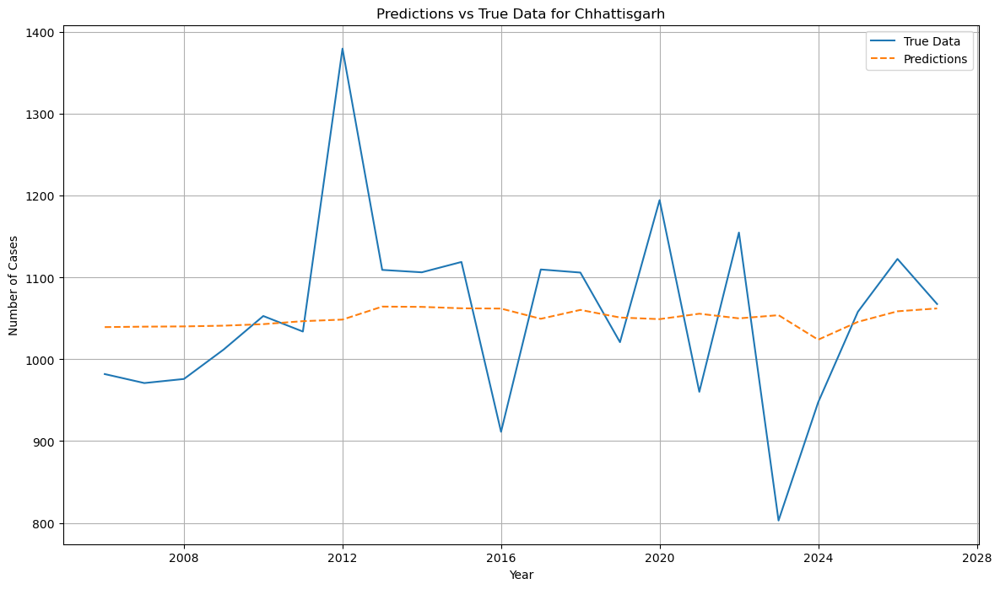

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/23 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - loss: 0.0424

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1377 - val_loss: 0.1115
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1322 - val_loss: 0.0749
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0489 - val_loss: 0.0641
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0697 - val_loss: 0.0637
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0505 - val_loss: 0.0632
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0502 - val_loss: 0.0631
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0683 - val_loss: 0.0622
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0668 - val_loss: 0.0621
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0517 - val_loss: 0.0618
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0566 - val_loss: 0.0614
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0758 - val_loss: 0.0608
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0637 - val_loss: 0.0609

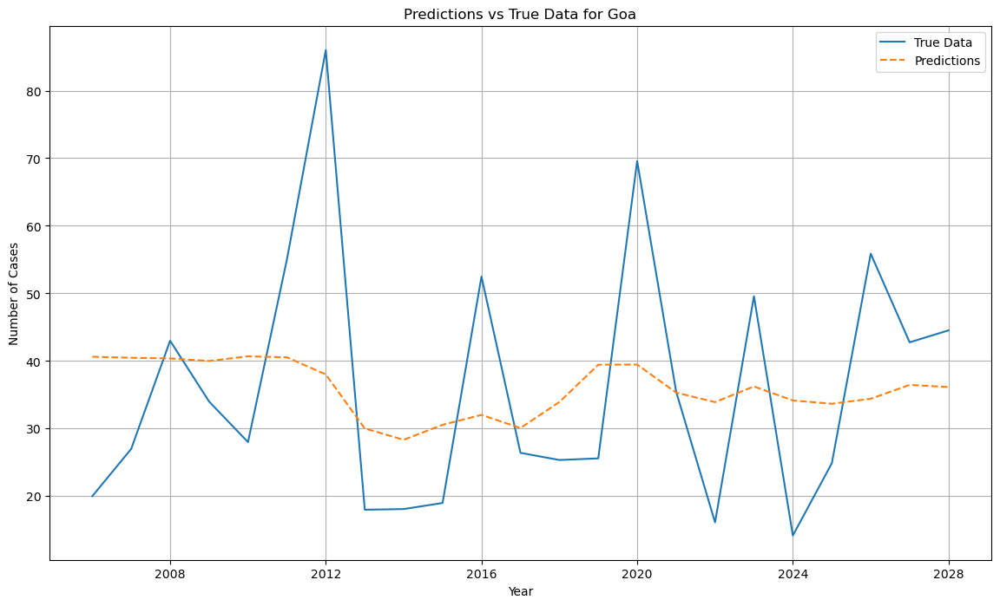

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1480

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.1476 - val_loss: 0.1052
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0715 - val_loss: 0.0486
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0437 - val_loss: 0.0480
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0761 - val_loss: 0.0475
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0370 - val_loss: 0.0484
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0368 - val_loss: 0.0470
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0370 - val_loss: 0.0470
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0560 - val_loss: 0.0467
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0297 - val_loss: 0.0464
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0564 - val_loss: 0.0461
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0359 - val_loss: 0.0459
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0387 - val_loss: 0.0458

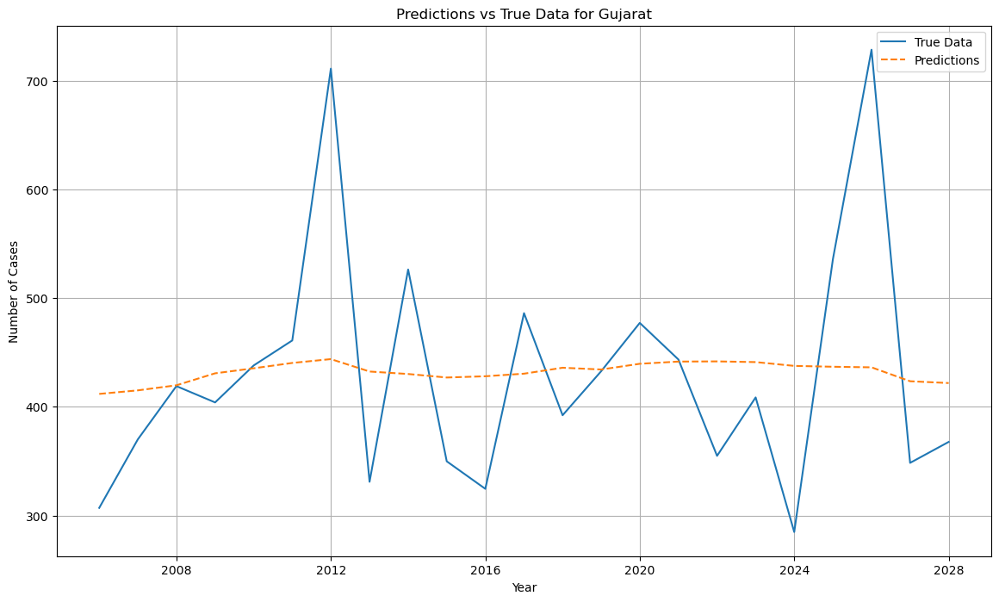

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2366

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.2330 - val_loss: 0.1301
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1111 - val_loss: 0.0761
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0937 - val_loss: 0.0756
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0847 - val_loss: 0.0765
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1050 - val_loss: 0.0748
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0961 - val_loss: 0.0744
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0746 - val_loss: 0.0740
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0971 - val_loss: 0.0737
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0691 - val_loss: 0.0733
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0807 - val_loss: 0.0739
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0617 - val_loss: 0.0731
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0641 - val_loss: 0.0727

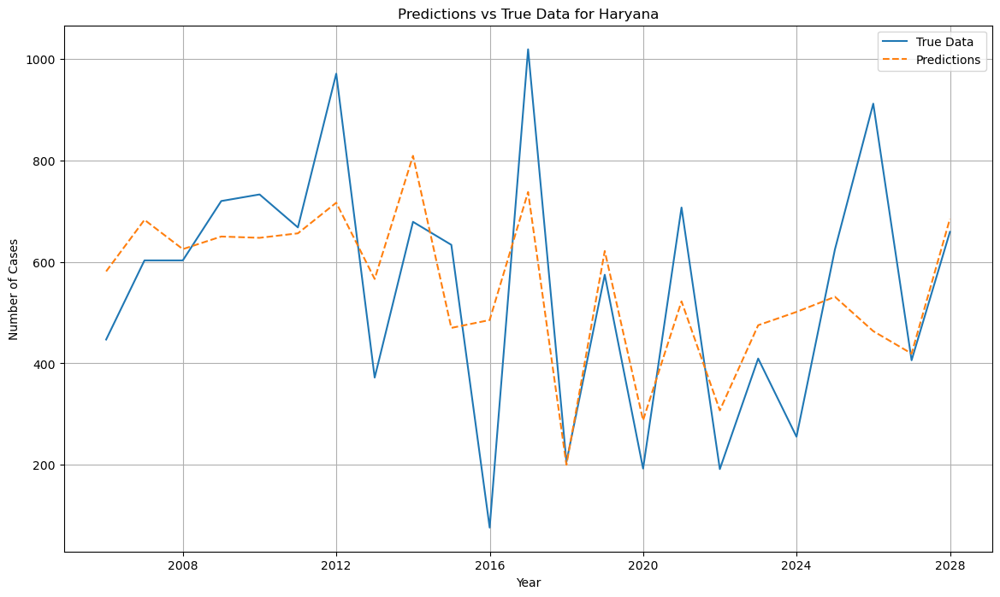

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3371

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.3292 - val_loss: 0.1637
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1459 - val_loss: 0.0633
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0585 - val_loss: 0.0453
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0297 - val_loss: 0.0457
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0536 - val_loss: 0.0447
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0322 - val_loss: 0.0444
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0719 - val_loss: 0.0442
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0491 - val_loss: 0.0441
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0428 - val_loss: 0.0441
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0288 - val_loss: 0.0447
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0652 - val_loss: 0.0435
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0575 - val_loss: 0.0434

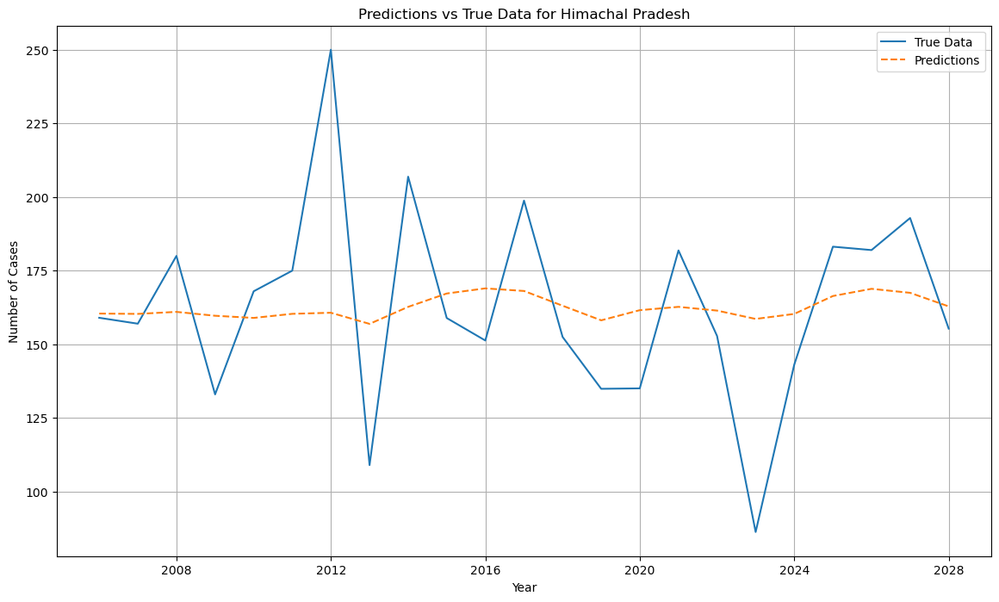

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2594

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2560 - val_loss: 0.1118
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0864 - val_loss: 0.0594
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0432 - val_loss: 0.0569
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0712 - val_loss: 0.0562
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0514 - val_loss: 0.0560
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0531 - val_loss: 0.0564
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0486 - val_loss: 0.0550
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0459 - val_loss: 0.0547
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0448 - val_loss: 0.0543
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0720 - val_loss: 0.0537
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0509 - val_loss: 0.0535
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0635 - val_loss: 0.0530

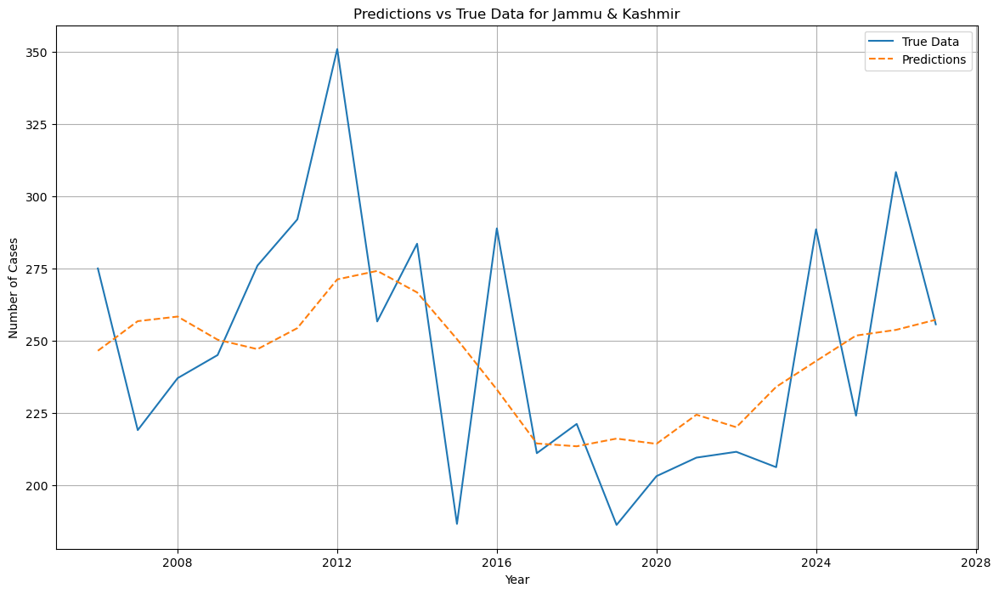

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3043

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.2849 - val_loss: 0.1151
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0800 - val_loss: 0.0611
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0464 - val_loss: 0.0602
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0752 - val_loss: 0.0590
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0778 - val_loss: 0.0581
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0329 - val_loss: 0.0582
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0801 - val_loss: 0.0560
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0348 - val_loss: 0.0559
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0667 - val_loss: 0.0546
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0694 - val_loss: 0.0550
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0507 - val_loss: 0.0529
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0635 - val_loss: 0.0522

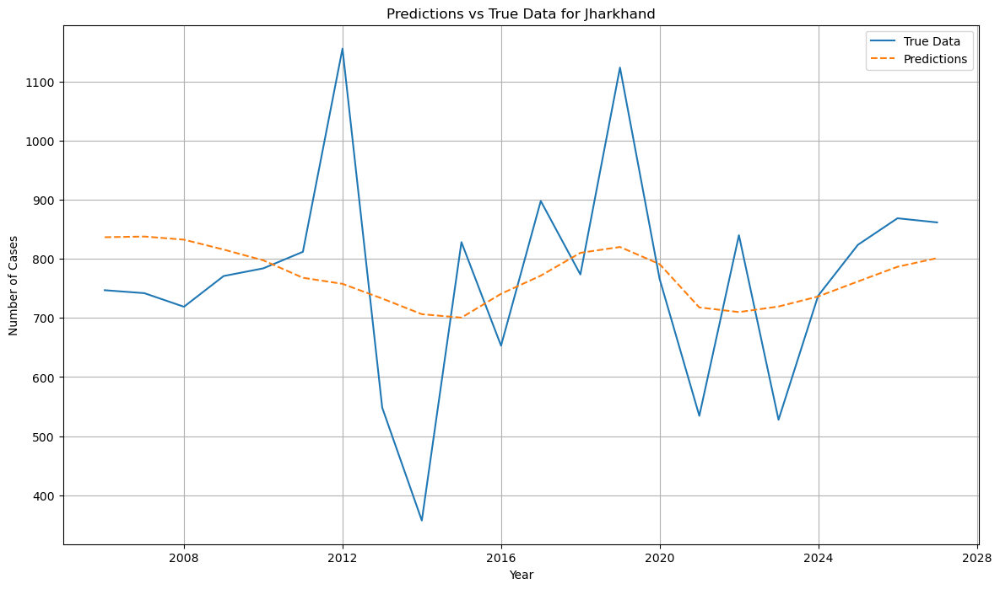

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/23 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - loss: 0.0262

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.1177 - val_loss: 0.0952
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1110 - val_loss: 0.0593
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0380 - val_loss: 0.0590
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0998 - val_loss: 0.0586
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0559 - val_loss: 0.0584
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0455 - val_loss: 0.0582
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0808 - val_loss: 0.0580
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0624 - val_loss: 0.0578
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0404 - val_loss: 0.0582
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0688 - val_loss: 0.0576
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0413 - val_loss: 0.0579
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0912 - val_loss: 0.0571

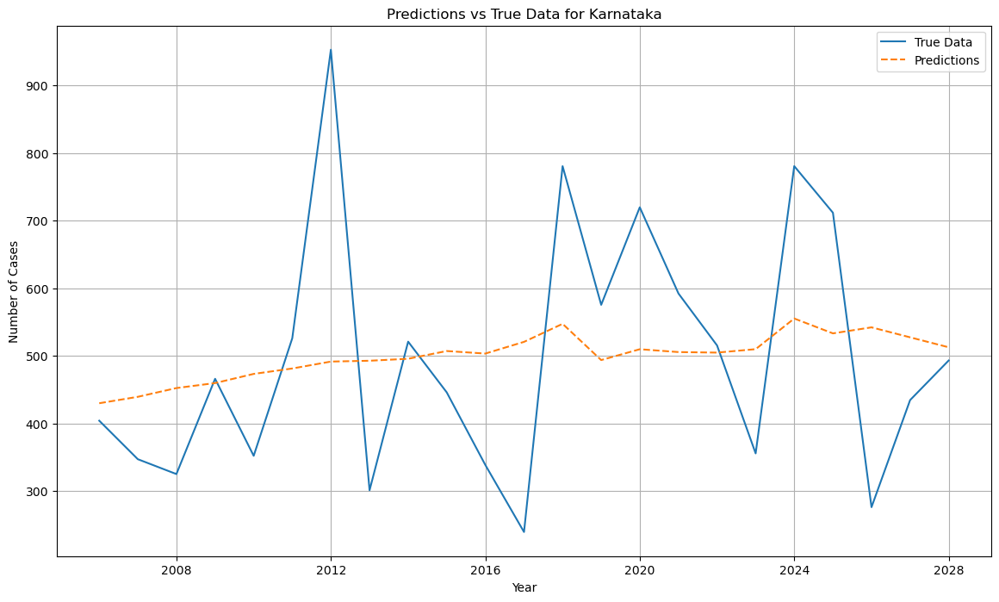

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3025 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.2980 - val_loss: 0.1938
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1665 - val_loss: 0.0767
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0595 - val_loss: 0.0632
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0720 - val_loss: 0.0604
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0703 - val_loss: 0.0601
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0512 - val_loss: 0.0600
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0547 - val_loss: 0.0598
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0751 - val_loss: 0.0600
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0995 - val_loss: 0.0616
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0982 - val_loss: 0.0595
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0429 - val_loss: 0.0597
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0625 - val_loss: 0.0594

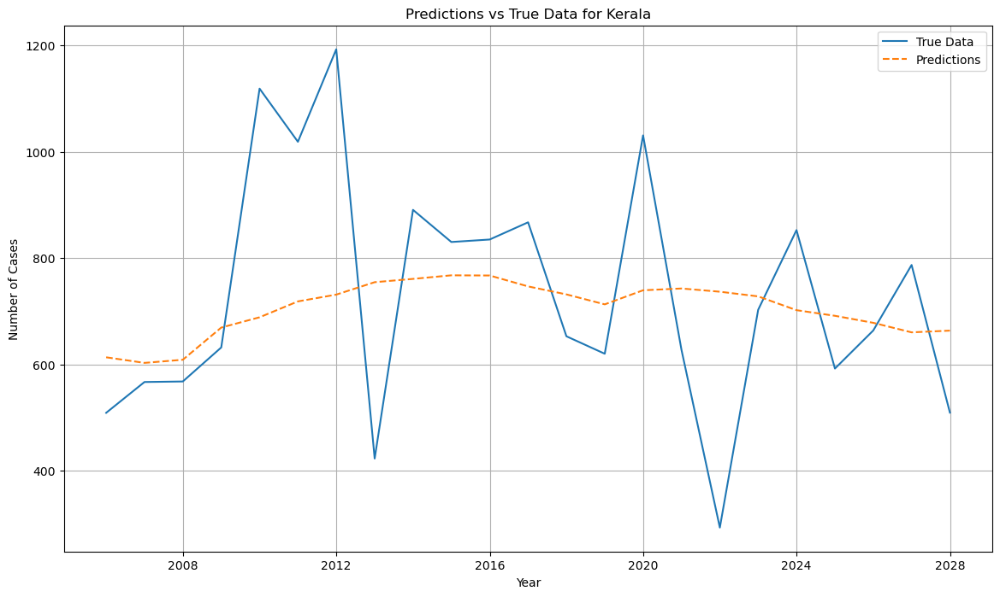

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4324

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.4322 - val_loss: 0.2540
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1689 - val_loss: 0.0405
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0589 - val_loss: 0.0416
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0521 - val_loss: 0.0396
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0356 - val_loss: 0.0389
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0370 - val_loss: 0.0386
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0739 - val_loss: 0.0383
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0212 - val_loss: 0.0383
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0465 - val_loss: 0.0376
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0487 - val_loss: 0.0379
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0202 - val_loss: 0.0382
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0339 - val_loss: 0.0367

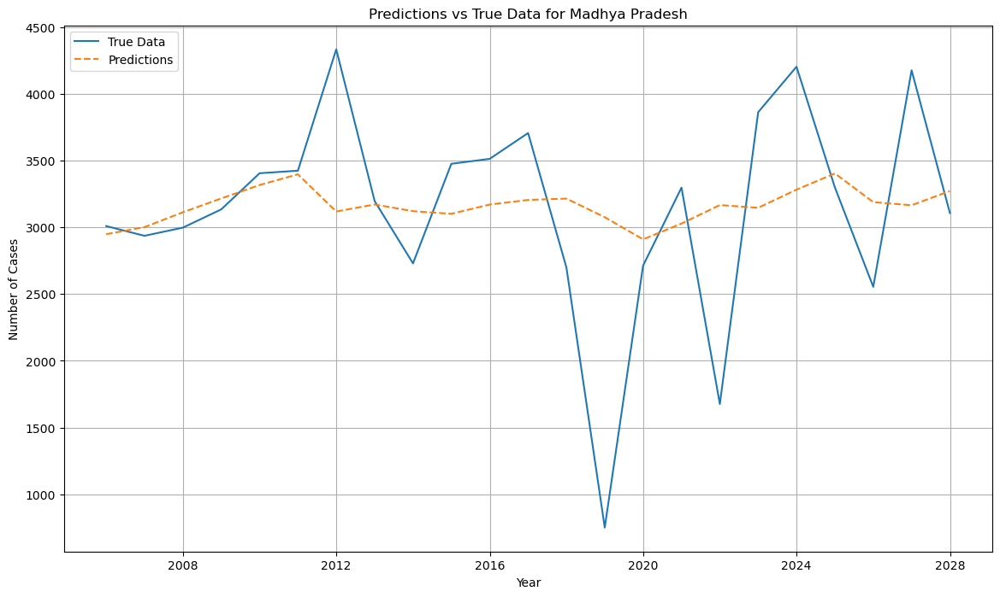

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0932

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0947 - val_loss: 0.0768
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0686 - val_loss: 0.0520
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1112 - val_loss: 0.0491
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0543 - val_loss: 0.0490
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0293 - val_loss: 0.0489
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0395 - val_loss: 0.0488
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1075 - val_loss: 0.0485
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0543 - val_loss: 0.0489
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0448 - val_loss: 0.0484
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0483 - val_loss: 0.0481
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0358 - val_loss: 0.0479
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0758 - val_loss: 0.0483

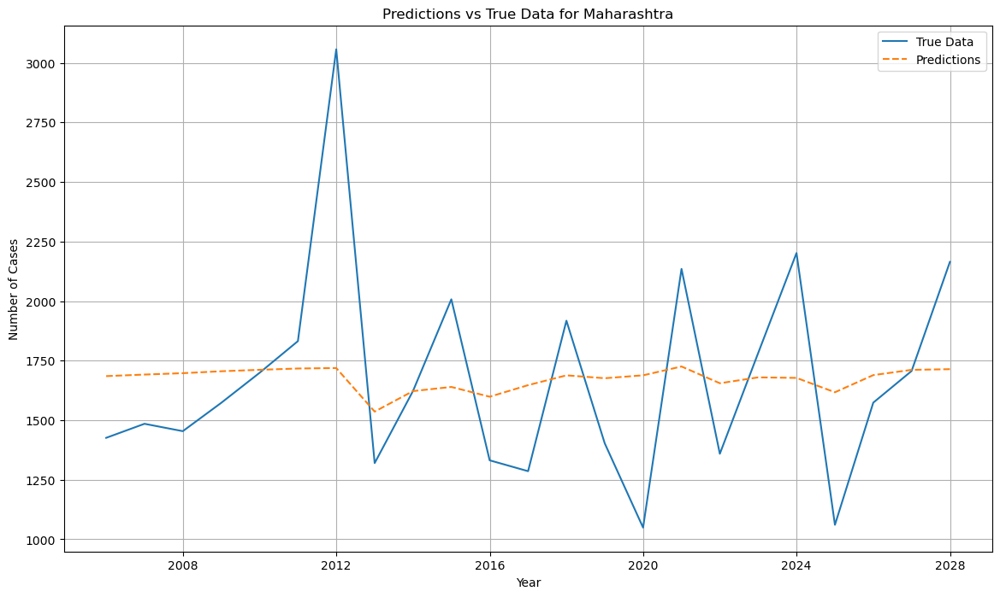

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1548

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1600 - val_loss: 0.1049
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0677 - val_loss: 0.0627
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0428 - val_loss: 0.0607
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0360 - val_loss: 0.0625
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0591 - val_loss: 0.0593
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0762 - val_loss: 0.0588
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0842 - val_loss: 0.0583
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0699 - val_loss: 0.0577
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0654 - val_loss: 0.0575
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0543 - val_loss: 0.0569
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0491 - val_loss: 0.0567
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0591 - val_loss: 0.0561

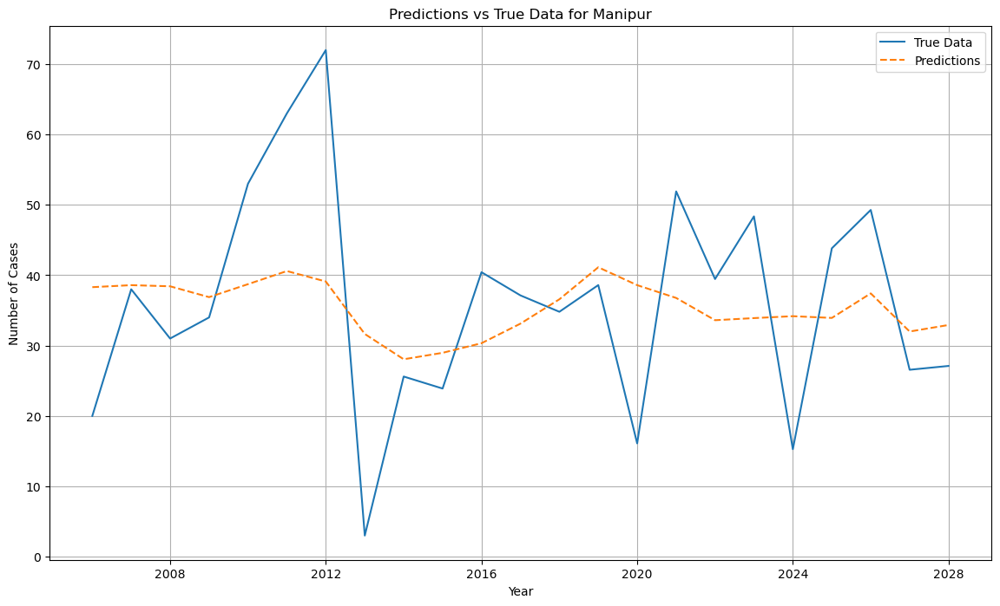

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2640

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2651 - val_loss: 0.2211
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1792 - val_loss: 0.1262
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1109 - val_loss: 0.0850
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0939 - val_loss: 0.0840
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0908 - val_loss: 0.0873
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1112 - val_loss: 0.0830
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0920 - val_loss: 0.0831
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1048 - val_loss: 0.0814
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0766 - val_loss: 0.0810
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0839 - val_loss: 0.0804
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0966 - val_loss: 0.0806
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0808 - val_loss: 0.0802

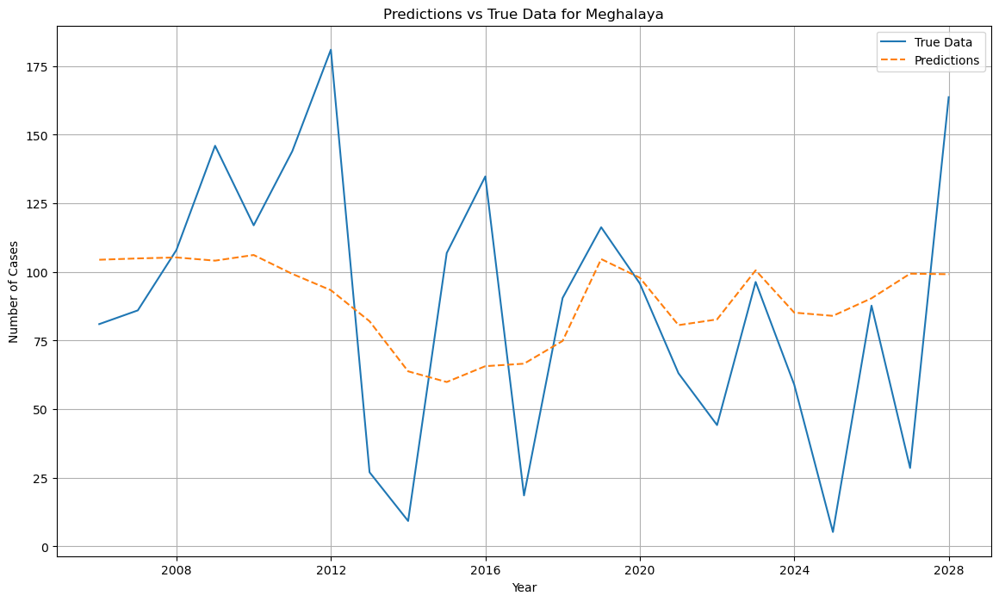

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4729

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.4268 - val_loss: 0.2349
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1563 - val_loss: 0.0986
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1189 - val_loss: 0.0845
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0668 - val_loss: 0.0847
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0728 - val_loss: 0.0852
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0657 - val_loss: 0.0846
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0796 - val_loss: 0.0847
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0608 - val_loss: 0.0845
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0711 - val_loss: 0.0841
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1014 - val_loss: 0.0841
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0842 - val_loss: 0.0856
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1156 - val_loss: 0.0841

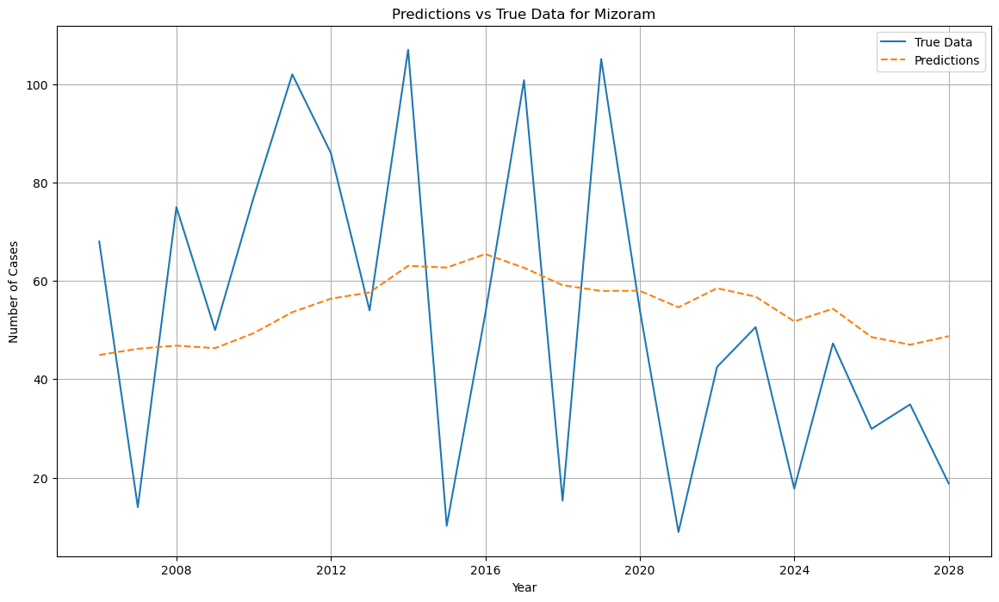

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1505

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1497 - val_loss: 0.1036
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0537 - val_loss: 0.0553
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0603 - val_loss: 0.0447
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0441 - val_loss: 0.0443
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0432 - val_loss: 0.0447
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0355 - val_loss: 0.0442
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0257 - val_loss: 0.0440
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0275 - val_loss: 0.0438
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0320 - val_loss: 0.0435
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0386 - val_loss: 0.0433
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0469 - val_loss: 0.0432
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0628 - val_loss: 0.043

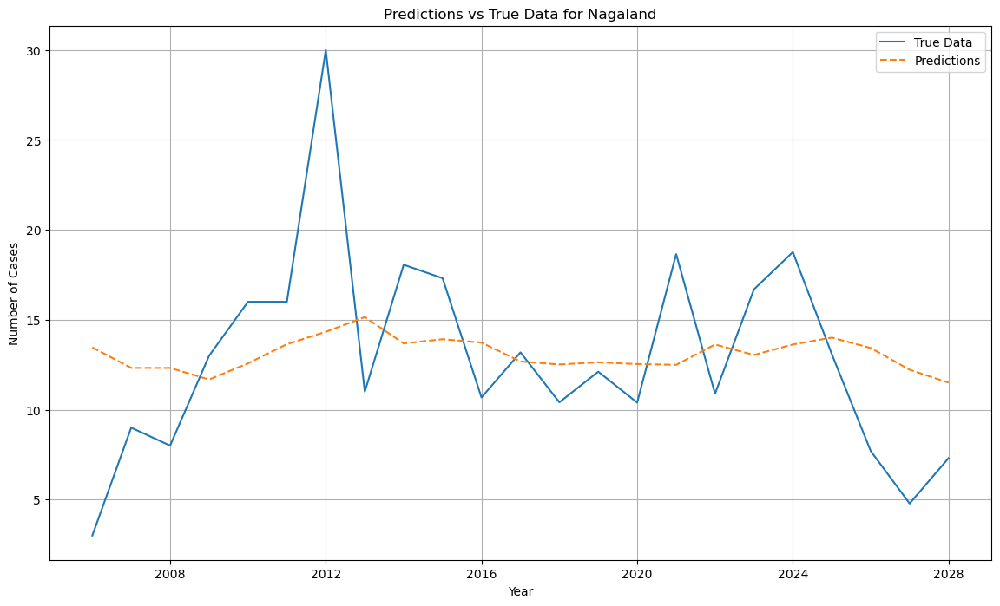

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1154

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.1209 - val_loss: 0.1037
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0851 - val_loss: 0.0691
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0873 - val_loss: 0.0681
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0621 - val_loss: 0.0680
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0597 - val_loss: 0.0668
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0818 - val_loss: 0.0665
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0591 - val_loss: 0.0665
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0617 - val_loss: 0.0652
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0956 - val_loss: 0.0654
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0665 - val_loss: 0.0641
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0638 - val_loss: 0.0636
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0597 - val_loss: 0.0635

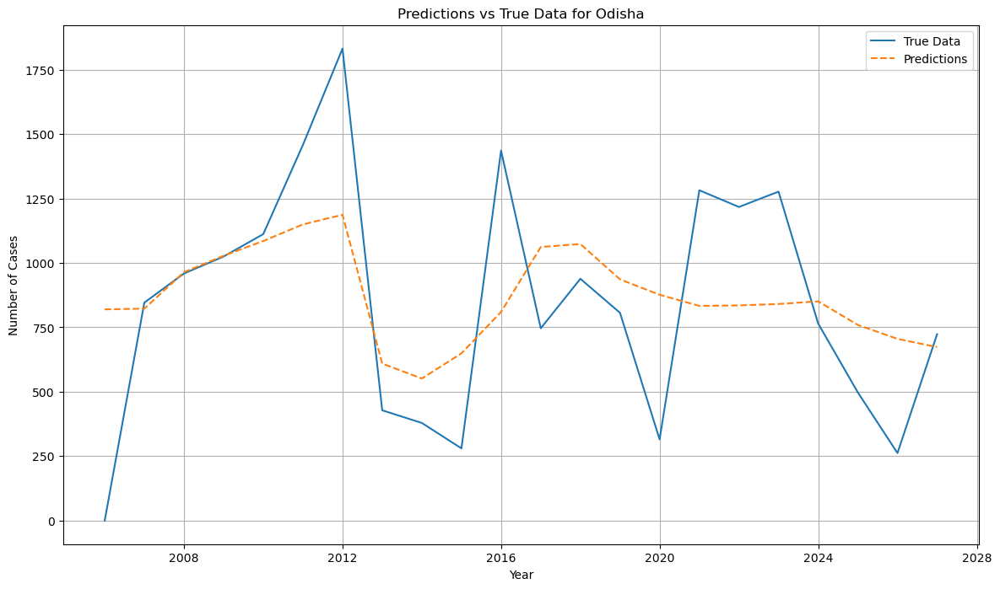

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2328

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2259 - val_loss: 0.1344
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1658 - val_loss: 0.0722
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0838 - val_loss: 0.0663
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0696 - val_loss: 0.0655
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0606 - val_loss: 0.0650
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0888 - val_loss: 0.0655
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0613 - val_loss: 0.0651
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0870 - val_loss: 0.0644
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0480 - val_loss: 0.0637
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0820 - val_loss: 0.0632
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0422 - val_loss: 0.0625
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0736 - val_loss: 0.0623

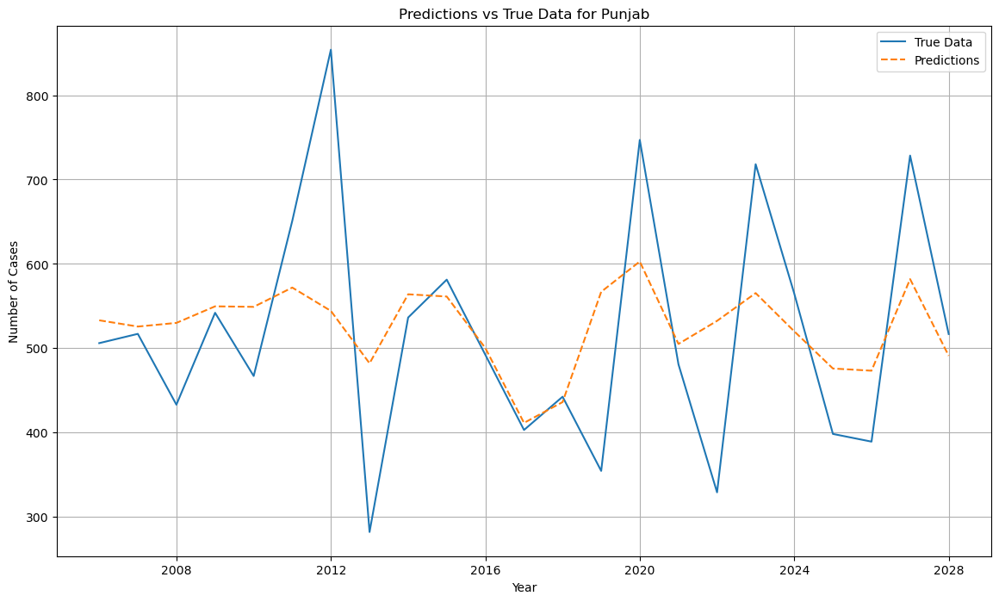

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1482

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.1467 - val_loss: 0.0993
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1089 - val_loss: 0.0686
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0757 - val_loss: 0.0618
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0782 - val_loss: 0.0612
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0620 - val_loss: 0.0602
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0591 - val_loss: 0.0599
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0737 - val_loss: 0.0595
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0590 - val_loss: 0.0590
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0563 - val_loss: 0.0591
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0587 - val_loss: 0.0583
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0525 - val_loss: 0.0579
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0603 - val_loss: 0.0575

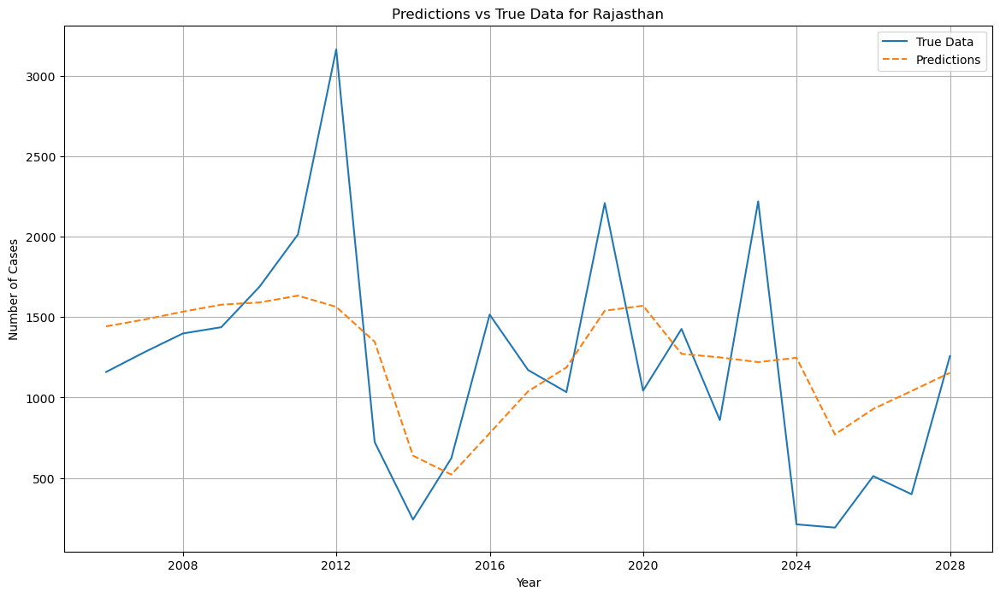

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/23 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - loss: 0.0853

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.2787 - val_loss: 0.1666
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1315 - val_loss: 0.0686
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0619 - val_loss: 0.0633
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0615 - val_loss: 0.0628
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0675 - val_loss: 0.0632
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0376 - val_loss: 0.0650
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0620 - val_loss: 0.0620
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0553 - val_loss: 0.0619
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0854 - val_loss: 0.0619
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0625 - val_loss: 0.0619
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0568 - val_loss: 0.0613
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0484 - val_loss: 0.0613

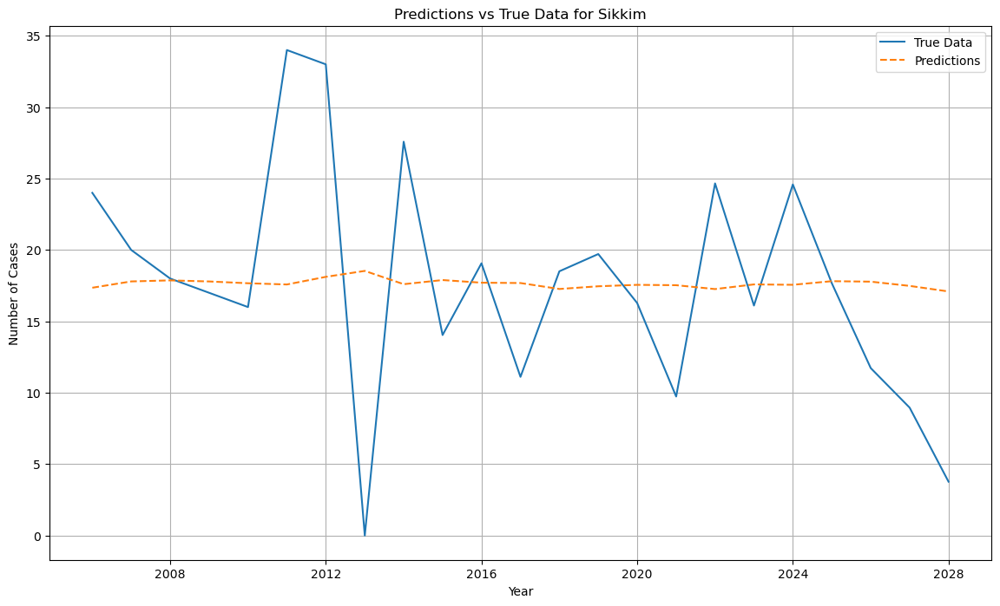

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2111

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.2163 - val_loss: 0.1614
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1051 - val_loss: 0.0811
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0612 - val_loss: 0.0811
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1167 - val_loss: 0.0820
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0960 - val_loss: 0.0806
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1068 - val_loss: 0.0808
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0695 - val_loss: 0.0809
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0820 - val_loss: 0.0796
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0945 - val_loss: 0.0800
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0805 - val_loss: 0.0800
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1030 - val_loss: 0.0824
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0922 - val_loss: 0.0791

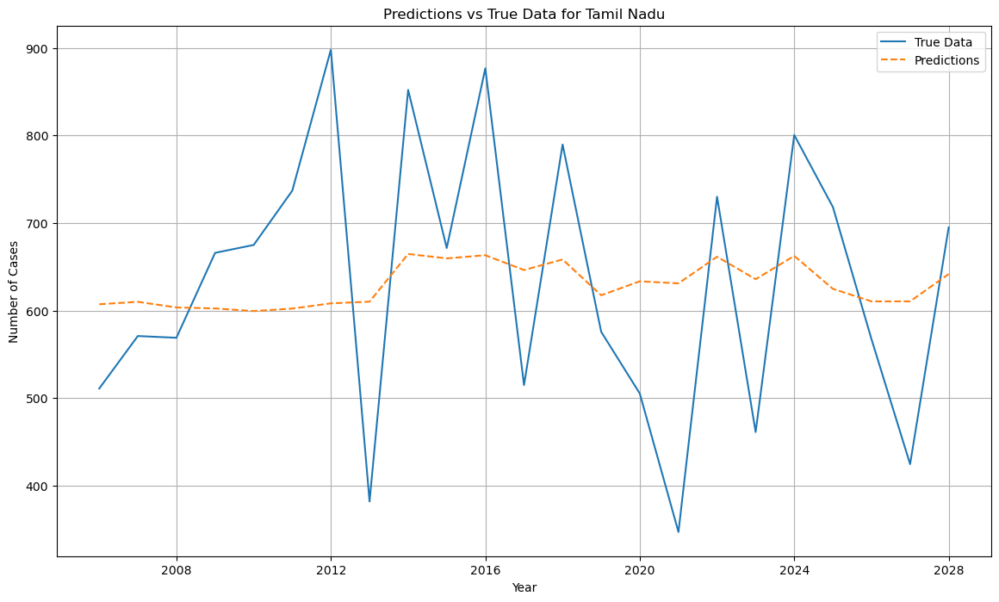

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4859

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.4697 - val_loss: 0.2126
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1843 - val_loss: 0.0873
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0636 - val_loss: 0.0850
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0623 - val_loss: 0.0845
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0682 - val_loss: 0.0851
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0724 - val_loss: 0.0839
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1155 - val_loss: 0.0842
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1046 - val_loss: 0.0839
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1003 - val_loss: 0.0838
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0834 - val_loss: 0.0826
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0698 - val_loss: 0.0841
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0556 - val_loss: 0.0823

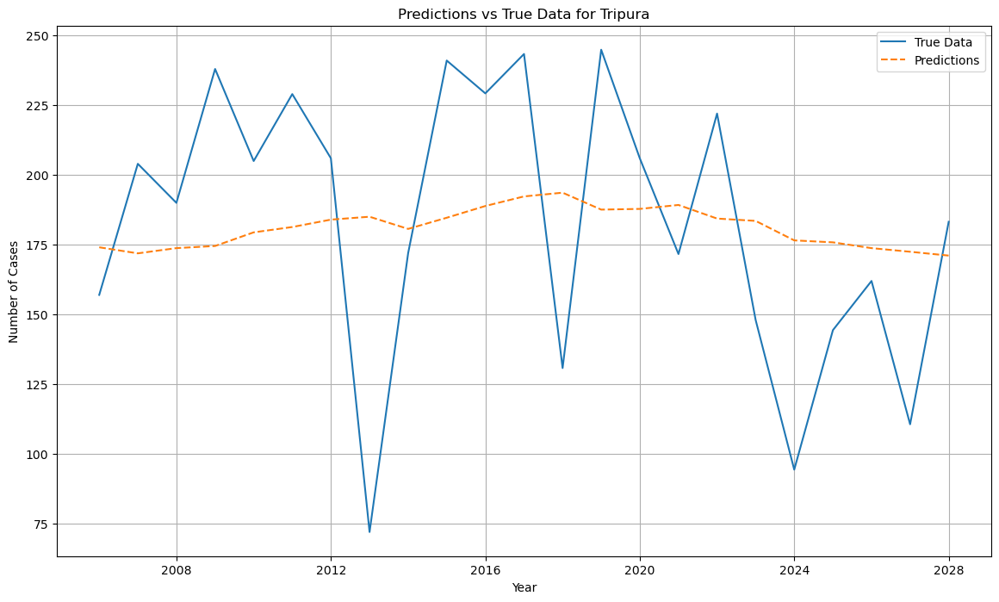

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1116

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.1125 - val_loss: 0.0801
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0732 - val_loss: 0.0431
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0589 - val_loss: 0.0433
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0488 - val_loss: 0.0437
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0367 - val_loss: 0.0428
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0457 - val_loss: 0.0428
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0334 - val_loss: 0.0426
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0760 - val_loss: 0.0426
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0485 - val_loss: 0.0424
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0491 - val_loss: 0.0423
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0405 - val_loss: 0.0428
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0536 - val_loss: 0.0422

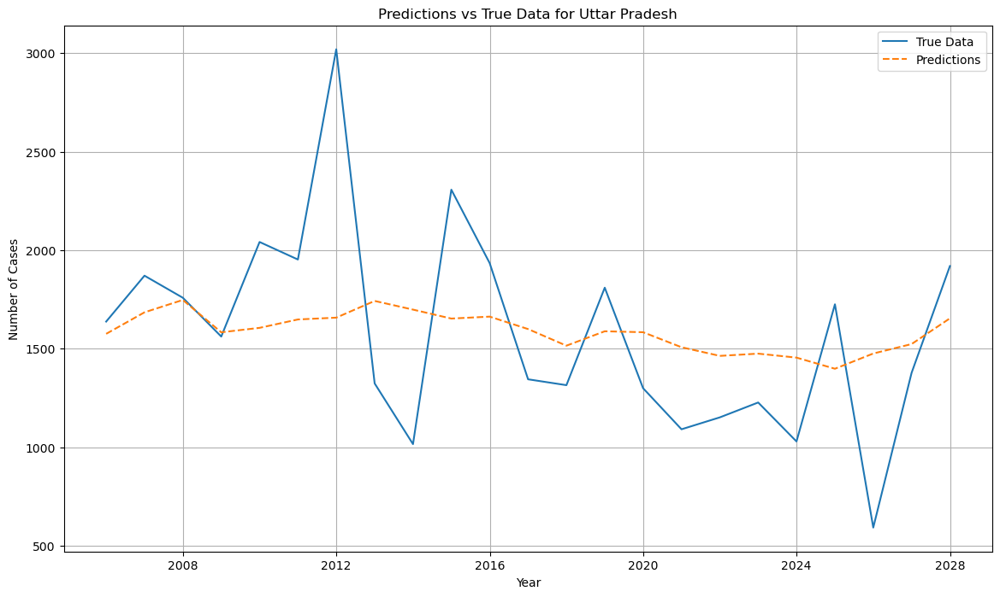

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2099

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.2052 - val_loss: 0.0670
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0459 - val_loss: 0.0466
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0493 - val_loss: 0.0465
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0483 - val_loss: 0.0470
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0386 - val_loss: 0.0461
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0272 - val_loss: 0.0468
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0473 - val_loss: 0.0459
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0486 - val_loss: 0.0457
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0780 - val_loss: 0.0456
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0580 - val_loss: 0.0456
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0455 - val_loss: 0.0454
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0287 - val_loss: 0.0459

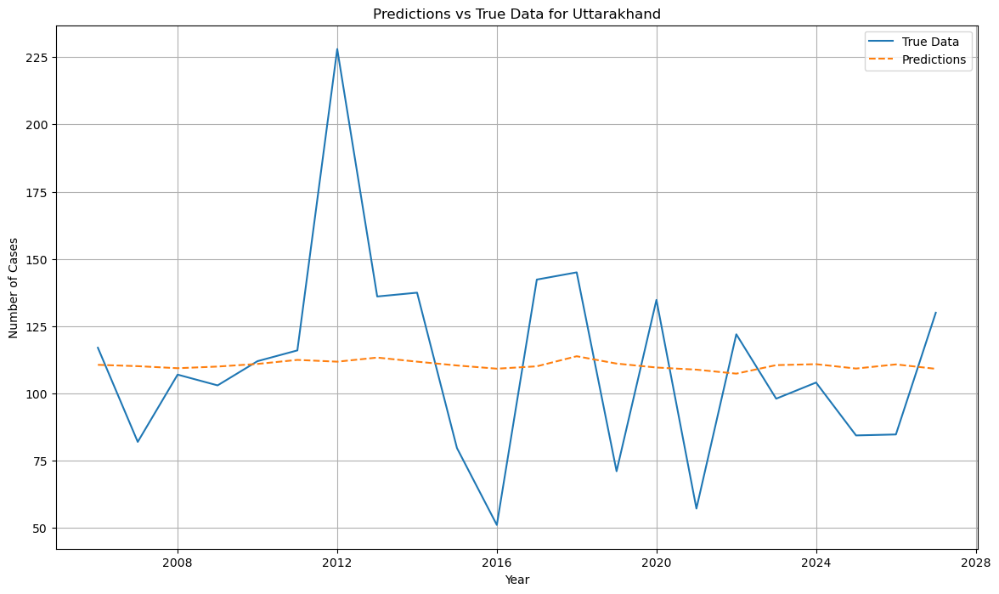

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2059

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2084 - val_loss: 0.1682
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1400 - val_loss: 0.0920
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0659 - val_loss: 0.0879
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0816 - val_loss: 0.0823
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0678 - val_loss: 0.0797
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0863 - val_loss: 0.0780
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1173 - val_loss: 0.0748
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0870 - val_loss: 0.0728
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0609 - val_loss: 0.0710
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0809 - val_loss: 0.0694
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0781 - val_loss: 0.0679
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0622 - val_loss: 0.0651

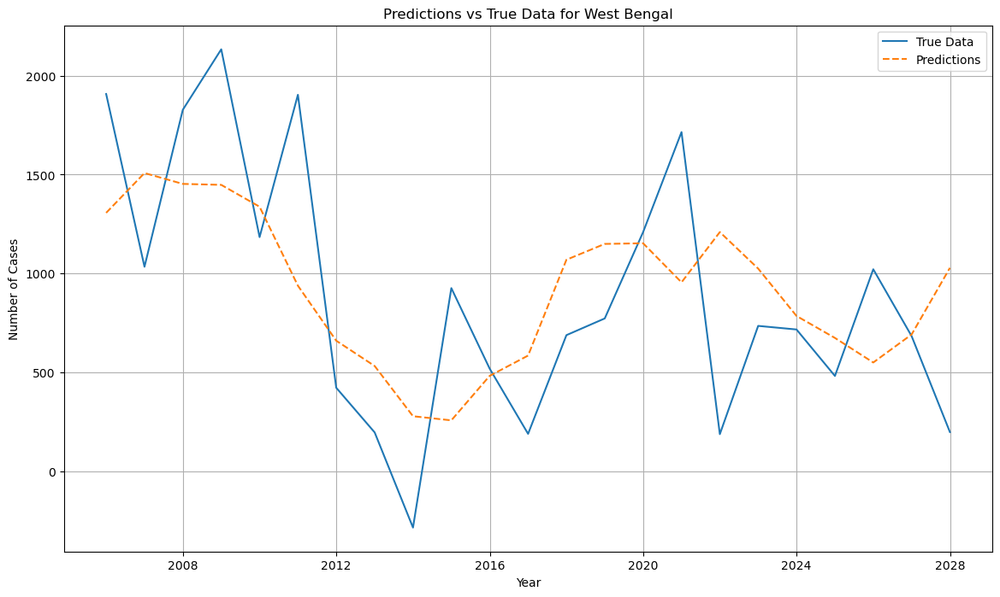

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2998

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.2972 - val_loss: 0.1815
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1103 - val_loss: 0.0801
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0438 - val_loss: 0.0500
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0507 - val_loss: 0.0467
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0309 - val_loss: 0.0452
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0473 - val_loss: 0.0450
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0514 - val_loss: 0.0448
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0607 - val_loss: 0.0446
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0608 - val_loss: 0.0450
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0509 - val_loss: 0.0444
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0548 - val_loss: 0.0445
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0225 - val_loss: 0.0443

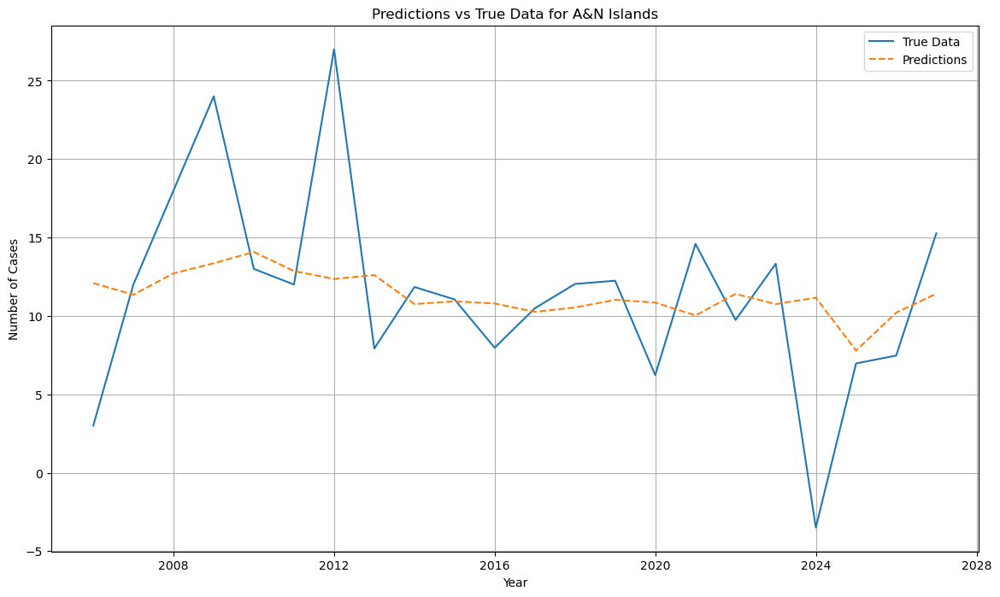

Augmented cases shape: (29, 1)
DataFrame created with shape: (29, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3558

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.3481 - val_loss: 0.1907
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1446 - val_loss: 0.0730
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0686 - val_loss: 0.0718
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0682 - val_loss: 0.0712
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0851 - val_loss: 0.0708
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0772 - val_loss: 0.0714
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0957 - val_loss: 0.0702
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0665 - val_loss: 0.0695
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0798 - val_loss: 0.0684
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0632 - val_loss: 0.0706
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0693 - val_loss: 0.0687
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0605 - val_loss: 0.0684

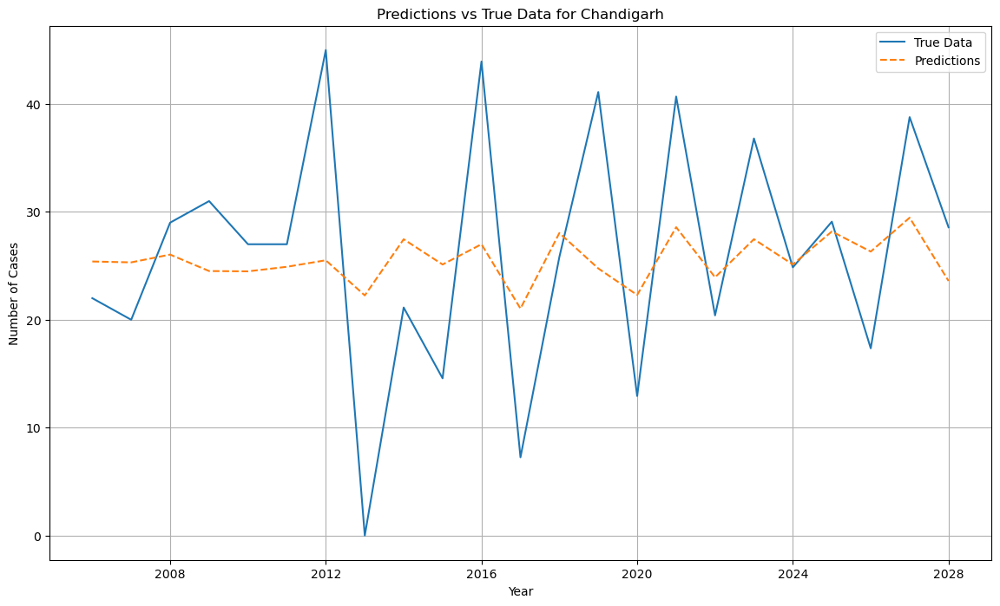

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2826

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.2665 - val_loss: 0.1070
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0940 - val_loss: 0.0679
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0488 - val_loss: 0.0661
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0710 - val_loss: 0.0664
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0786 - val_loss: 0.0639
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0694 - val_loss: 0.0630
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0657 - val_loss: 0.0638
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0687 - val_loss: 0.0624
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0759 - val_loss: 0.0608
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0586 - val_loss: 0.0604
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0488 - val_loss: 0.0594
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0494 - val_loss: 0.0588

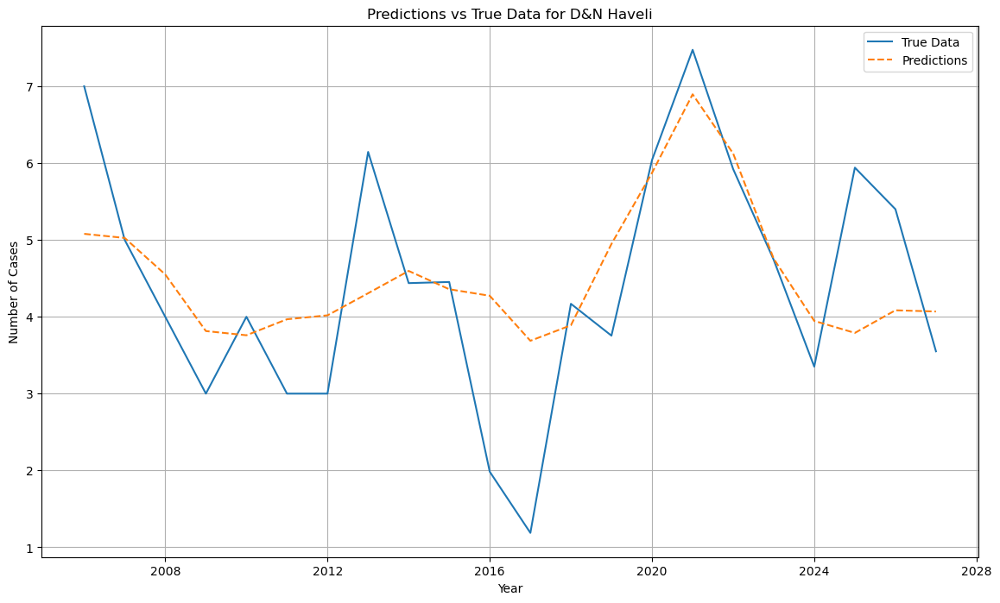

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


21/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2373

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2364 - val_loss: 0.1589
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1294 - val_loss: 0.0828
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0774 - val_loss: 0.0802
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0588 - val_loss: 0.0780
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1155 - val_loss: 0.0770
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0703 - val_loss: 0.0782
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0629 - val_loss: 0.0762
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0961 - val_loss: 0.0762
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0830 - val_loss: 0.0759
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1080 - val_loss: 0.0752
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0937 - val_loss: 0.0747
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1021 - val_loss: 0.0743

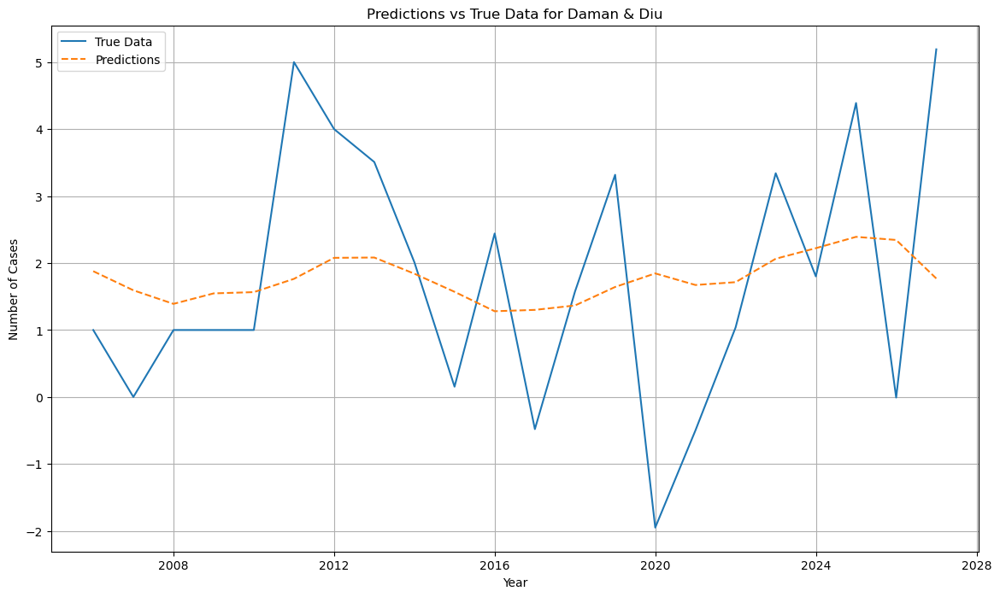

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/22 ━━━━━━━━━━━━━━━━━━━━ 45s 2s/step - loss: 0.1732

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.1304 - val_loss: 0.0722
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0513 - val_loss: 0.0521
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0822 - val_loss: 0.0512
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0424 - val_loss: 0.0512
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0543 - val_loss: 0.0508
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0578 - val_loss: 0.0507
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0526 - val_loss: 0.0504
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0346 - val_loss: 0.0504
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0468 - val_loss: 0.0503
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0399 - val_loss: 0.0499
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0629 - val_loss: 0.0497
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0546 - val_loss: 0.0499

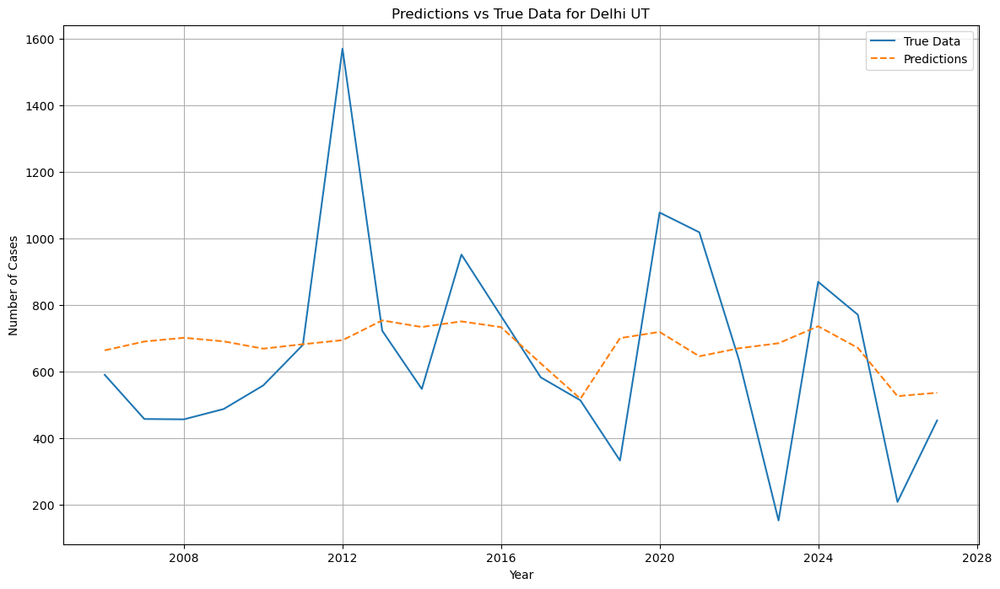

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/22 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - loss: 0.0053

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.2464 - val_loss: 0.2186
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1653 - val_loss: 0.0948
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0739 - val_loss: 0.0767
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0630 - val_loss: 0.0742
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0752 - val_loss: 0.0734
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0488 - val_loss: 0.0721
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0830 - val_loss: 0.0708
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0736 - val_loss: 0.0704
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0751 - val_loss: 0.0687
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0724 - val_loss: 0.0701
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0664 - val_loss: 0.0671
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0611 - val_loss: 0.0663

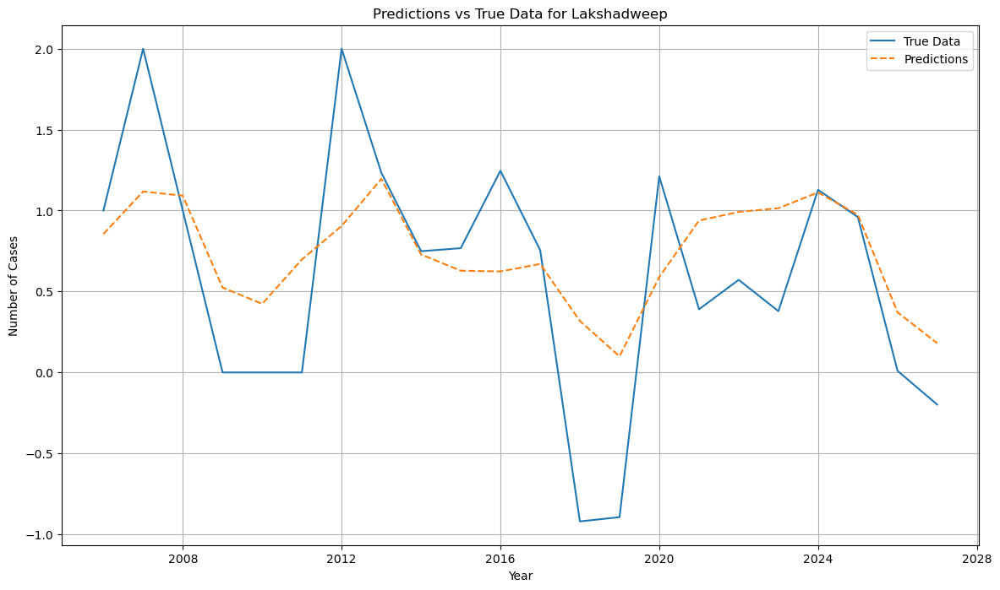

Augmented cases shape: (28, 1)
DataFrame created with shape: (28, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2428

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - loss: 0.2335 - val_loss: 0.1181
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.1063 - val_loss: 0.0512
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0576 - val_loss: 0.0507
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0339 - val_loss: 0.0501
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0858 - val_loss: 0.0504
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0522 - val_loss: 0.0493
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0353 - val_loss: 0.0485
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0497 - val_loss: 0.0478
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0590 - val_loss: 0.0470
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0304 - val_loss: 0.0475
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0280 - val_loss: 0.0459
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0701 - val_l

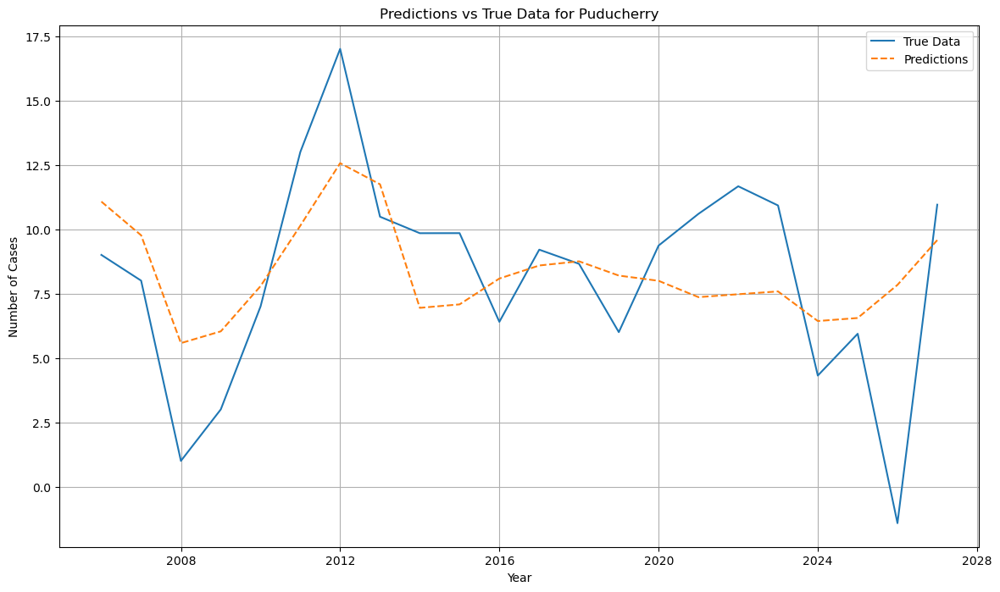

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_lo

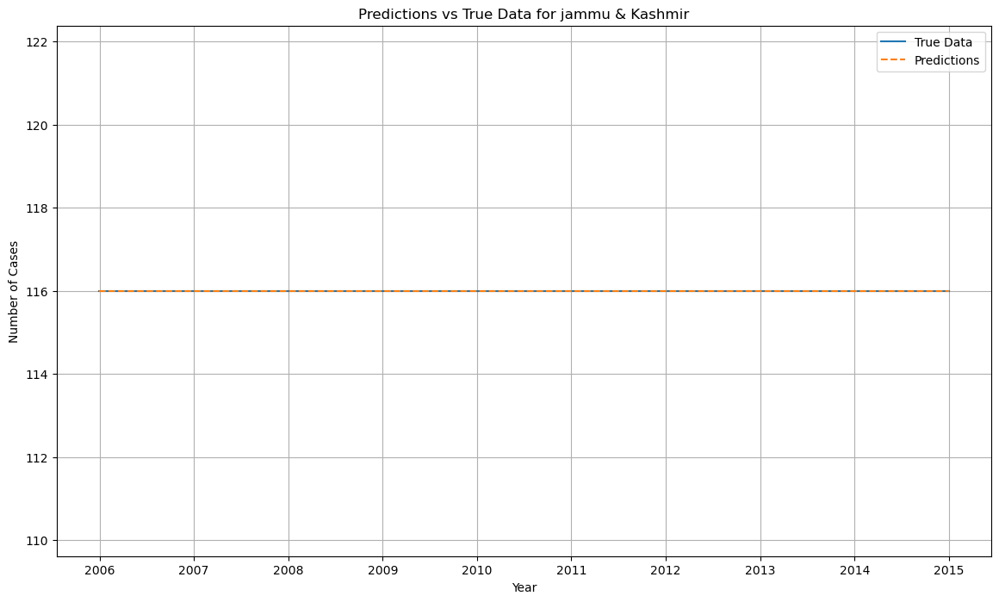

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_los

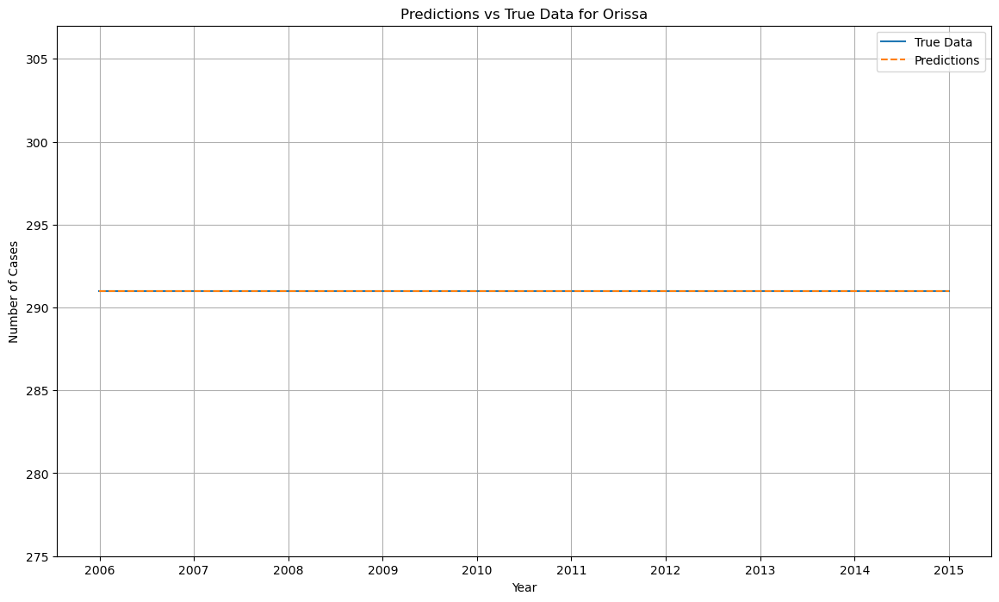

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_lo

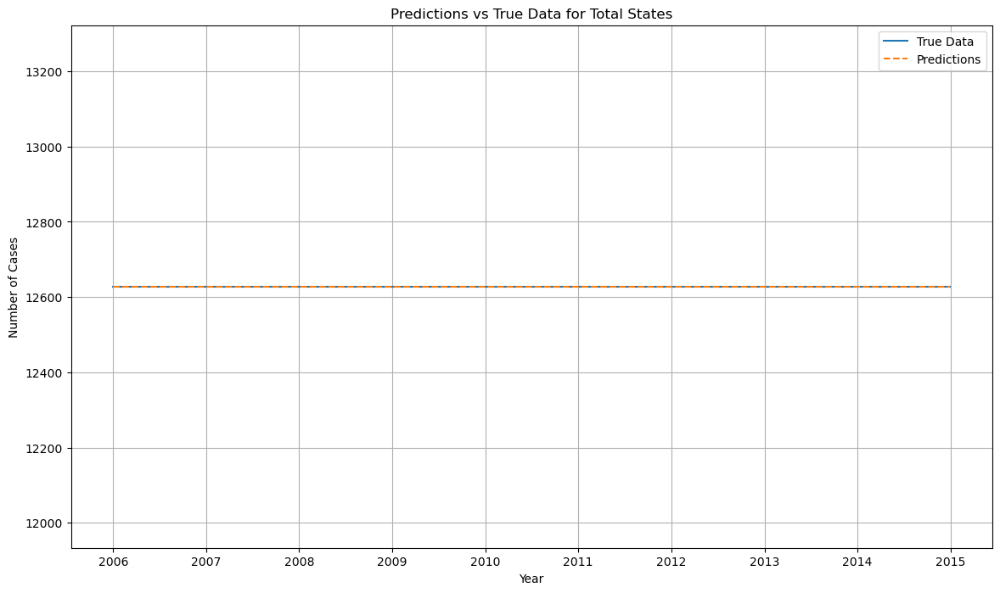

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.00

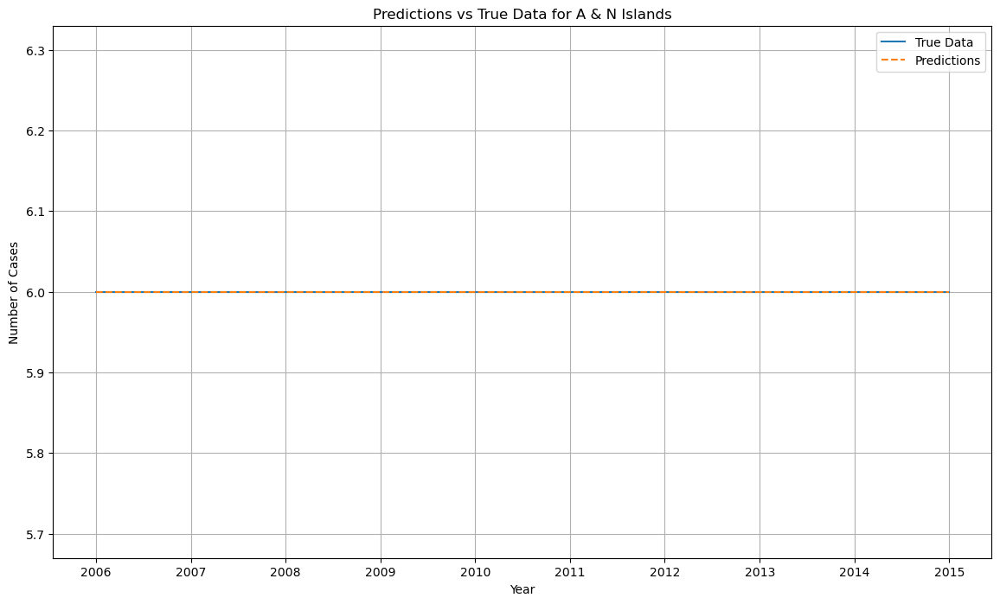

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 22s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

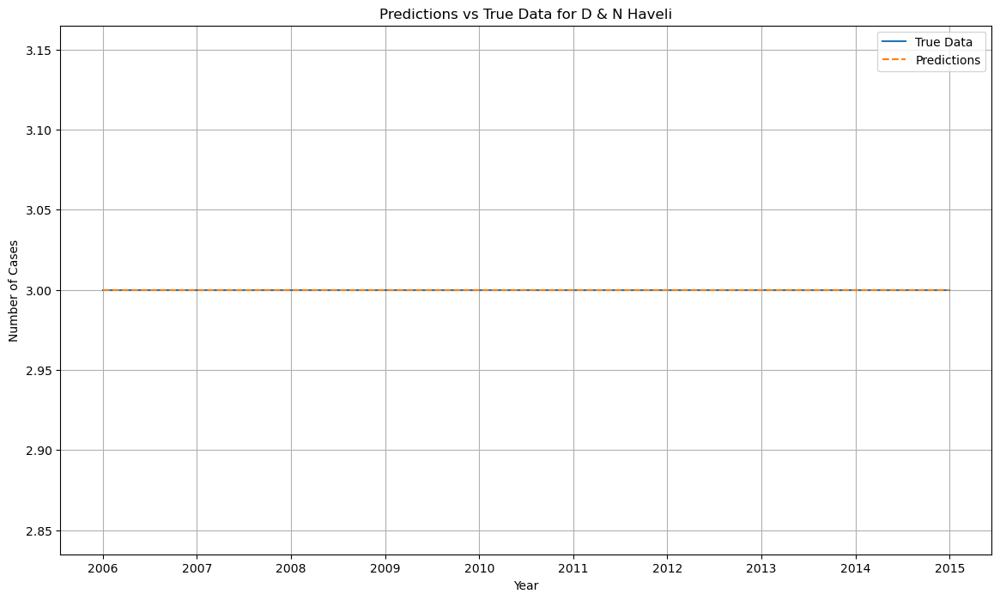

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000

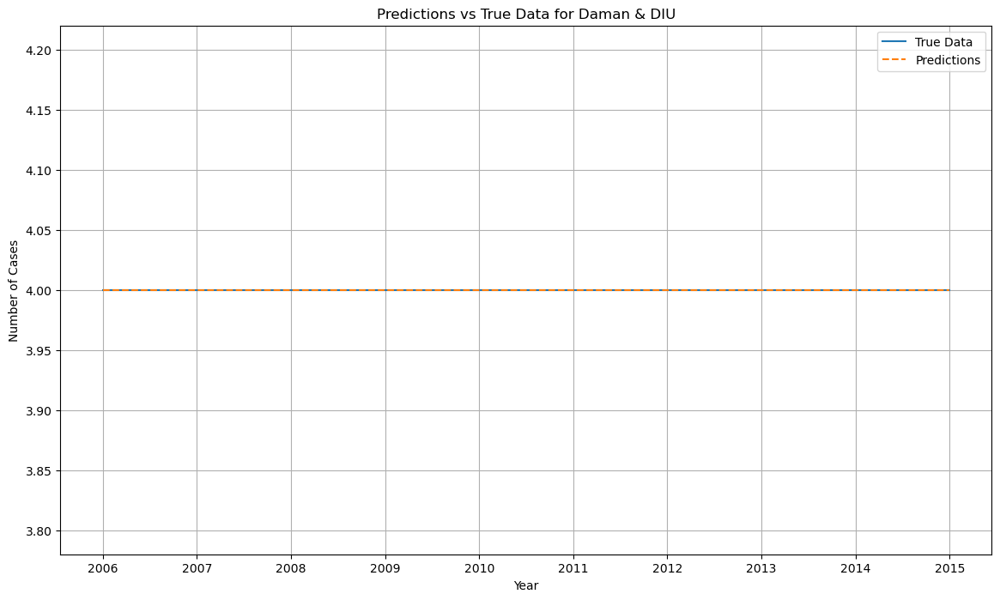

Augmented cases shape: (17, 1)
DataFrame created with shape: (17, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/11 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - loss: 0.0474

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.3274 - val_loss: 0.2806
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3055 - val_loss: 0.2038
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2282 - val_loss: 0.1404
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1018 - val_loss: 0.0993
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0746 - val_loss: 0.0737
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0670 - val_loss: 0.0704
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0562 - val_loss: 0.0709
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0863 - val_loss: 0.0700
Epoch 9/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0647 - val_loss: 0.0708
Epoch 10/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0526 - val_loss: 0.0696
Epoch 11/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0995 - val_loss: 0.0692
Epoch 12/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0986 - val_loss: 0.06

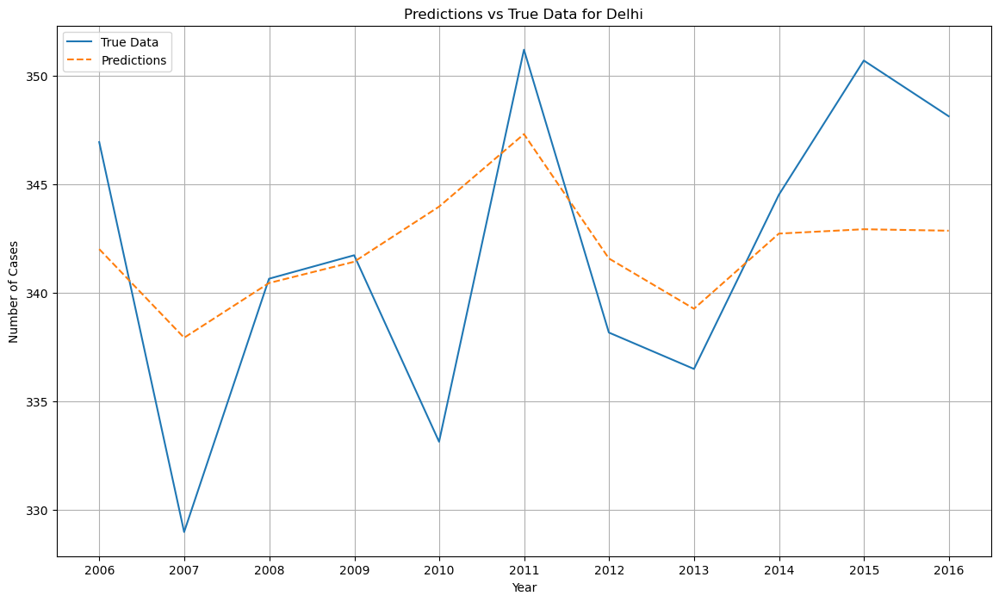

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000

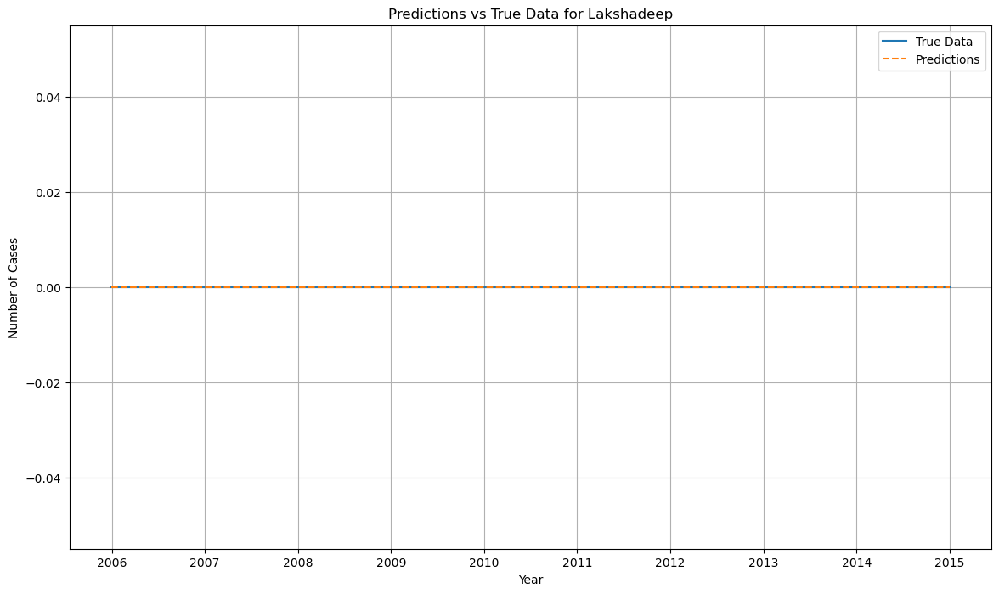

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.00

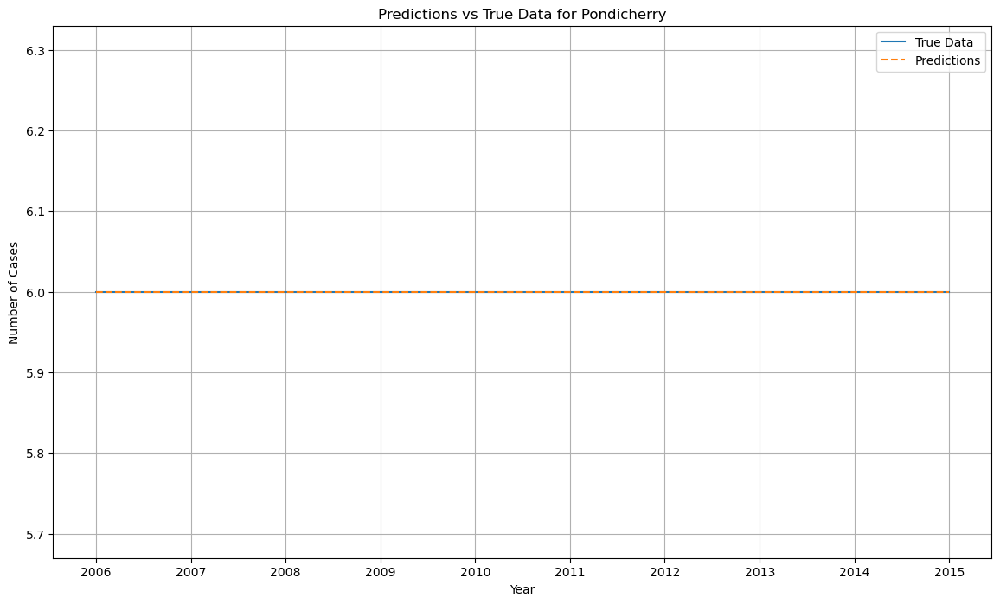

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 53s 6s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0

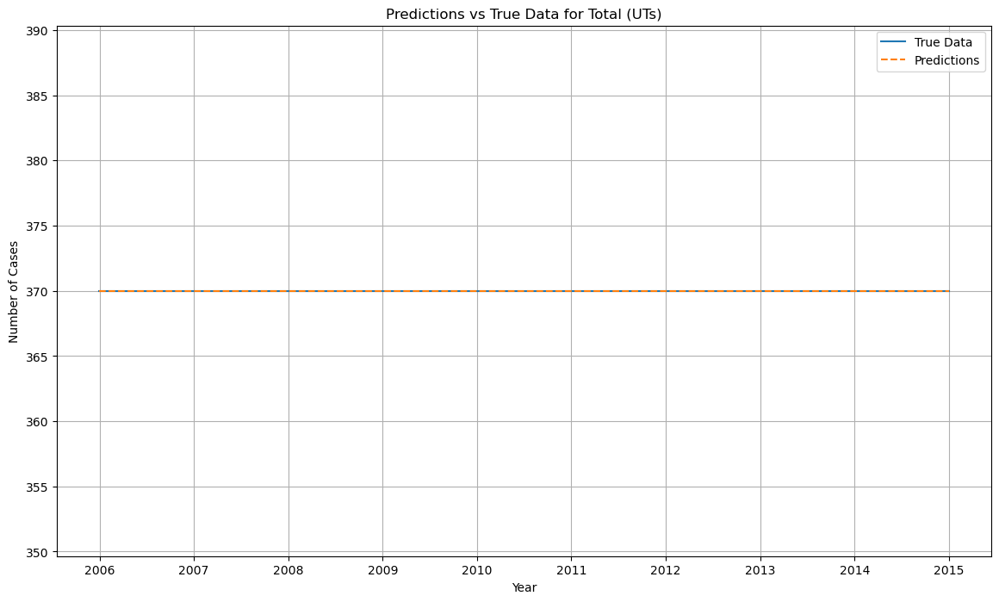

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.00

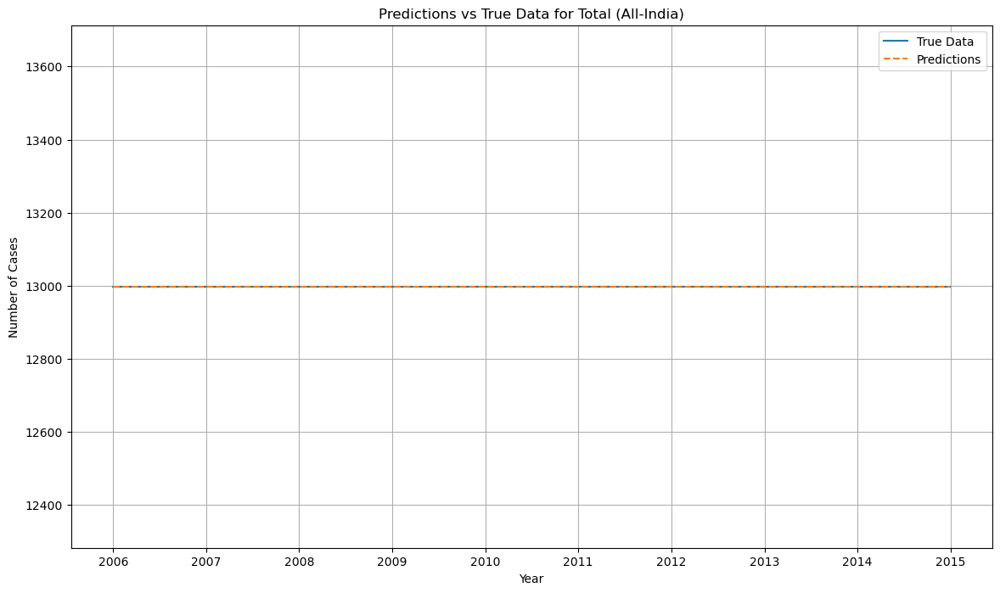

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss:

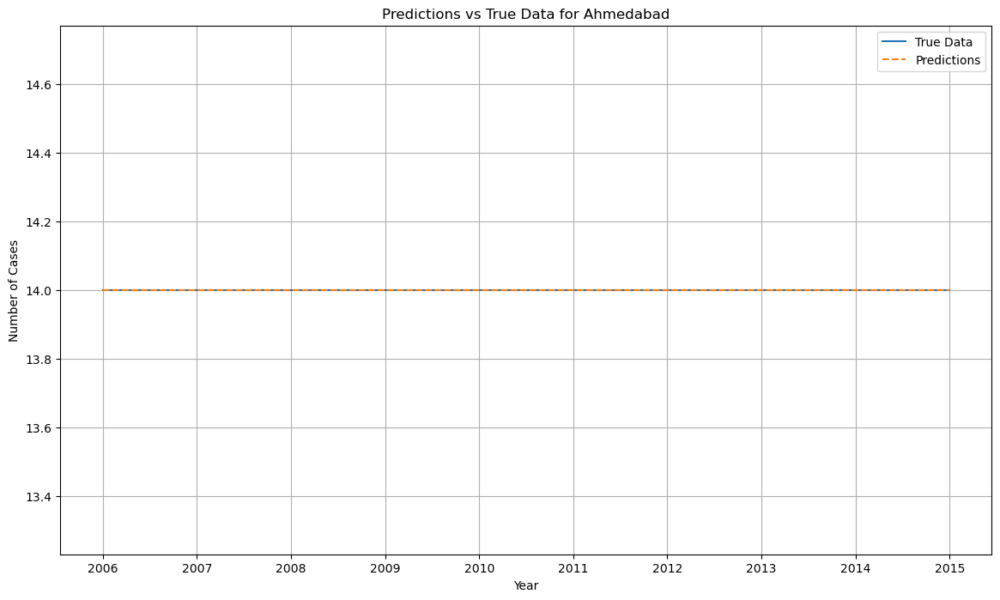

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0

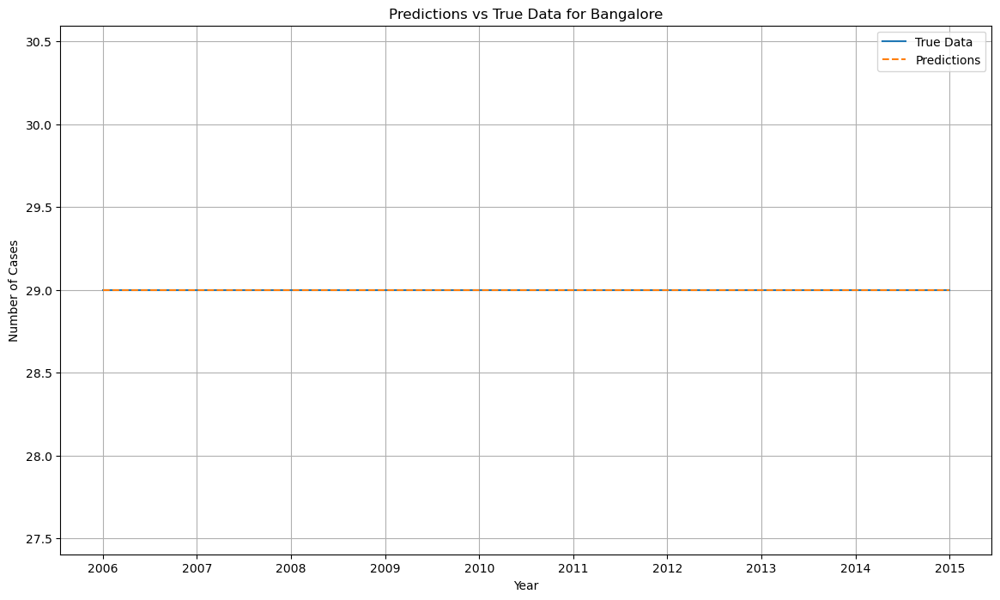

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss

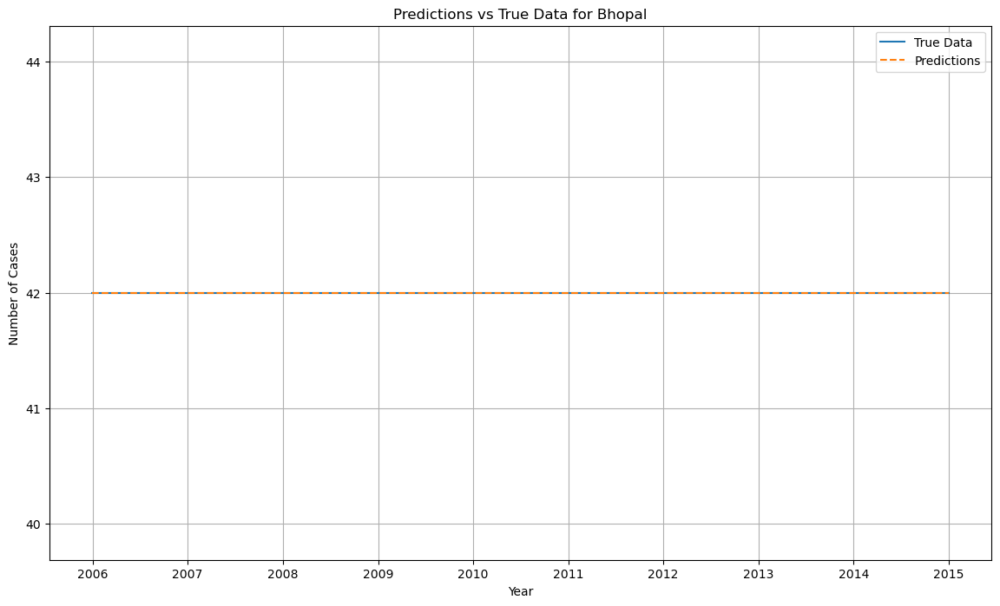

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 

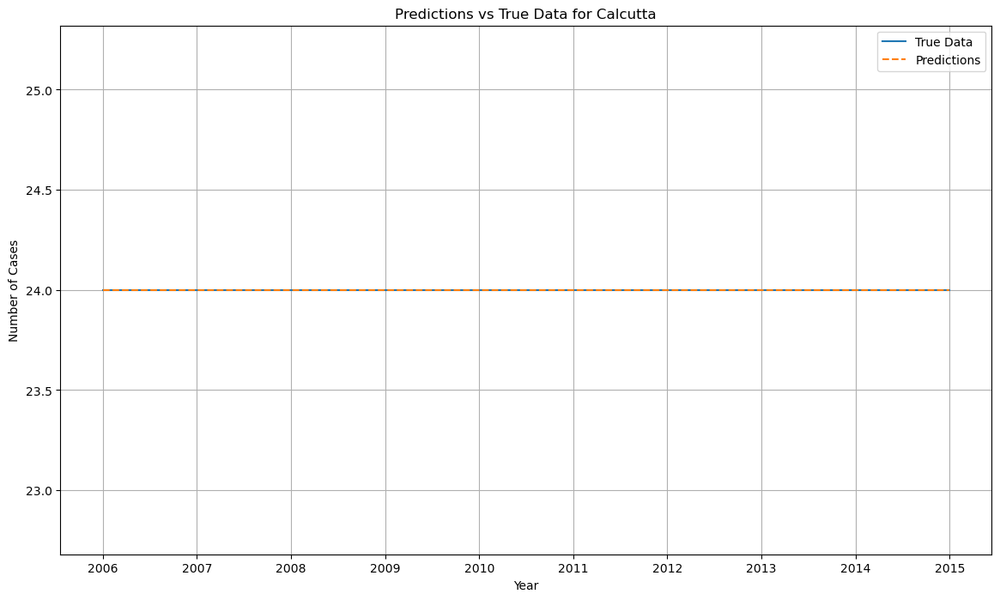

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss

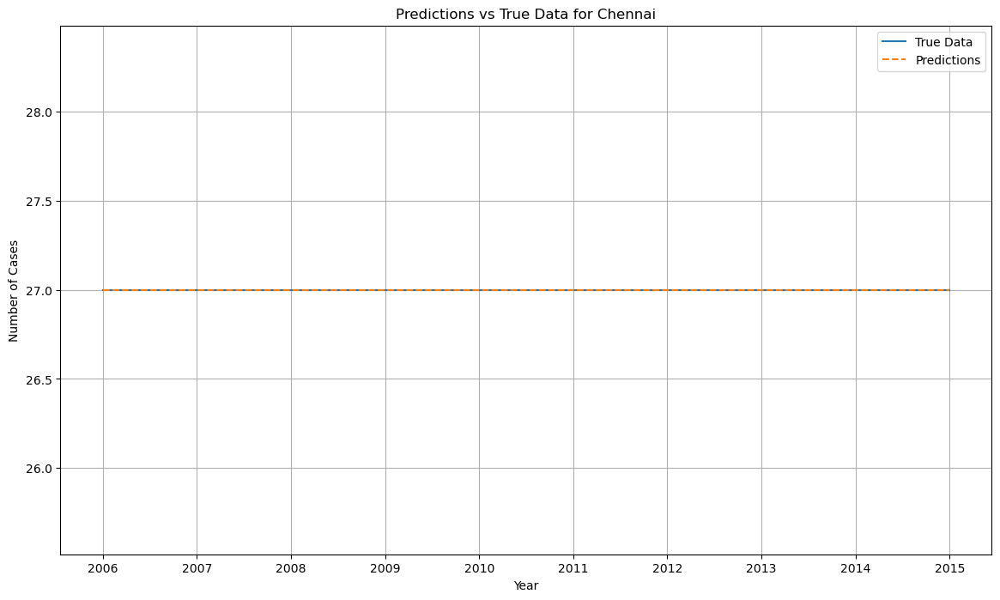

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.

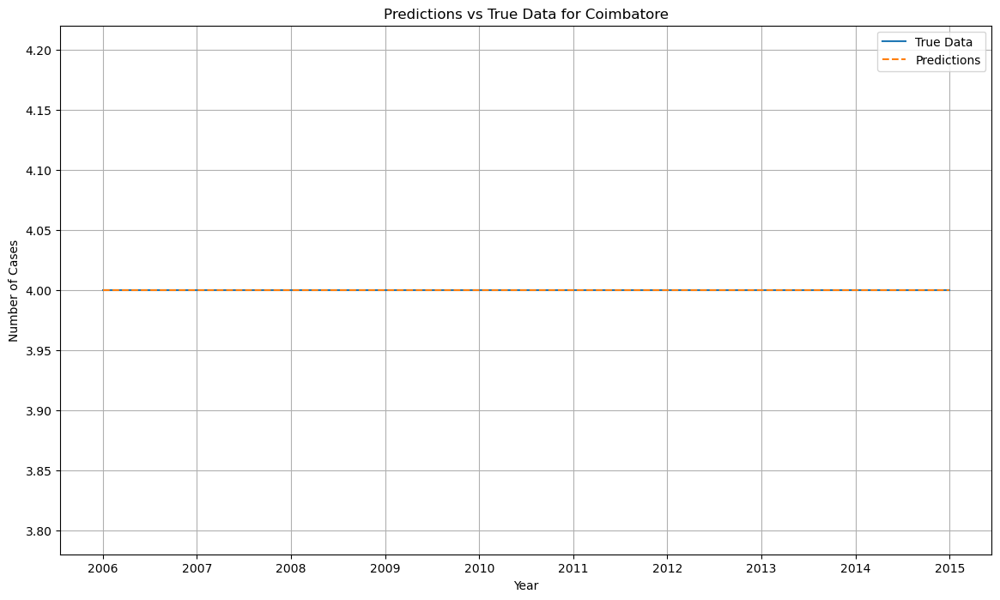

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0

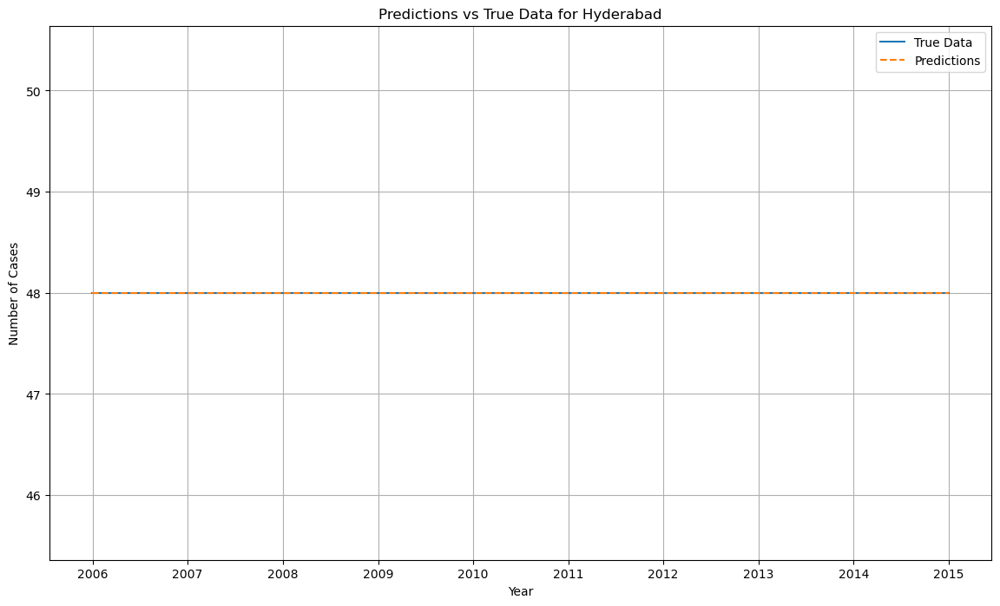

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.00

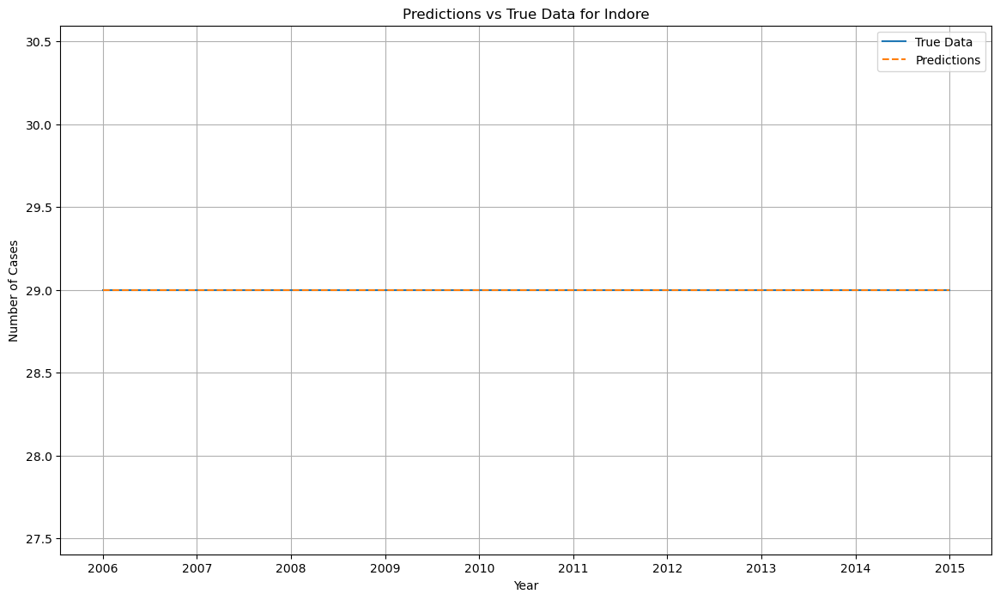

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000

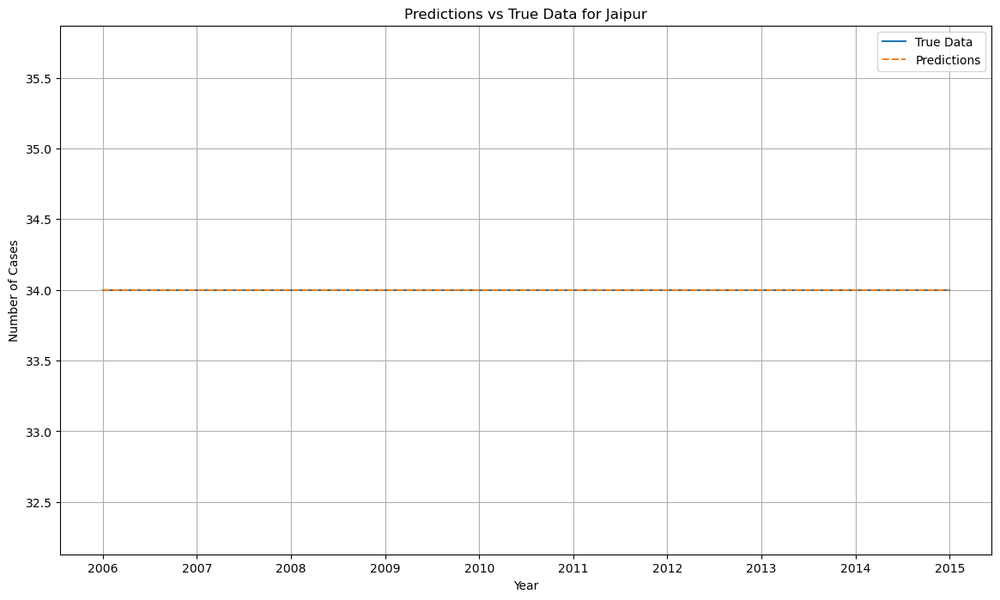

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

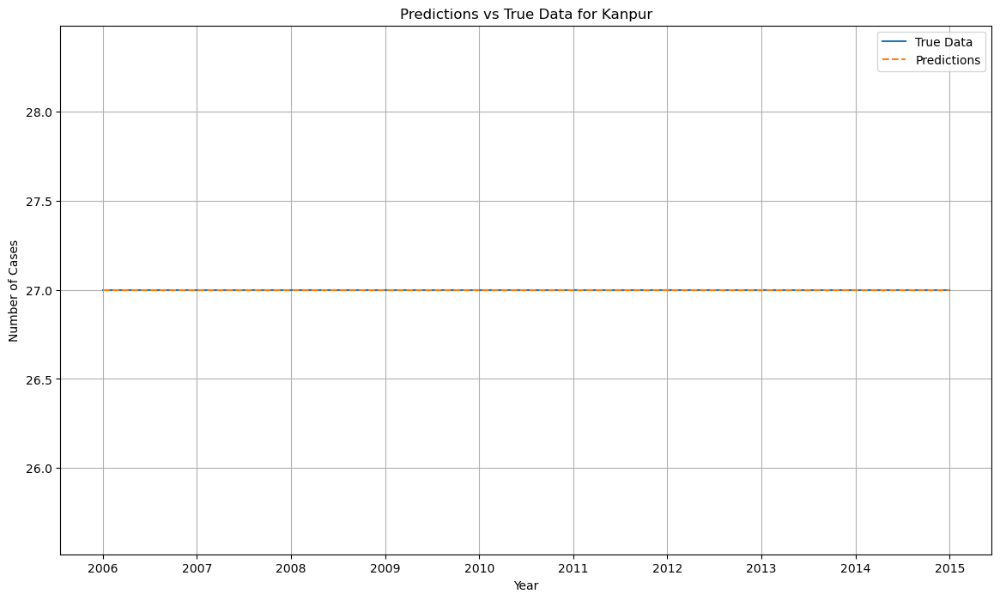

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

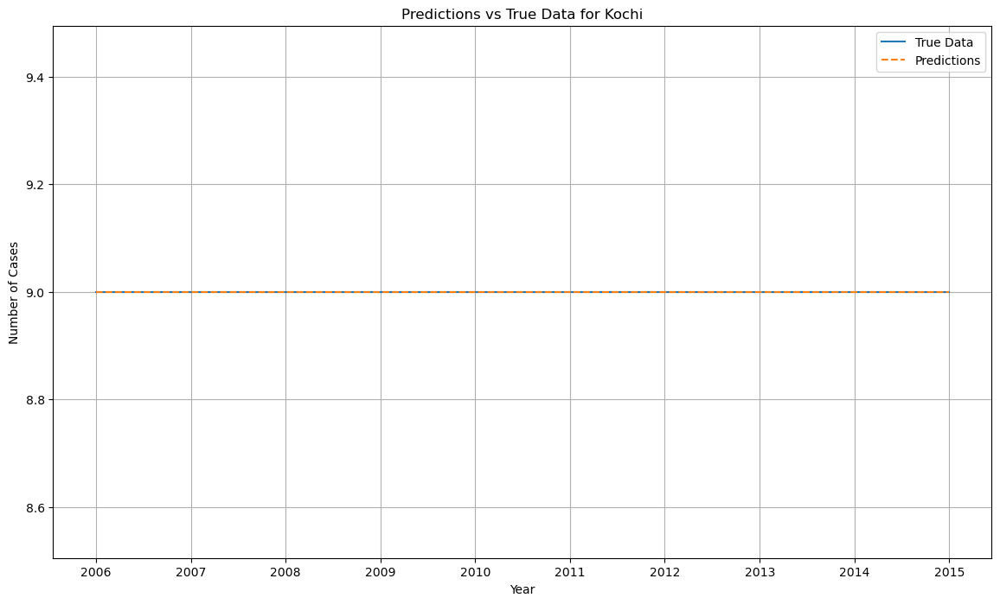

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

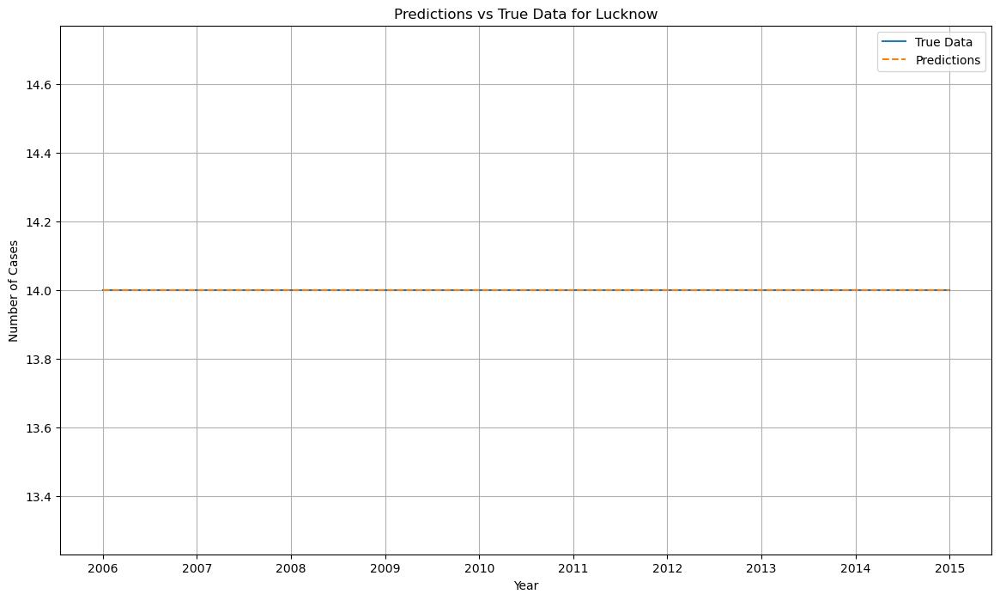

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

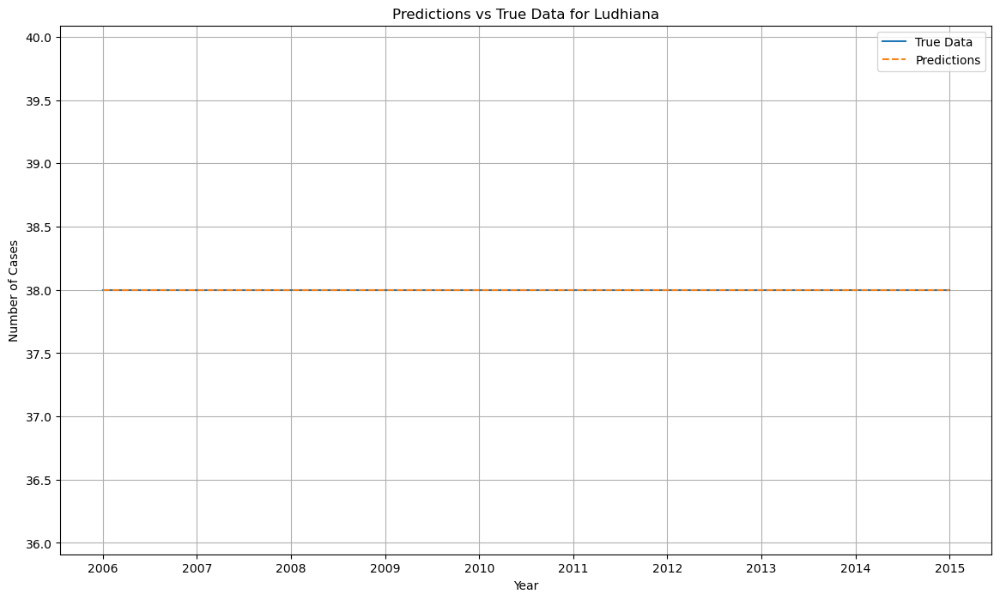

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000

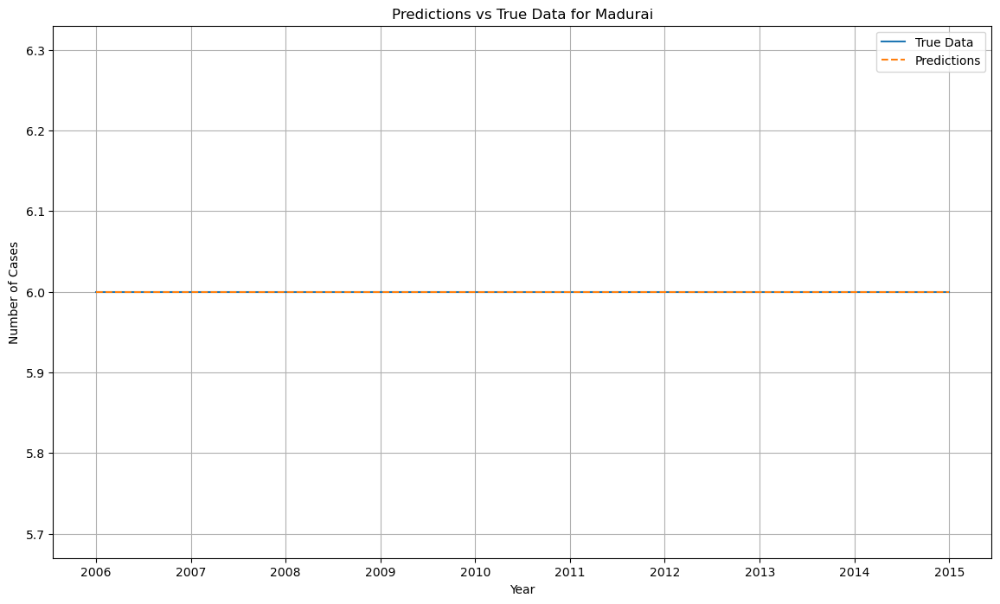

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000

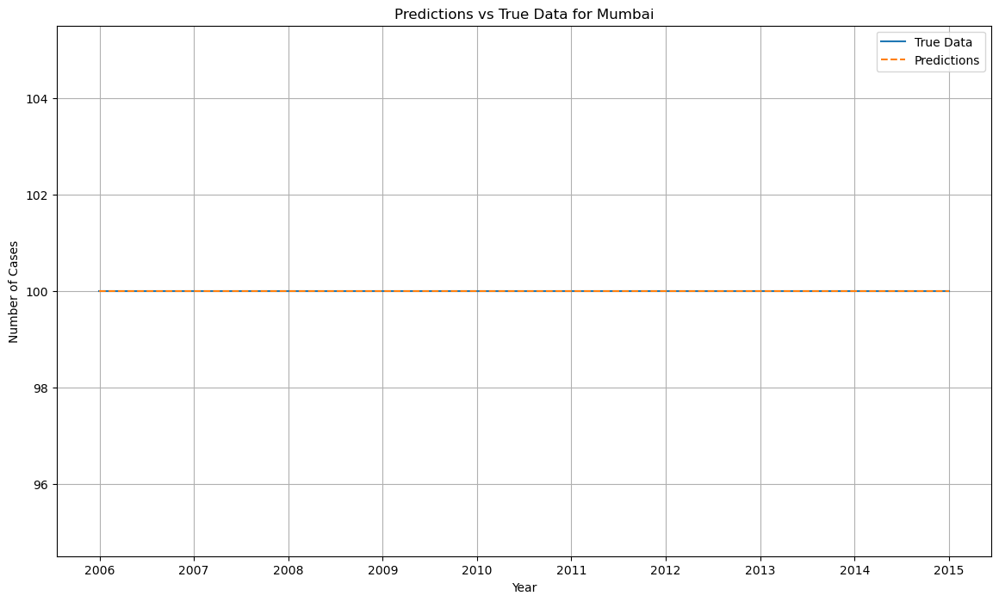

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000

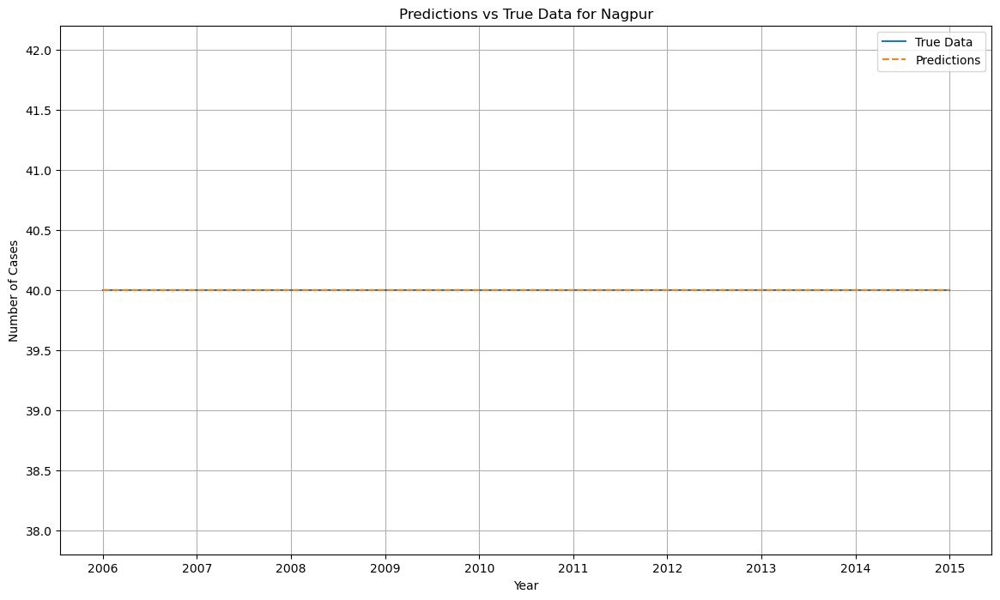

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.00

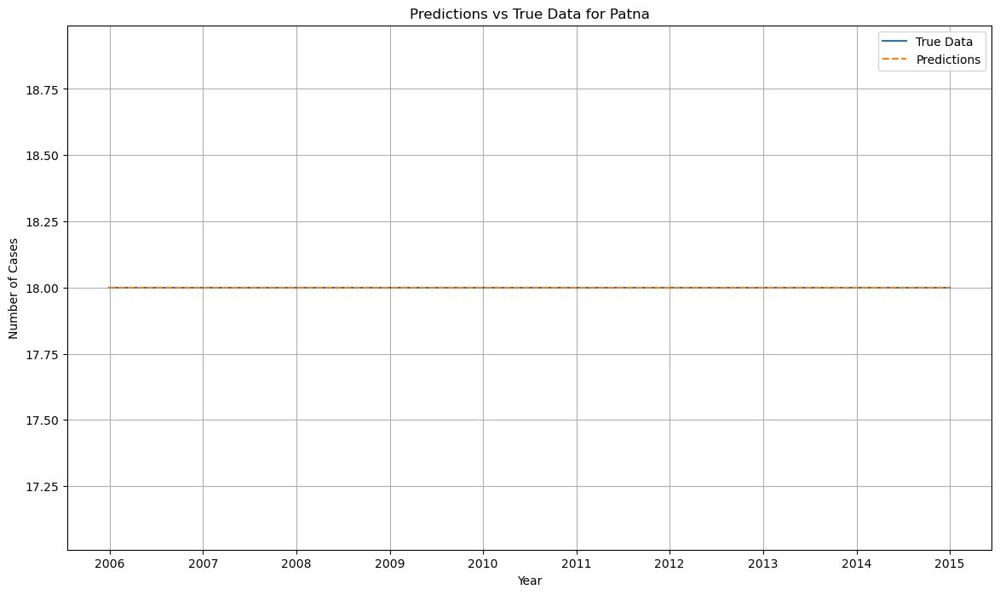

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 27s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.00

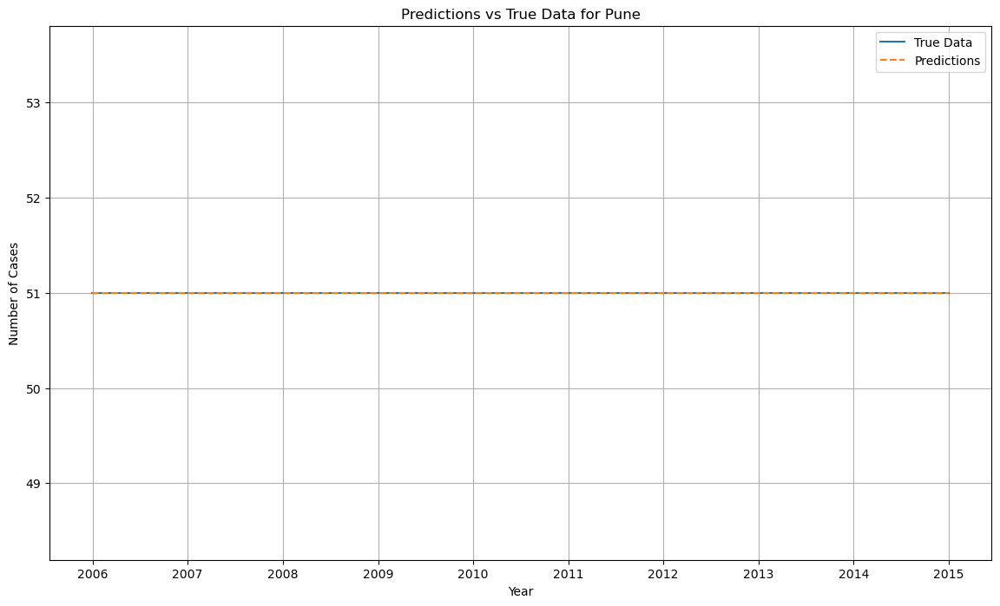

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 23s 3s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0

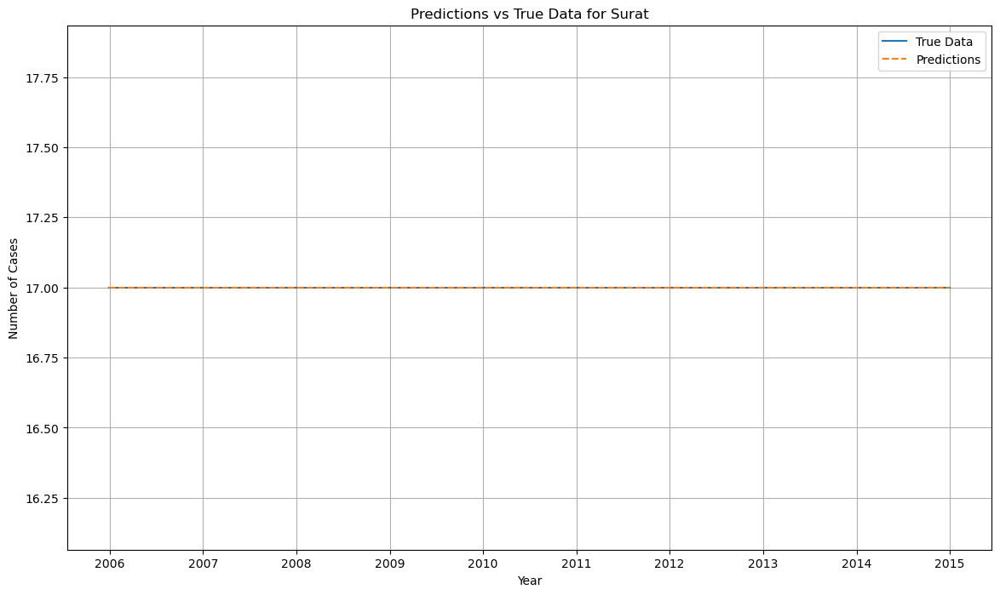

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_los

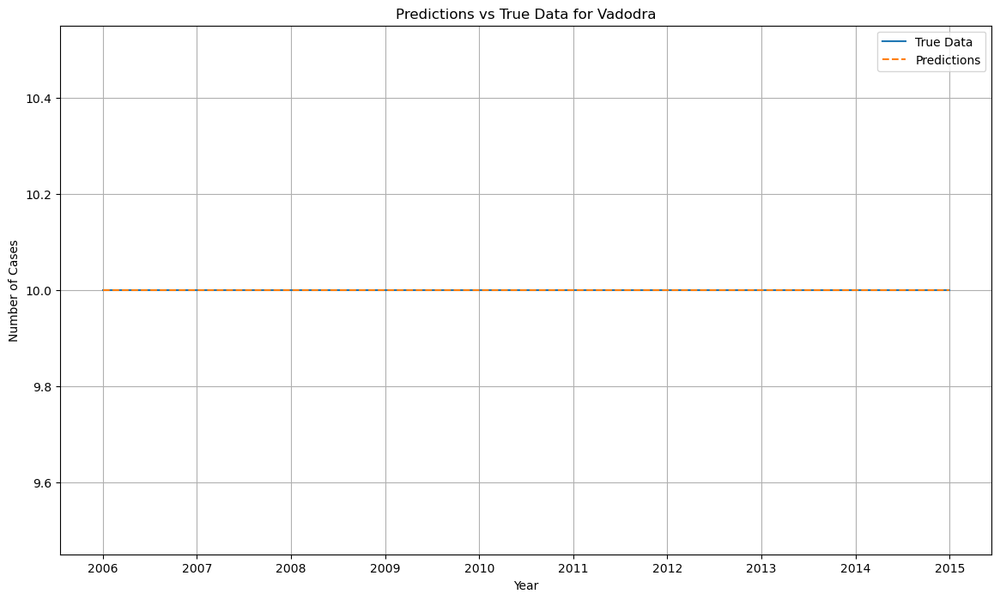

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0000e+00 - val_lo

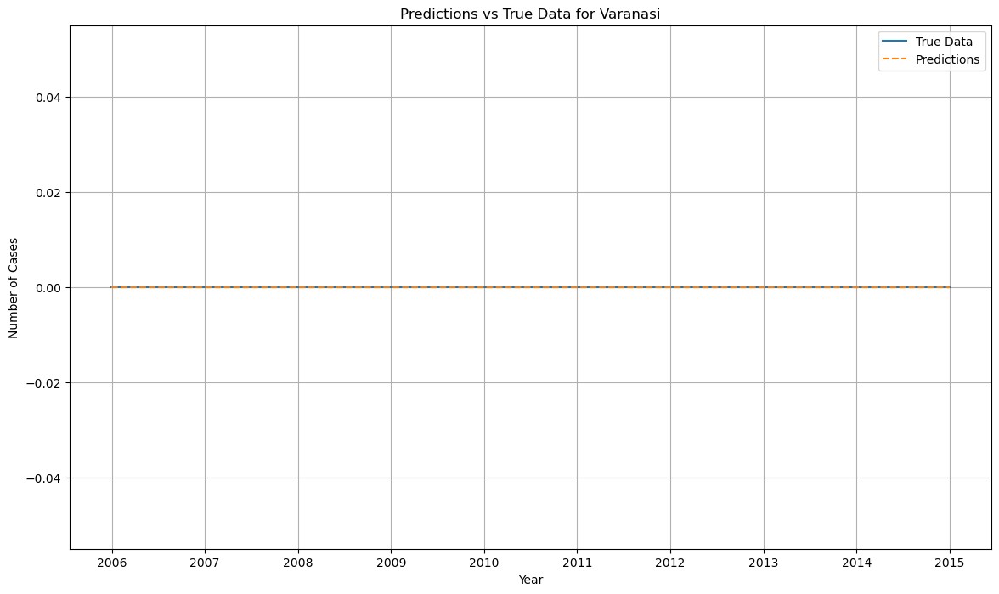

Augmented cases shape: (16, 1)
DataFrame created with shape: (16, 1)
Columns: Index(['No. Of Cases In Which Offenders Were Known To The Victims'], dtype='object')
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\3852814870.py:33: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 1/10 ━━━━━━━━━━━━━━━━━━━━ 44s 5s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.000

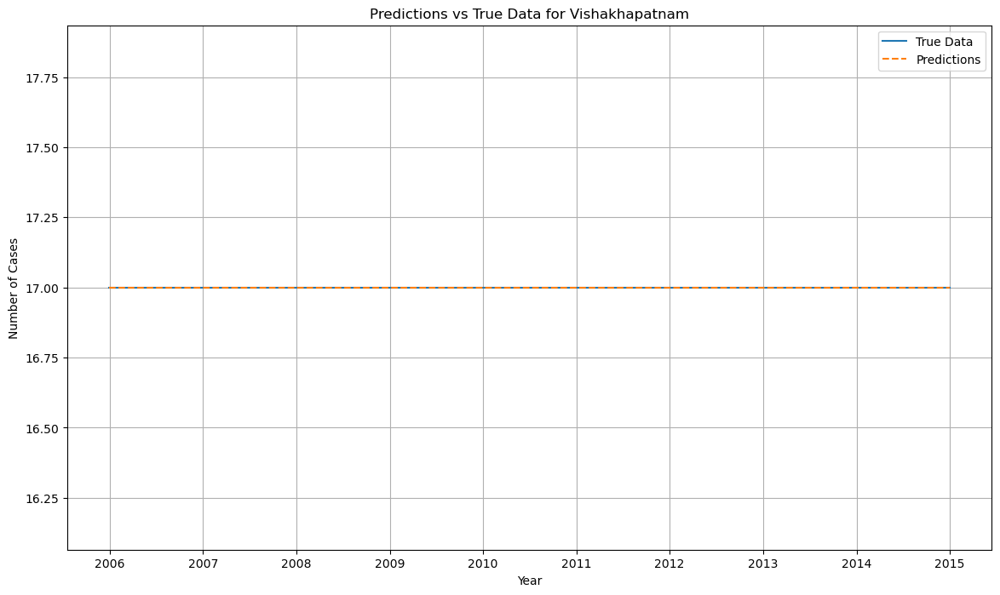

In [192]:
# creating data augmentation
from scipy.stats import norm


def augment_data(data, n_years_future):
    mean = np.mean(data, axis=0)
    std = np.std(data, axis=0)
    augmented_data = np.concatenate([data, norm.rvs(loc=mean, scale=std, size=(n_years_future, data.shape[1]))], axis=0)
    return augmented_data

# Iterate over each unique state
for state in states:
    # Use boolean indexing to filter data for the current state
    state_data = df_model[df_model.index.get_level_values('STATE/UT') == state]

    # Select only the column of interest
    state_data = state_data[['No. Of Cases In Which Offenders Were Known To The Victims']]
    
    
    # Check if state_data is empty or not
    if state_data.empty:
        print(f"No data found for state {state}")
        continue

    # Data Augmentation
    augmented_cases = augment_data(state_data.values, n_years_future=n_years_future)

    # Check dimensions of augmented_cases
    print("Augmented cases shape:", augmented_cases.shape)

    # Preparing DataFrame for LSTM
    df_aug = pd.DataFrame(augmented_cases, columns=state_data.columns)
    df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')

    # Check DataFrame creation
    print("DataFrame created with shape:", df_aug.shape)
    print("Columns:", df_aug.columns)

    # Scaling the data
    scalar = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scalar.fit_transform(df_aug)

    # Define the LSTM Model
    model = Sequential()
    model.add(LSTM(units=50, activation='relu', input_shape=(n_input,1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # Create Time Series Generator
    generator = TimeseriesGenerator(scaled_data, scaled_data, length=n_input, batch_size=batch_size)

    # Callbacks for EarlyStopping
    earlystopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Fit the model
    history = model.fit(generator, epochs=epochs, validation_data=generator, callbacks=earlystopping, verbose=1)

    # Predict and inverse transform results
    predictions = model.predict(generator)
    predictions = scalar.inverse_transform(predictions)

    # Evaluating the model
    y_true = df_aug.values[n_input:]
    mse = mean_squared_error(y_true, predictions)
    print(f'Mean Squared Error for {state}: {mse}')

    # Plotting results
    plt.figure(figsize=(14, 8))
    plt.plot(df_aug.index[n_input:], y_true[:, 0], label='True Data')
    plt.plot(df_aug.index[n_input:], predictions[:, 0], label='Predictions', linestyle='--')
    plt.xlabel('Year')
    plt.ylabel('Number of Cases')
    plt.title(f'Predictions vs True Data for {state}')
    plt.legend()
    plt.grid(True)
    plt.show()

### As we observed the model is trying to create synthetic data from a very less data, at times model is failing
### to learn and create synthetic data 
### hence doing some slight variations in std while creating synthetic data
### add dropout layer to prevent overfitting

Augmented cases shape for Andhra Pradesh: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2130 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.2295 - val_loss: 0.1709
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1618 - val_loss: 0.0897
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0900 - val_loss: 0.0867
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0963 - val_loss: 0.0850
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0953 - val_loss: 0.0837
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1218 - val_loss: 0.0825
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0743 - val_loss: 0.0818
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0773 - val_loss: 0.0822
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0798 - val_loss: 0.0805
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0873 - val_loss: 0.0797
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0729 - val_loss: 0.0790
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0986 - val_loss: 0.079

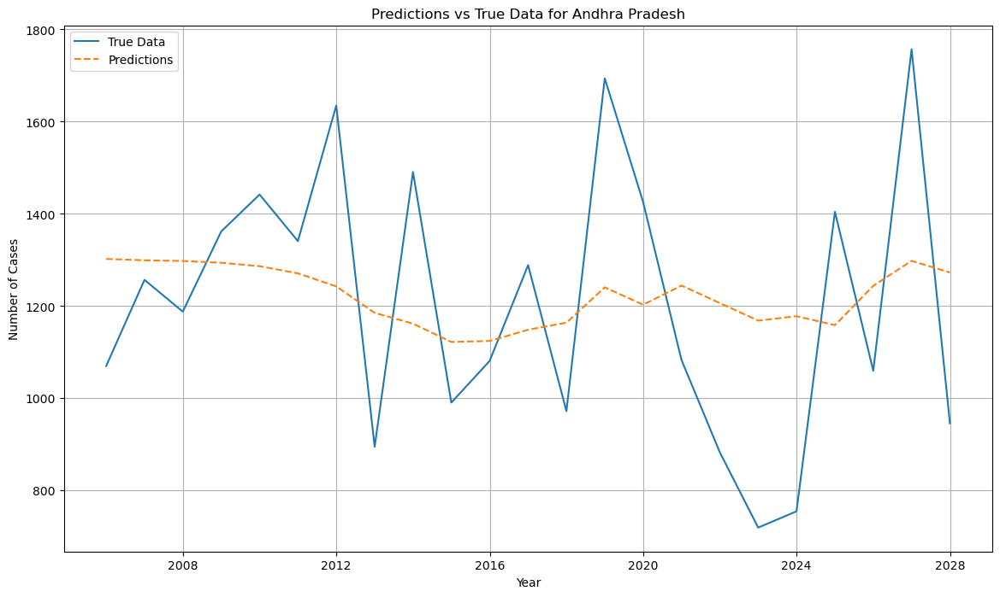

Augmented cases shape for Arunachal Pradesh: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2237 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2412 - val_loss: 0.1368
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0714 - val_loss: 0.0654
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0575 - val_loss: 0.0663
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0514 - val_loss: 0.0618
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0788 - val_loss: 0.0626
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0539 - val_loss: 0.0613
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0792 - val_loss: 0.0609
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0768 - val_loss: 0.0623
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0526 - val_loss: 0.0605
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0649 - val_loss: 0.0605
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0563 - val_loss: 0.0629
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0578 - val_loss: 0.0600

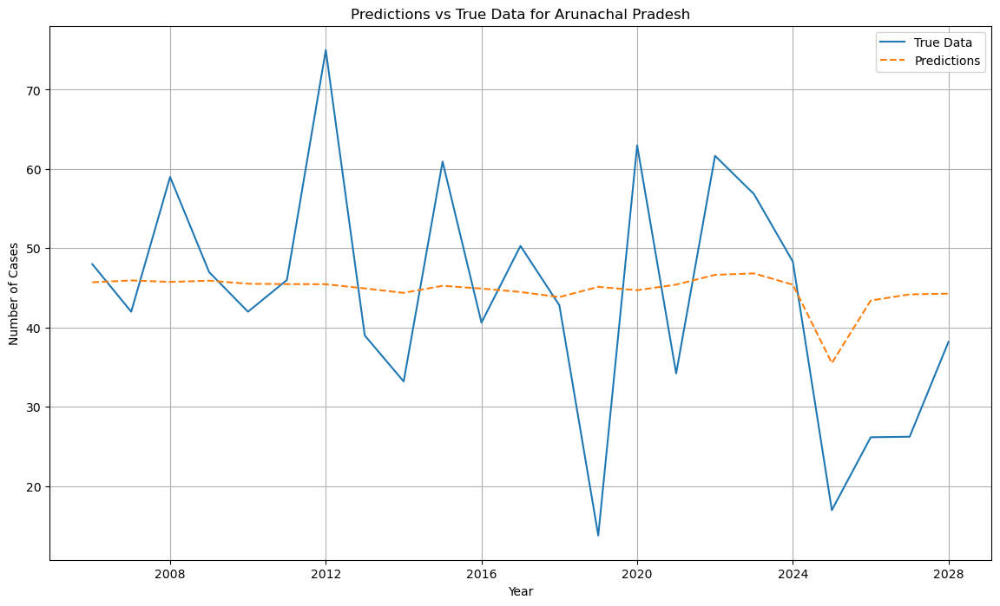

Augmented cases shape for Assam: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3698 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.3641 - val_loss: 0.2373
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2045 - val_loss: 0.0803
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0669 - val_loss: 0.0784
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0767 - val_loss: 0.0770
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0843 - val_loss: 0.0754
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0570 - val_loss: 0.0743
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1065 - val_loss: 0.0726
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0882 - val_loss: 0.0707
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0742 - val_loss: 0.0698
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0880 - val_loss: 0.0687
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0893 - val_loss: 0.0690
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0814 - val_loss: 0.0686

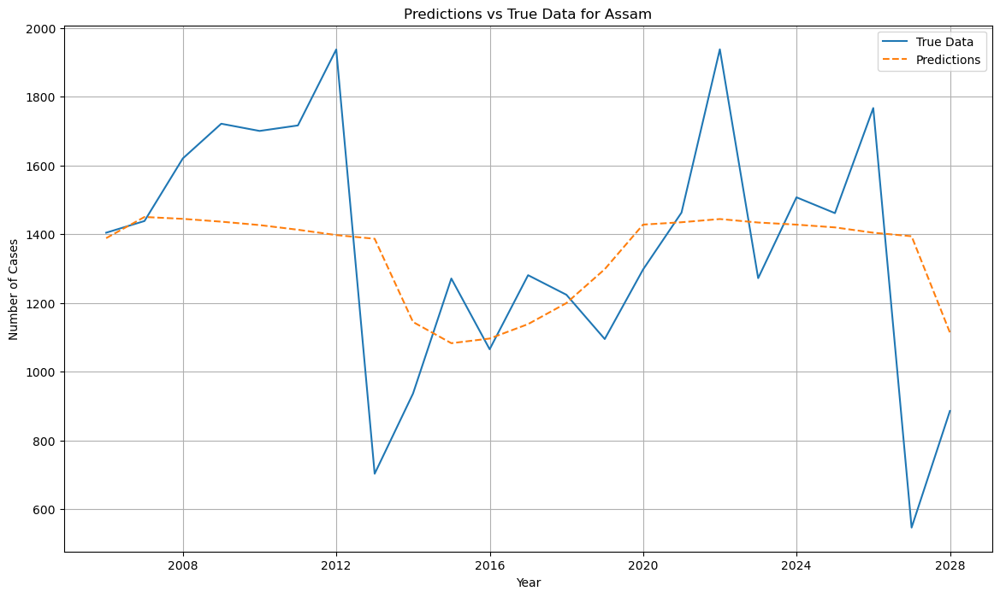

Augmented cases shape for Bihar: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4317 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.4132 - val_loss: 0.1842
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1307 - val_loss: 0.0625
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0773 - val_loss: 0.0603
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0547 - val_loss: 0.0599
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0470 - val_loss: 0.0597
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0518 - val_loss: 0.0600
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0322 - val_loss: 0.0583
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0729 - val_loss: 0.0598
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0776 - val_loss: 0.0580
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0686 - val_loss: 0.0564
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0589 - val_loss: 0.0563
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0330 - val_loss: 0.0559

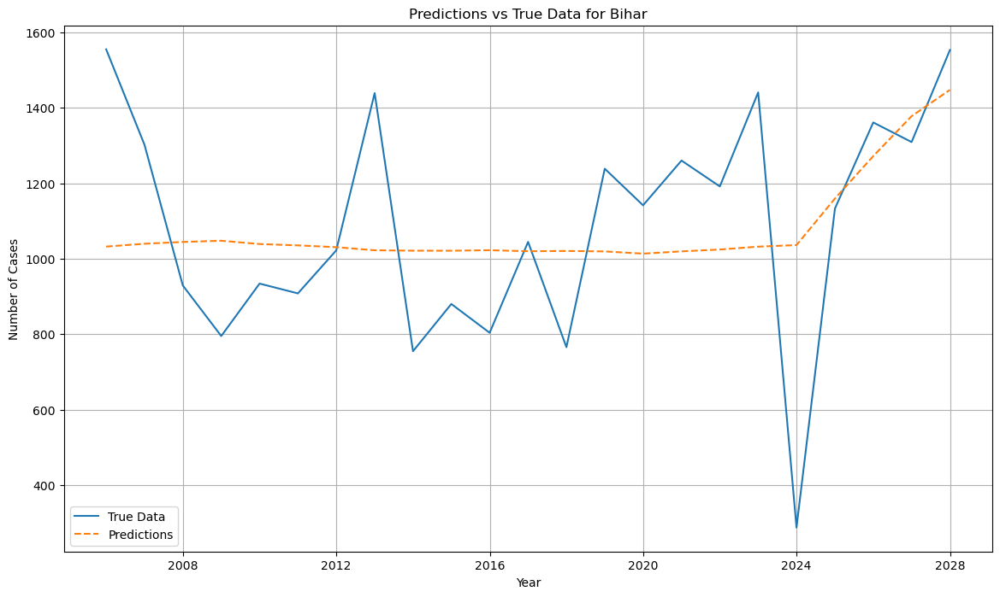

Augmented cases shape for Chhattisgarh: (28, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1693 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1667 - val_loss: 0.0739
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0749 - val_loss: 0.0555
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0590 - val_loss: 0.0565
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0418 - val_loss: 0.0554
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0438 - val_loss: 0.0560
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0559 - val_loss: 0.0547
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0634 - val_loss: 0.0556
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0746 - val_loss: 0.0544
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0956 - val_loss: 0.0549
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0643 - val_loss: 0.0551
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0612 - val_loss: 0.0546
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0446 - val_loss: 0.0545

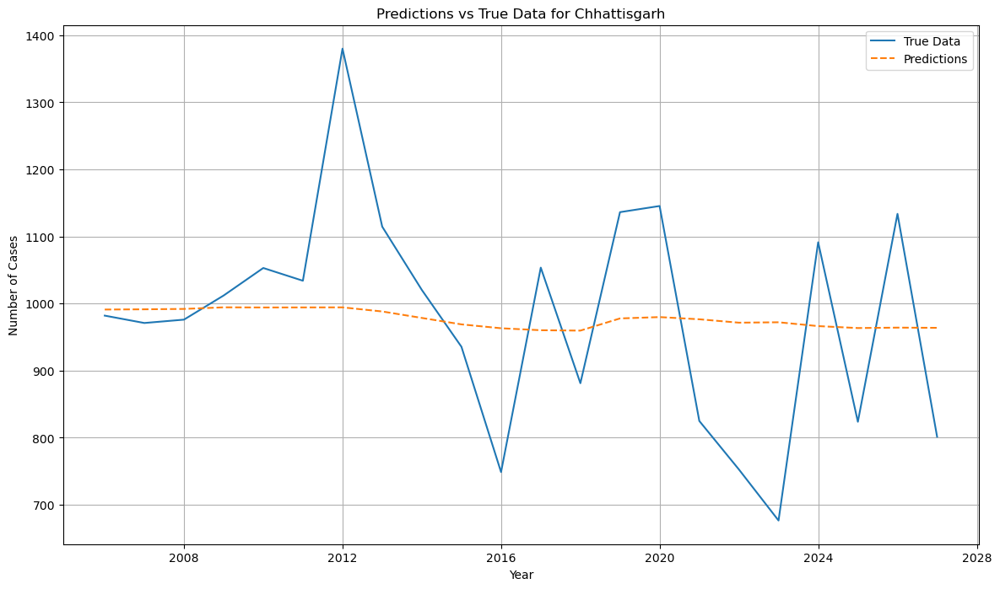

Augmented cases shape for Goa: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1900 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1914 - val_loss: 0.1216
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0897 - val_loss: 0.0636
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0490 - val_loss: 0.0597
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0705 - val_loss: 0.0597
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0675 - val_loss: 0.0584
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0752 - val_loss: 0.0587
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0403 - val_loss: 0.0588
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0376 - val_loss: 0.0576
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0458 - val_loss: 0.0586
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0480 - val_loss: 0.0568
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0473 - val_loss: 0.0568
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0854 - val_loss: 0.0568

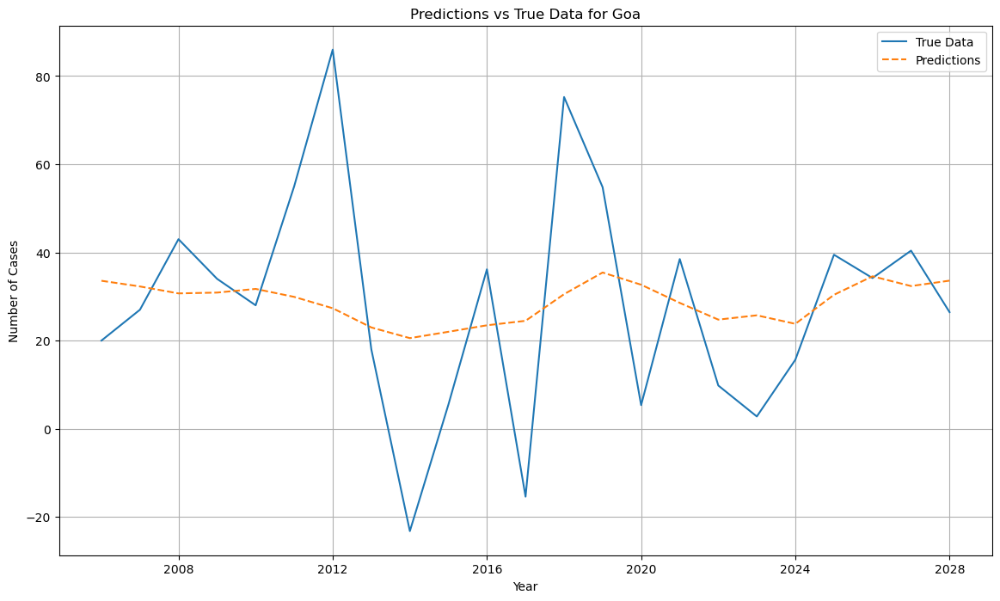

Augmented cases shape for Gujarat: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


14/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3380 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.3295 - val_loss: 0.1678
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0493 - val_loss: 0.1146
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0957 - val_loss: 0.0616
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0418 - val_loss: 0.0593
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0478 - val_loss: 0.0587
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0412 - val_loss: 0.0591
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0472 - val_loss: 0.0587
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0690 - val_loss: 0.0585
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0706 - val_loss: 0.0592
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0488 - val_loss: 0.0583
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0480 - val_loss: 0.0586
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0637 - val_loss: 0.0608

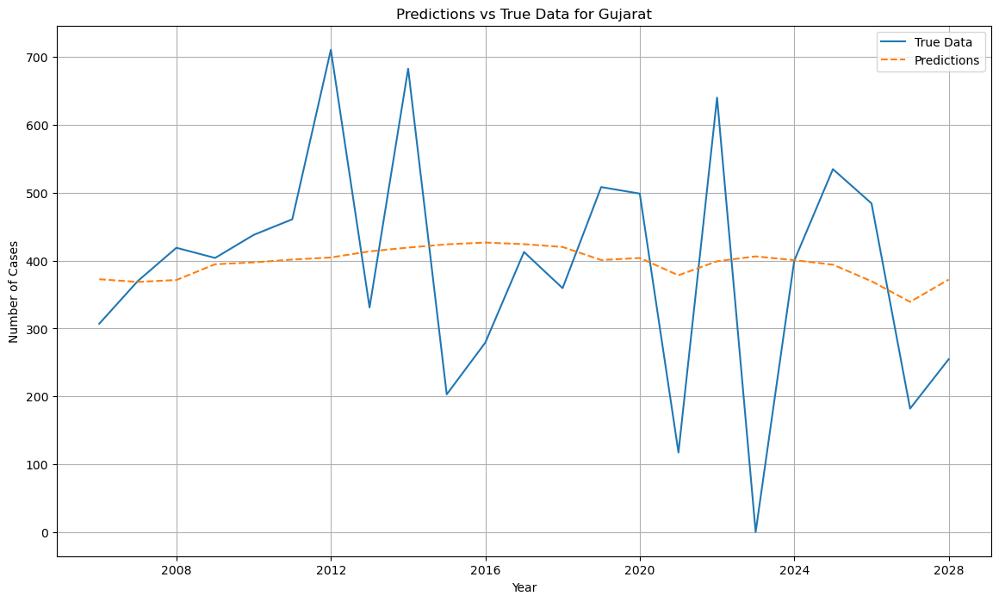

Augmented cases shape for Haryana: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2225 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2193 - val_loss: 0.0911
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0953 - val_loss: 0.0842
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0688 - val_loss: 0.0750
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0835 - val_loss: 0.0748
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0731 - val_loss: 0.0740
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0909 - val_loss: 0.0751
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0854 - val_loss: 0.0739
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0458 - val_loss: 0.0728
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0958 - val_loss: 0.0730
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0707 - val_loss: 0.0724
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0830 - val_loss: 0.0723
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0604 - val_loss: 0.0720

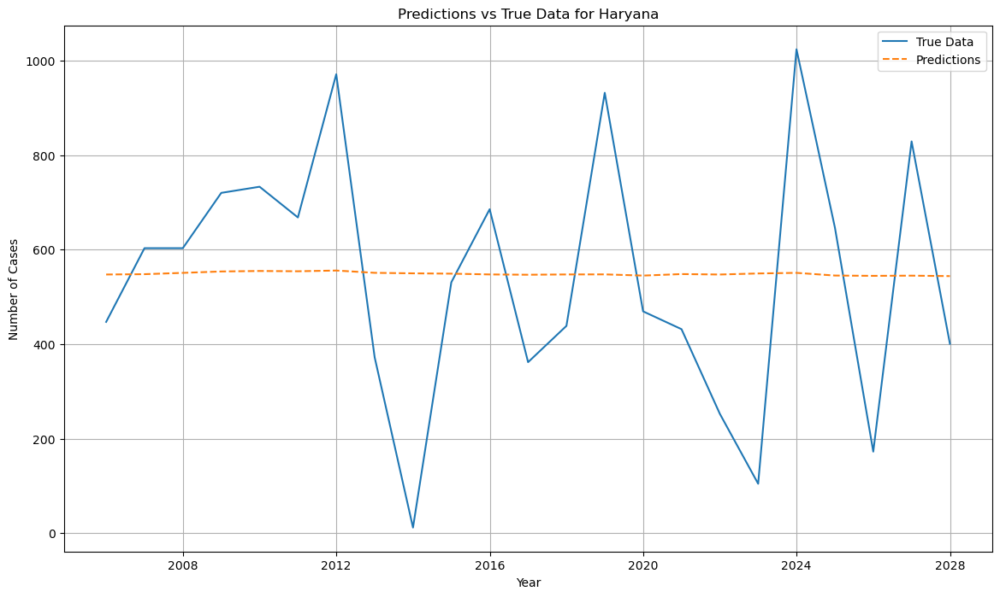

Augmented cases shape for Himachal Pradesh: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


10/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3168 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2673 - val_loss: 0.1423
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0687 - val_loss: 0.0522
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0818 - val_loss: 0.0513
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0501 - val_loss: 0.0499
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0362 - val_loss: 0.0508
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0515 - val_loss: 0.0496
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0491 - val_loss: 0.0495
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0400 - val_loss: 0.0498
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0476 - val_loss: 0.0496
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0544 - val_loss: 0.0496
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0601 - val_loss: 0.0493
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0624 - val_loss: 0.0494

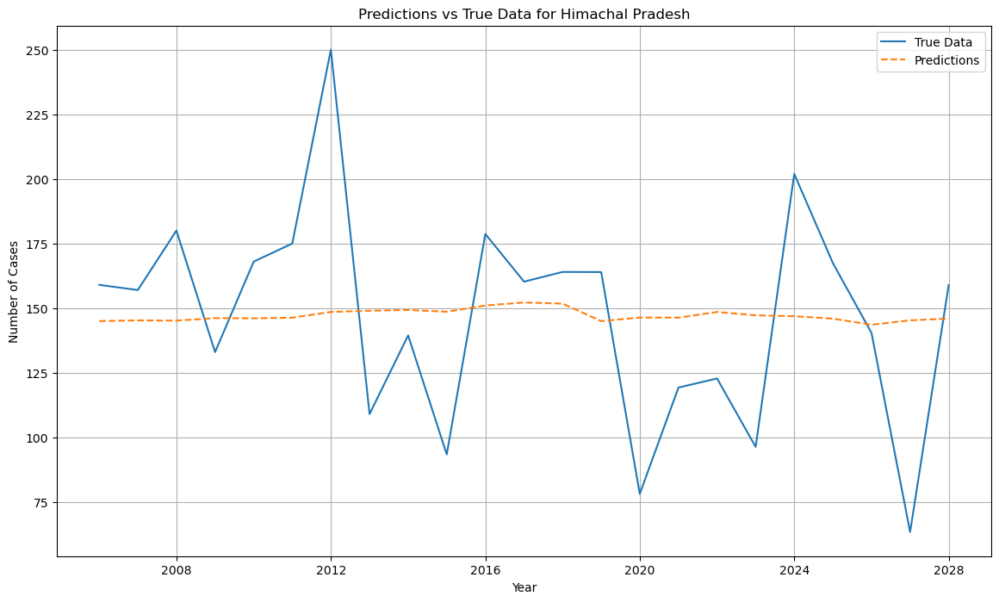

Augmented cases shape for Jammu & Kashmir: (28, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


11/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2098 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.1991 - val_loss: 0.1609
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1459 - val_loss: 0.0771
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0763 - val_loss: 0.0817
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0716 - val_loss: 0.0769
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0634 - val_loss: 0.0686
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0734 - val_loss: 0.0680
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0780 - val_loss: 0.0676
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0908 - val_loss: 0.0673
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0721 - val_loss: 0.0669
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0647 - val_loss: 0.0664
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0876 - val_loss: 0.0661
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0529 - val_loss: 0.06

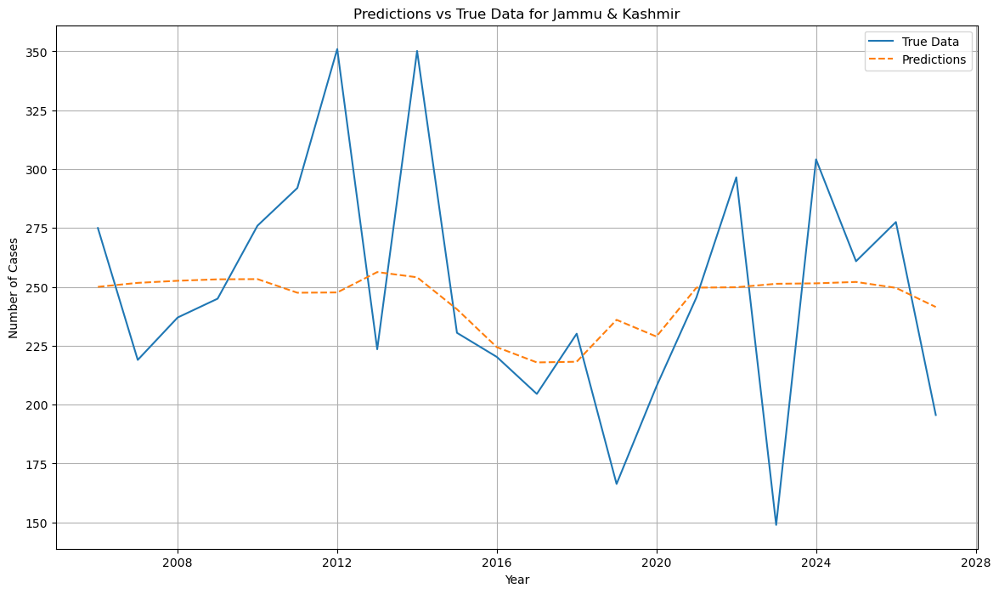

Augmented cases shape for Jharkhand: (28, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/22 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2341 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2390 - val_loss: 0.1393
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1073 - val_loss: 0.0850
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0615 - val_loss: 0.0873
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1079 - val_loss: 0.0827
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0851 - val_loss: 0.0822
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0962 - val_loss: 0.0820
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0660 - val_loss: 0.0820
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0841 - val_loss: 0.0809
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0826 - val_loss: 0.0804
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0733 - val_loss: 0.0803
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0593 - val_loss: 0.0798
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0857 - val_loss: 0.0804

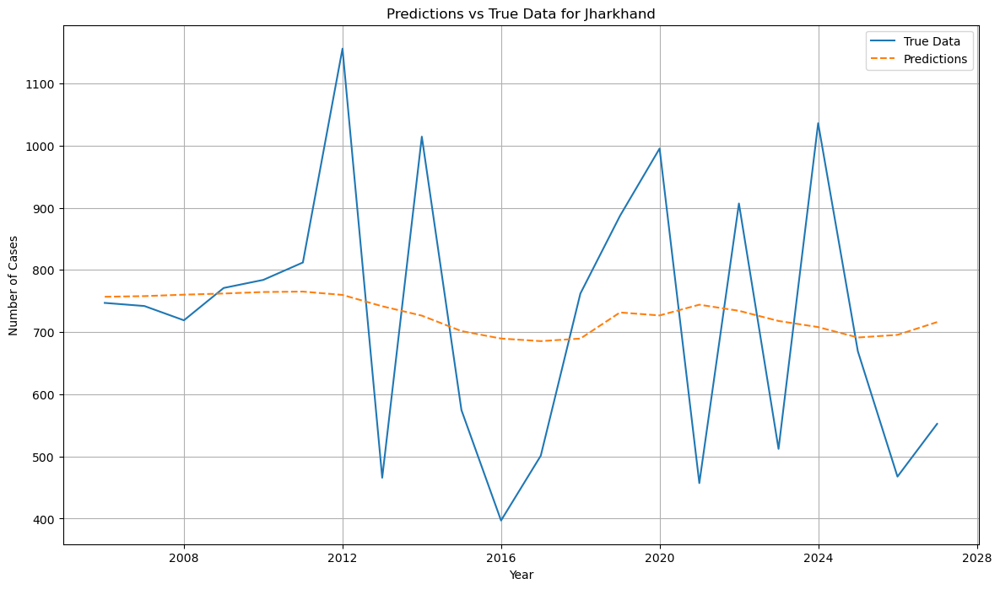

Augmented cases shape for Karnataka: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3794 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.3422 - val_loss: 0.0913
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0445 - val_loss: 0.0474
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0369 - val_loss: 0.0472
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0467 - val_loss: 0.0469
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0502 - val_loss: 0.0537
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0395 - val_loss: 0.0469
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0310 - val_loss: 0.0463
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0521 - val_loss: 0.0462
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0223 - val_loss: 0.0465
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0330 - val_loss: 0.0483
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0616 - val_loss: 0.0463
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0758 - val_loss: 0.0461

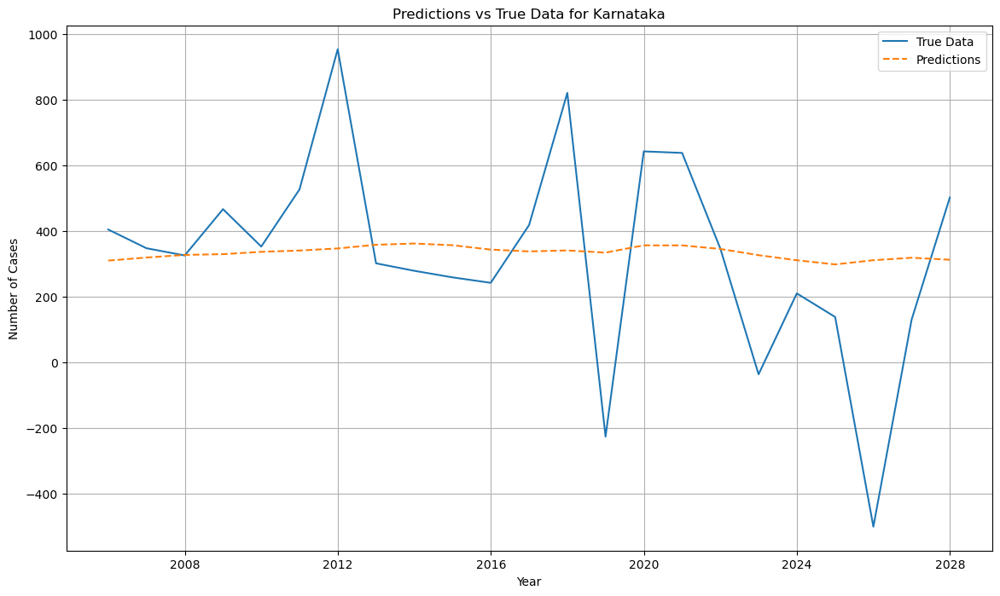

Augmented cases shape for Kerala: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4305 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.3765 - val_loss: 0.1617
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1453 - val_loss: 0.0869
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0918 - val_loss: 0.0883
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0943 - val_loss: 0.0880
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0678 - val_loss: 0.0853
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0677 - val_loss: 0.0852
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0929 - val_loss: 0.0857
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1012 - val_loss: 0.0846
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1034 - val_loss: 0.0846
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1061 - val_loss: 0.0872
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0721 - val_loss: 0.0884
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0653 - val_loss: 0.0841

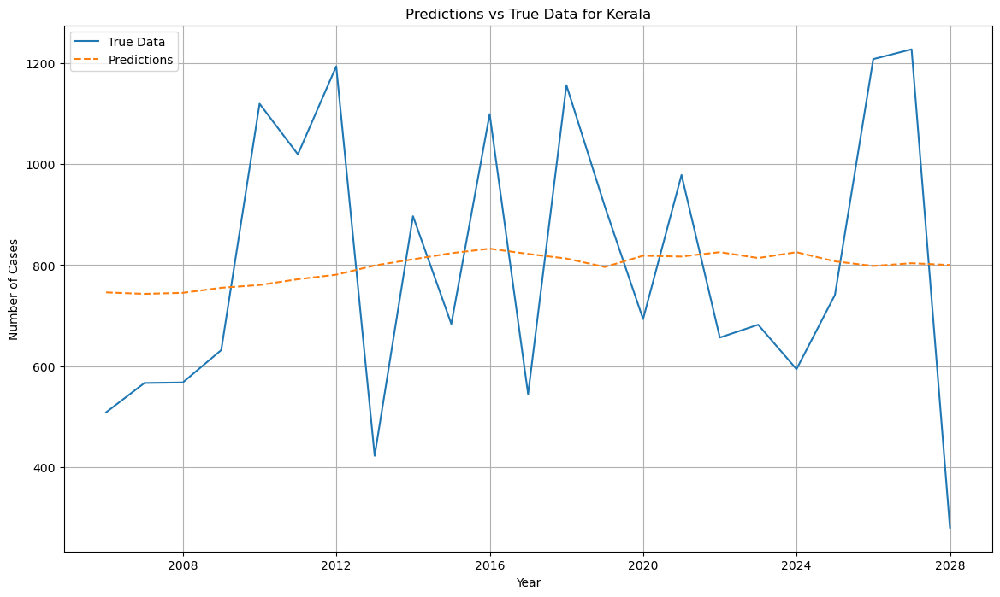

Augmented cases shape for Madhya Pradesh: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5692

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.5517 - val_loss: 0.2230
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1682 - val_loss: 0.0560
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0542 - val_loss: 0.0494
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0523 - val_loss: 0.0476
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0356 - val_loss: 0.0487
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0503 - val_loss: 0.0469
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0411 - val_loss: 0.0499
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0560 - val_loss: 0.0457
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0243 - val_loss: 0.0471
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0394 - val_loss: 0.0441
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0404 - val_loss: 0.0427
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0446 - val_

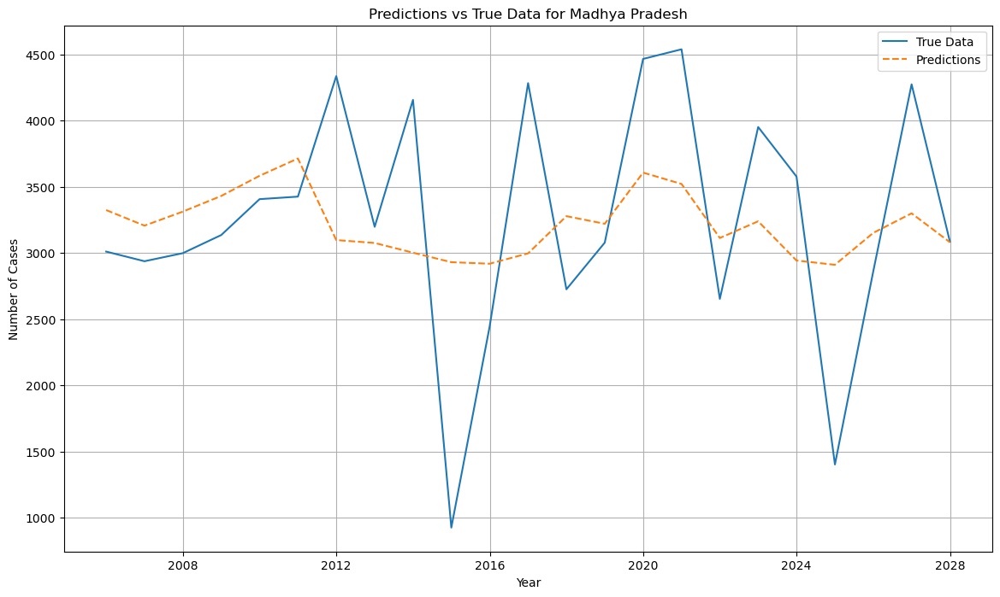

Augmented cases shape for Maharashtra: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
17/23 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2161

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1990 - val_loss: 0.0740
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0610 - val_loss: 0.0469
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0581 - val_loss: 0.0464
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0356 - val_loss: 0.0449
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0326 - val_loss: 0.0446
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0373 - val_loss: 0.0444
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0318 - val_loss: 0.0442
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0417 - val_loss: 0.0444
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0337 - val_loss: 0.0438
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0709 - val_loss: 0.0440
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0972 - val_loss: 0.0451
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0244 - val_

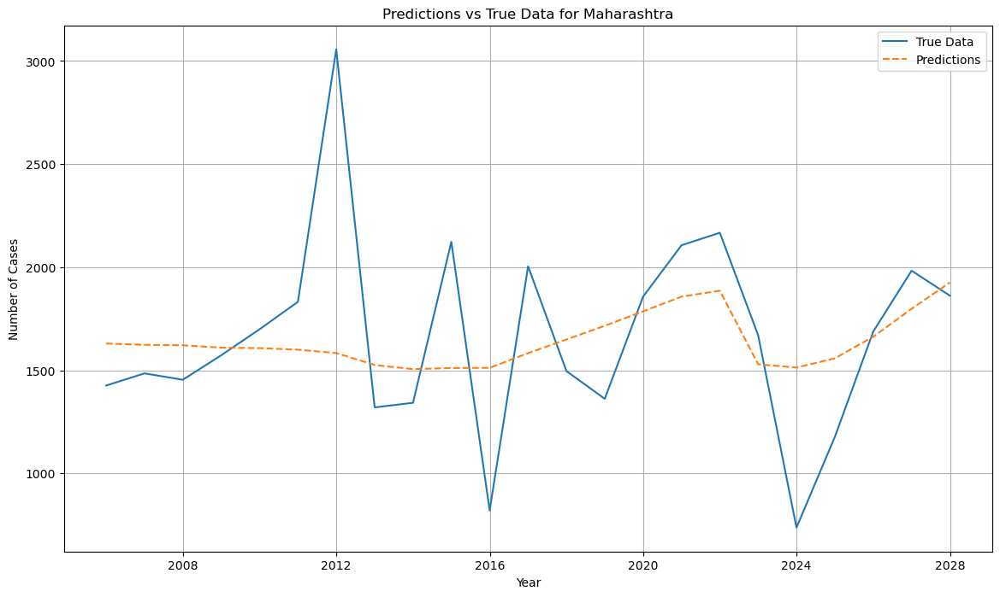

Augmented cases shape for Manipur: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
20/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2408

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.2469 - val_loss: 0.1730
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.1603 - val_loss: 0.0869
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0985 - val_loss: 0.0879
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0614 - val_loss: 0.0845
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0995 - val_loss: 0.0833
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0627 - val_loss: 0.0830
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0672 - val_loss: 0.0835
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0915 - val_loss: 0.0828
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0870 - val_loss: 0.0829
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0734 - val_loss: 0.0839
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0618 - val_loss: 0.0856
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0953 - val_

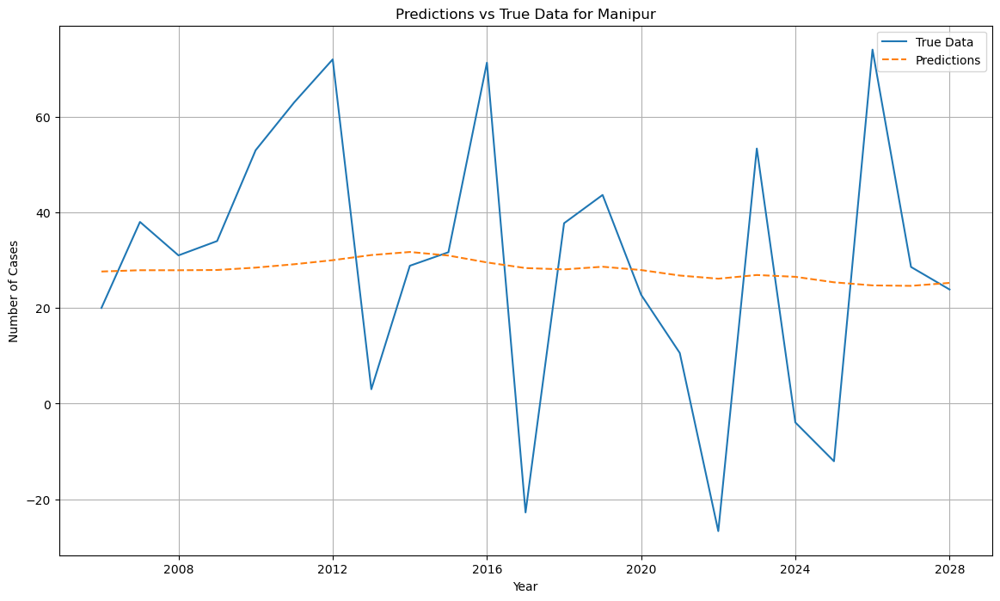

Augmented cases shape for Meghalaya: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4067 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.3630 - val_loss: 0.1135
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0789 - val_loss: 0.0540
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0874 - val_loss: 0.0562
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0675 - val_loss: 0.0519
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0458 - val_loss: 0.0520
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0509 - val_loss: 0.0531
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0730 - val_loss: 0.0502
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0693 - val_loss: 0.0499
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0516 - val_loss: 0.0491
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0756 - val_loss: 0.0494
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0334 - val_loss: 0.0489
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0486 - val_

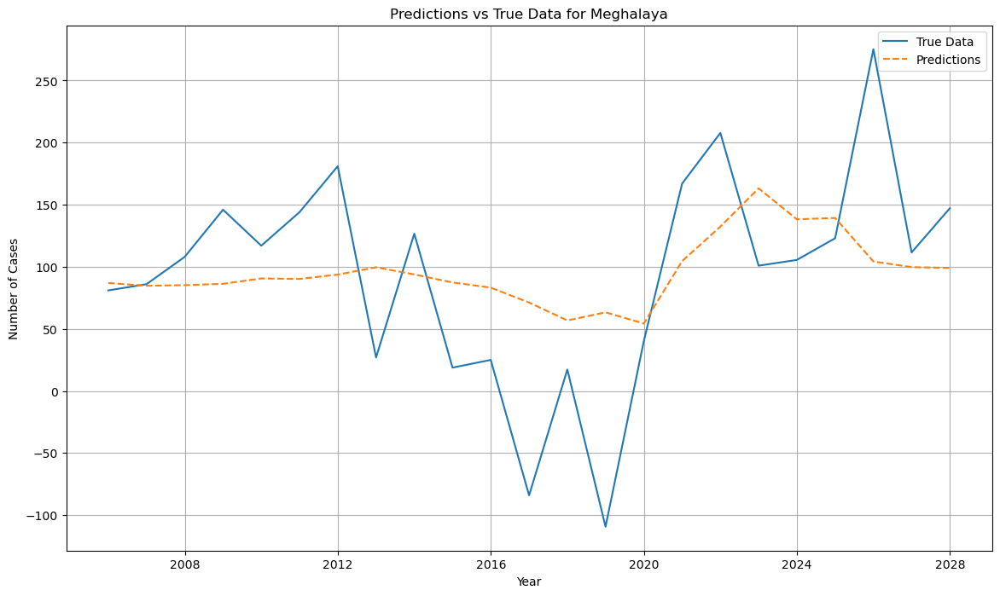

Augmented cases shape for Mizoram: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2823

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - loss: 0.2826 - val_loss: 0.1595
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1148 - val_loss: 0.0907
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0914 - val_loss: 0.0840
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0598 - val_loss: 0.0829
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1096 - val_loss: 0.0825
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0880 - val_loss: 0.0812
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1186 - val_loss: 0.0806
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0629 - val_loss: 0.0839
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1086 - val_loss: 0.0808
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0767 - val_loss: 0.0789
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0979 - val_loss: 0.0785
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0951 - val_

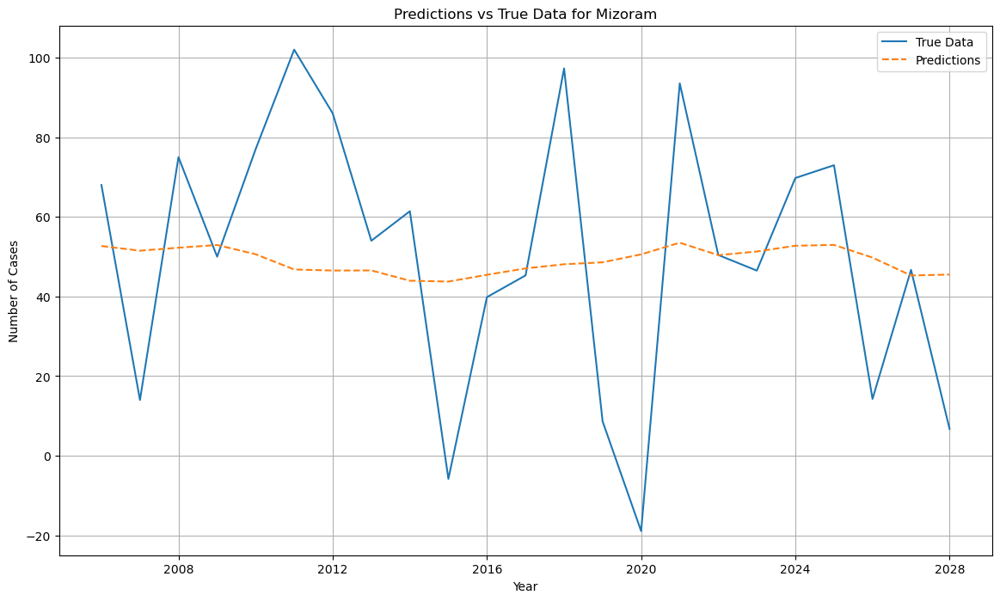

Augmented cases shape for Nagaland: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


12/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2249 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.2040 - val_loss: 0.1119
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0721 - val_loss: 0.0753
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0812 - val_loss: 0.0709
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0823 - val_loss: 0.0690
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0658 - val_loss: 0.0688
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0577 - val_loss: 0.0691
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0832 - val_loss: 0.0685
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0548 - val_loss: 0.0684
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0693 - val_loss: 0.0683
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0545 - val_loss: 0.0683
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0739 - val_loss: 0.0683
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0704 - val_loss: 0.0694

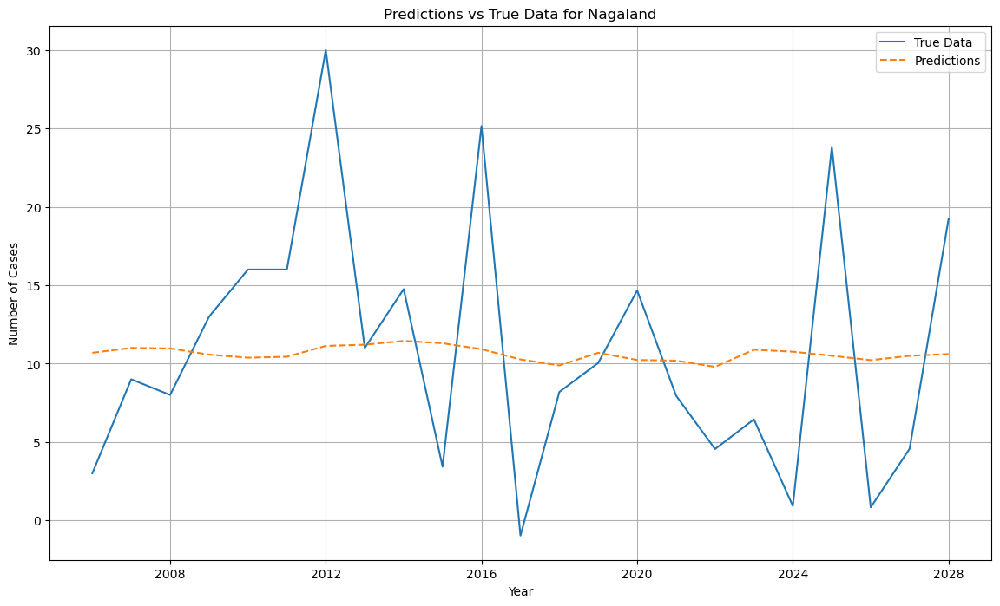

Augmented cases shape for Odisha: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
17/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3094

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.3066 - val_loss: 0.1476
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1356 - val_loss: 0.0807
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1037 - val_loss: 0.0815
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1037 - val_loss: 0.0801
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0490 - val_loss: 0.0797
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0699 - val_loss: 0.0858
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0768 - val_loss: 0.0776
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1087 - val_loss: 0.0778
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0703 - val_loss: 0.0771
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0893 - val_loss: 0.0756
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0463 - val_loss: 0.0750
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0789 - val_

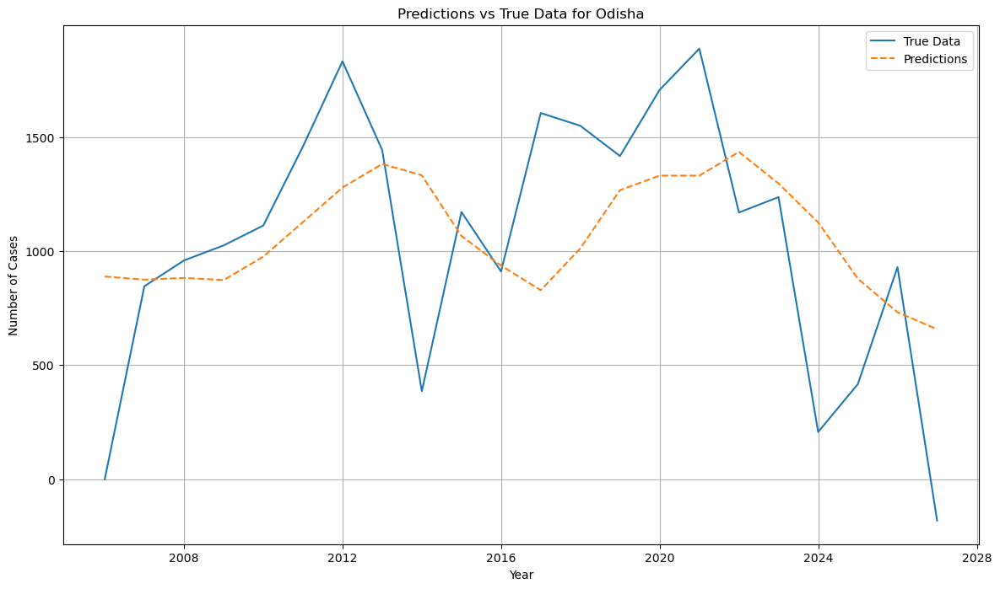

Augmented cases shape for Punjab: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2929

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - loss: 0.2931 - val_loss: 0.2297
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2774 - val_loss: 0.0640
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0682 - val_loss: 0.0644
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0796 - val_loss: 0.0593
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0451 - val_loss: 0.0594
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0454 - val_loss: 0.0618
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0745 - val_loss: 0.0600
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0832 - val_loss: 0.0593
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0413 - val_loss: 0.0591
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0715 - val_loss: 0.0614
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0755 - val_loss: 0.0596
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0690 - val_loss: 0.059

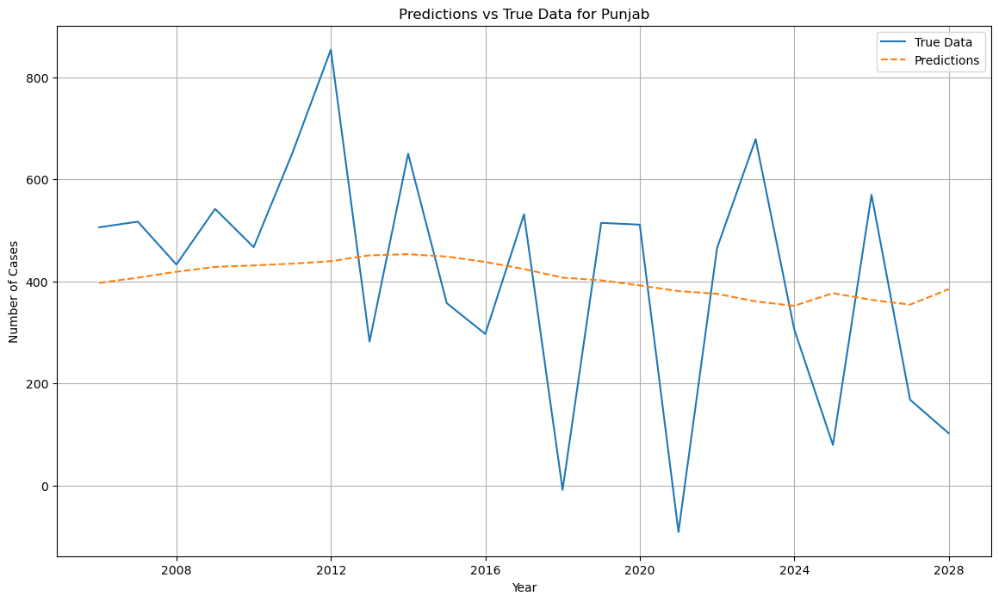

Augmented cases shape for Rajasthan: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1630

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1599 - val_loss: 0.0613
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0587 - val_loss: 0.0439
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0484 - val_loss: 0.0427
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0343 - val_loss: 0.0428
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0747 - val_loss: 0.0417
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0275 - val_loss: 0.0408
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0285 - val_loss: 0.0406
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0407 - val_loss: 0.0398
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0419 - val_loss: 0.0394
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0617 - val_loss: 0.0385
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0191 - val_loss: 0.0383
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0211 - val_

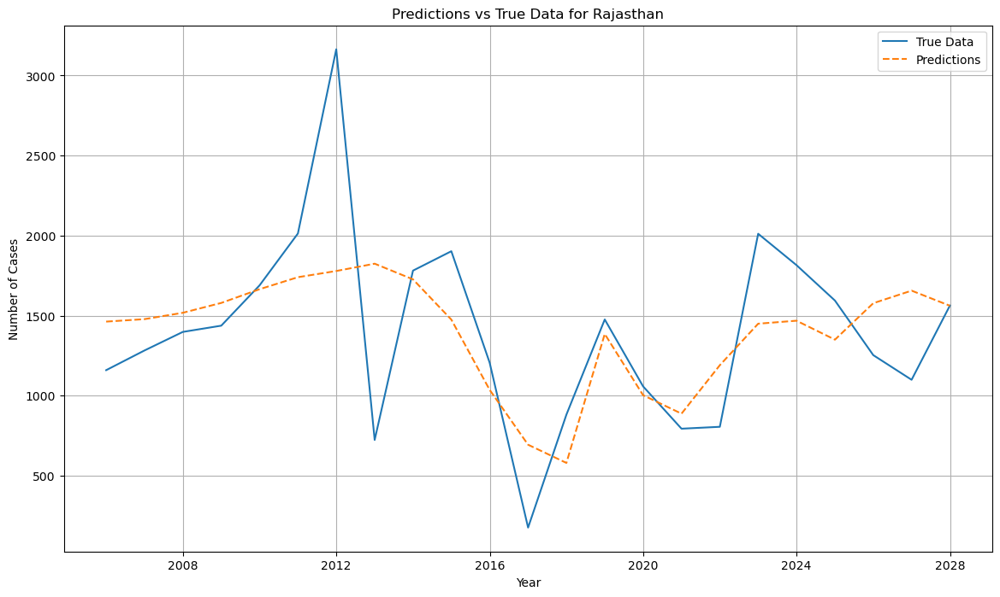

Augmented cases shape for Sikkim: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1141 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - loss: 0.1175 - val_loss: 0.0651
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0540 - val_loss: 0.0532
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0957 - val_loss: 0.0509
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0293 - val_loss: 0.0521
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0655 - val_loss: 0.0511
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0459 - val_loss: 0.0505
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0546 - val_loss: 0.0505
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0366 - val_loss: 0.0504
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0557 - val_loss: 0.0508
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0520 - val_loss: 0.0505
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0422 - val_loss: 0.0505
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0645 - val_lo

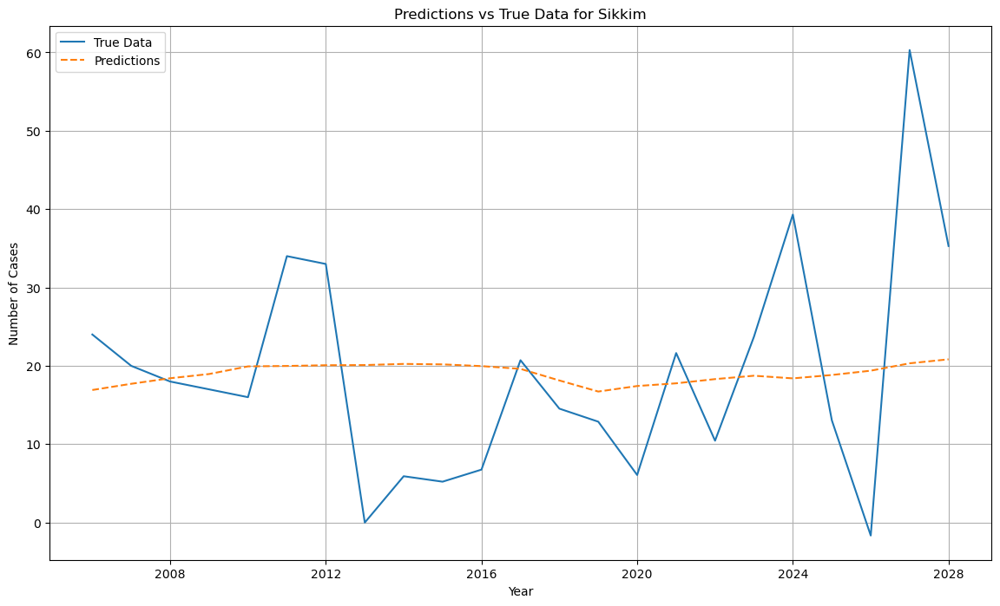

Augmented cases shape for Tamil Nadu: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
12/23 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3724

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.3468 - val_loss: 0.1113
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1275 - val_loss: 0.0586
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353 - val_loss: 0.0605
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0541 - val_loss: 0.0563
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0571 - val_loss: 0.0549
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0460 - val_loss: 0.0541
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0318 - val_loss: 0.0542
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0629 - val_loss: 0.0542
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0604 - val_loss: 0.0527
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0527 - val_loss: 0.0523
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0804 - val_loss: 0.0537
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0626 - val

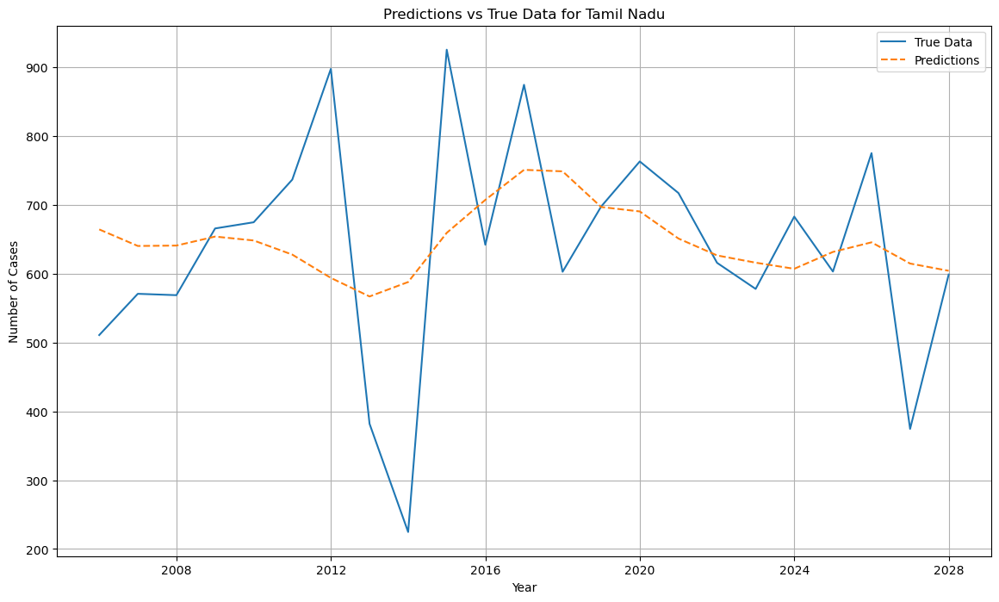

Augmented cases shape for Tripura: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
19/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4332

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - loss: 0.4038 - val_loss: 0.1502
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1022 - val_loss: 0.0737
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0953 - val_loss: 0.0720
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0868 - val_loss: 0.0687
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1168 - val_loss: 0.0675
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0699 - val_loss: 0.0673
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0708 - val_loss: 0.0660
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0468 - val_loss: 0.0662
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0501 - val_loss: 0.0645
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0561 - val_loss: 0.0646
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0595 - val_loss: 0.0657
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0433 - val_

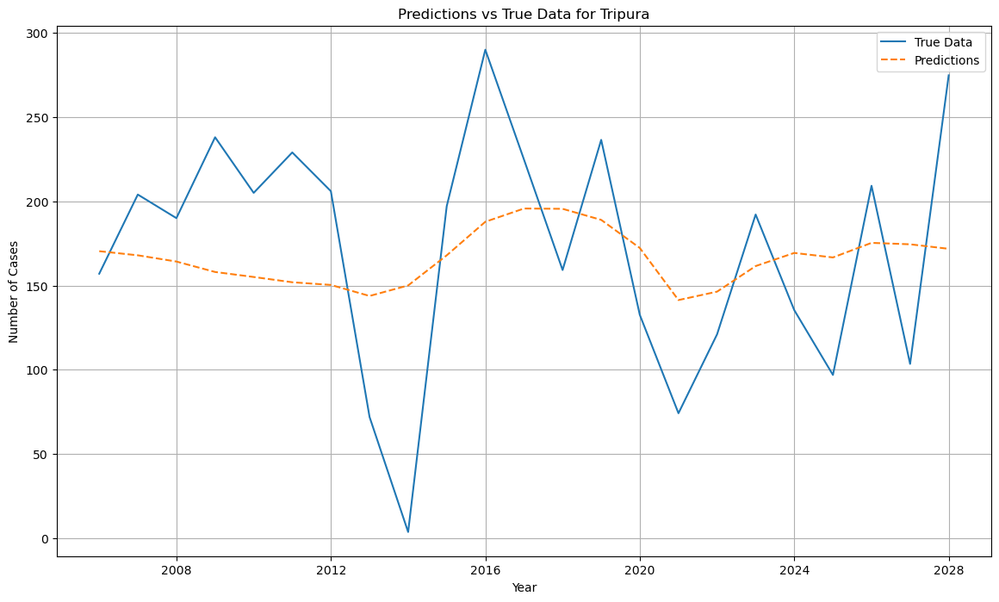

Augmented cases shape for Uttar Pradesh: (29, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
14/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1210

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 22s 551ms/step - loss: 0.1376 - val_loss: 0.1068
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0846 - val_loss: 0.0562
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0525 - val_loss: 0.0560
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0885 - val_loss: 0.0571
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0791 - val_loss: 0.0564
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0447 - val_loss: 0.0559
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1018 - val_loss: 0.0558
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0462 - val_loss: 0.0556
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0449 - val_loss: 0.0557
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0350 - val_loss: 0.0575
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0276 - val_loss: 0.0555
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0963 - val

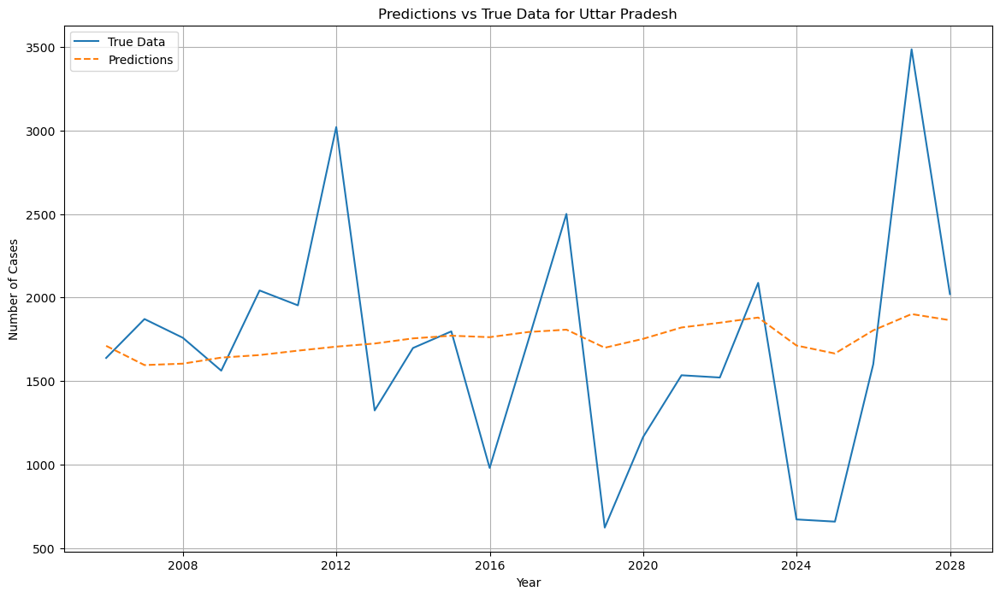

Augmented cases shape for Uttarakhand: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1617

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1564 - val_loss: 0.0985
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0382 - val_loss: 0.0609
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0366 - val_loss: 0.0558
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0522 - val_loss: 0.0525
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0557 - val_loss: 0.0520
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0522 - val_loss: 0.0518
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0548 - val_loss: 0.0518
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0480 - val_loss: 0.0520
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0703 - val_loss: 0.0519
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0370 - val_loss: 0.0512
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0698 - val_loss: 0.0511
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0430 - val_

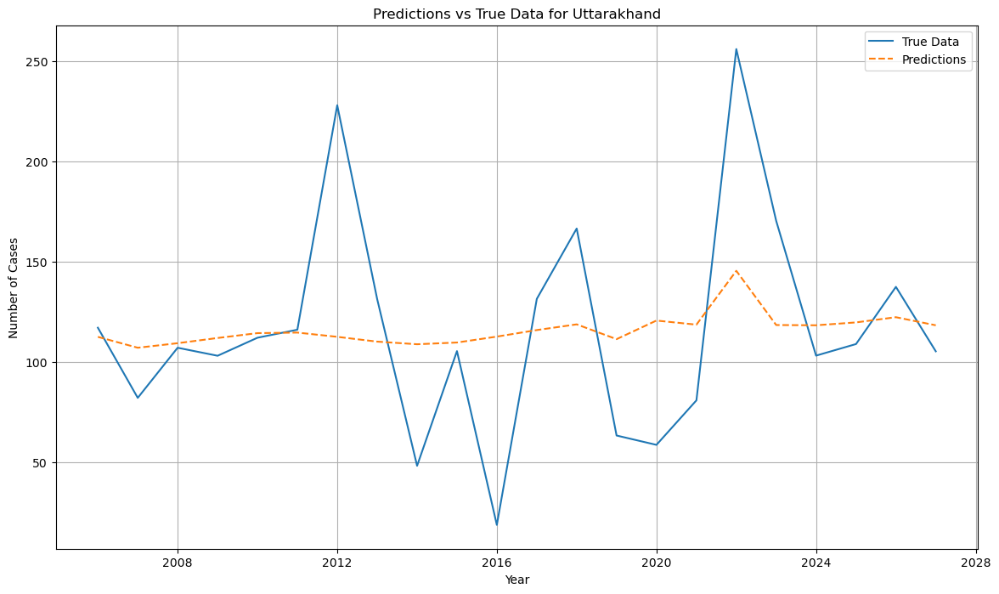

Augmented cases shape for West Bengal: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3137

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.3003 - val_loss: 0.1777
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1640 - val_loss: 0.0602
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0732 - val_loss: 0.0611
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0834 - val_loss: 0.0598
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0670 - val_loss: 0.0595
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0635 - val_loss: 0.0596
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0574 - val_loss: 0.0595
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0525 - val_loss: 0.0593
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0462 - val_loss: 0.0602
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0716 - val_loss: 0.0594
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0713 - val_loss: 0.0589
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0721 - val_

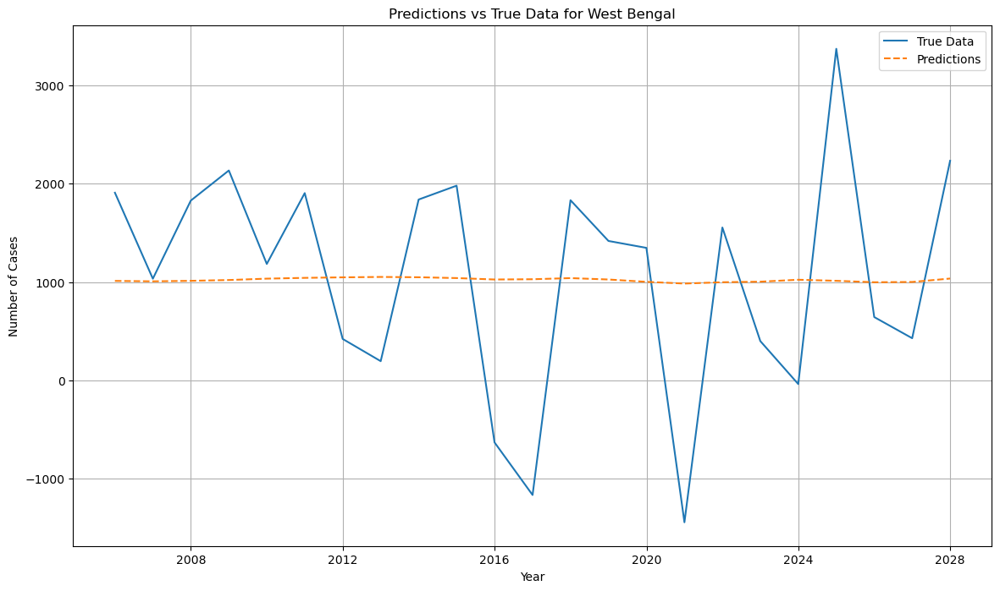

Augmented cases shape for A&N Islands: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/22 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3394

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - loss: 0.3156 - val_loss: 0.1527
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.1414 - val_loss: 0.0710
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0596 - val_loss: 0.0722
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0907 - val_loss: 0.0782
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0602 - val_loss: 0.0695
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0900 - val_loss: 0.0715
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0717 - val_loss: 0.0692
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0852 - val_loss: 0.0702
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0826 - val_loss: 0.0699
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0477 - val_loss: 0.0693
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0599 - val_loss: 0.0692
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1039 - val_

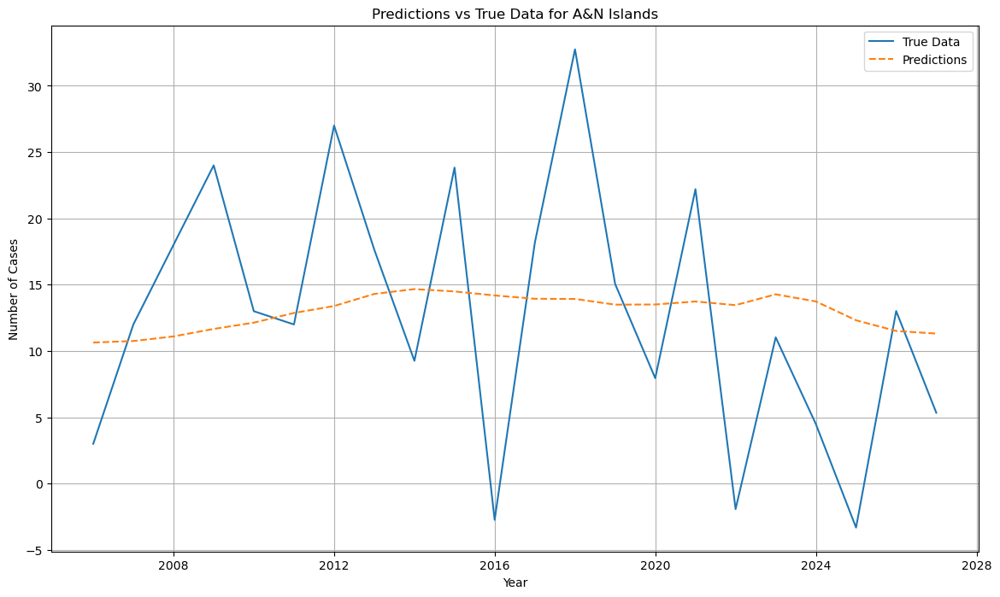

Augmented cases shape for Chandigarh: (29, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/23 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2986 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2878 - val_loss: 0.1311
Epoch 2/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0941 - val_loss: 0.0703
Epoch 3/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1052 - val_loss: 0.0677
Epoch 4/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0648 - val_loss: 0.0679
Epoch 5/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0726 - val_loss: 0.0674
Epoch 6/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0841 - val_loss: 0.0680
Epoch 7/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0761 - val_loss: 0.0705
Epoch 8/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0482 - val_loss: 0.0674
Epoch 9/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0864 - val_loss: 0.0697
Epoch 10/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0774 - val_loss: 0.0674
Epoch 11/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0802 - val_loss: 0.0671
Epoch 12/50
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0640 - val_l

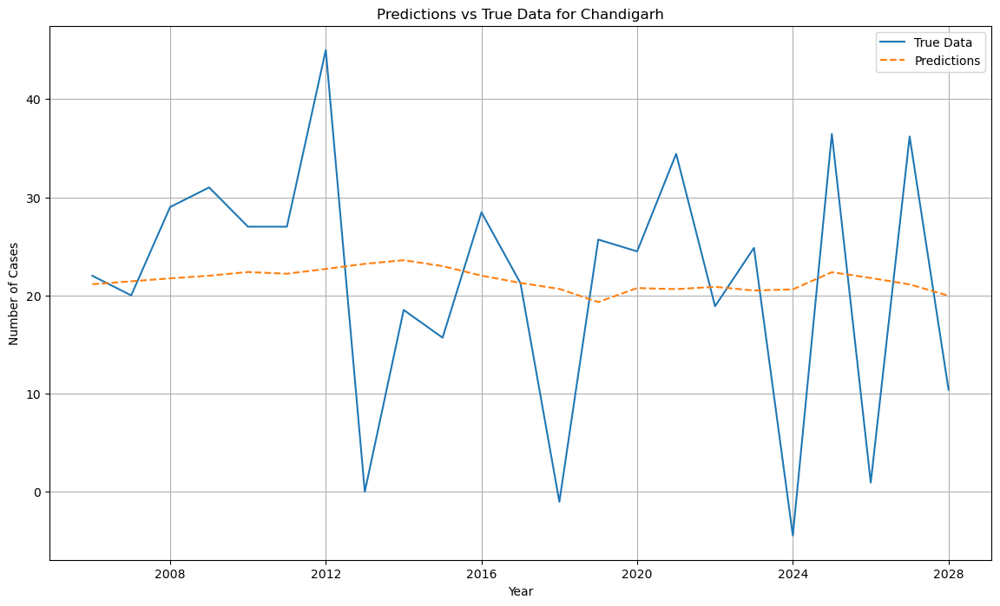

Augmented cases shape for D&N Haveli: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
19/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2629

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2583 - val_loss: 0.1341
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0718 - val_loss: 0.0834
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0728 - val_loss: 0.0729
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0692 - val_loss: 0.0640
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0726 - val_loss: 0.0640
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0642 - val_loss: 0.0638
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0829 - val_loss: 0.0635
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0741 - val_loss: 0.0636
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0679 - val_loss: 0.0622
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0697 - val_loss: 0.0616
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0524 - val_loss: 0.0616
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0579 - val_

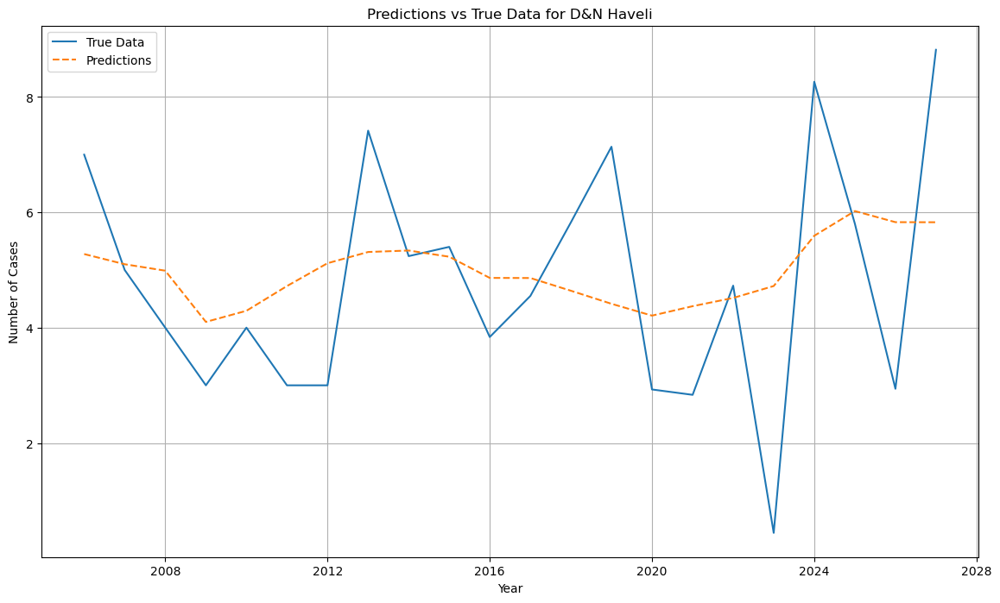

Augmented cases shape for Daman & Diu: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
21/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2779

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.2761 - val_loss: 0.1122
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0711 - val_loss: 0.0812
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0814 - val_loss: 0.0807
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0991 - val_loss: 0.0790
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1040 - val_loss: 0.0782
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0910 - val_loss: 0.0762
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0897 - val_loss: 0.0746
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0609 - val_loss: 0.0735
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0521 - val_loss: 0.0727
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0826 - val_loss: 0.0715
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0633 - val_loss: 0.0707
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0936 - val_

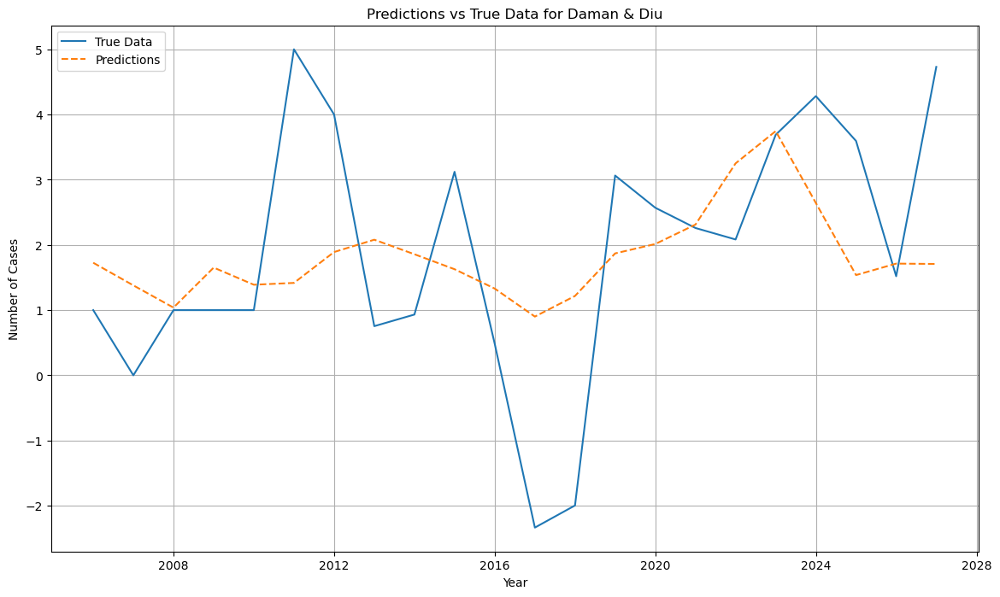

Augmented cases shape for Delhi UT: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
18/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1526

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - loss: 0.1596 - val_loss: 0.1161
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0932 - val_loss: 0.0559
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0665 - val_loss: 0.0554
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0397 - val_loss: 0.0568
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0495 - val_loss: 0.0552
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0513 - val_loss: 0.0552
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0801 - val_loss: 0.0552
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0467 - val_loss: 0.0557
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0535 - val_loss: 0.0554
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0236 - val_loss: 0.0557
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0537 - val_loss: 0.0555
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1056 - val_

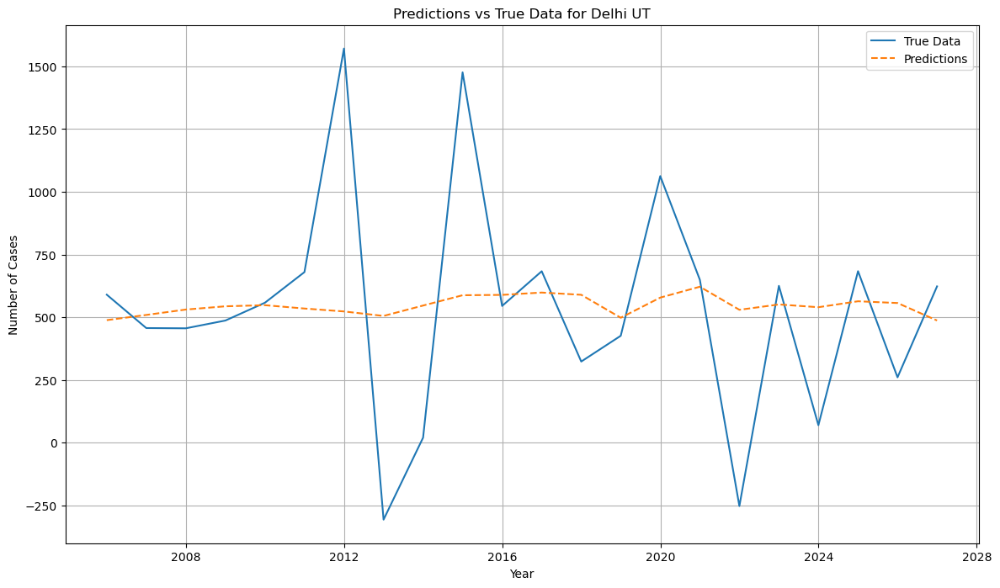

Augmented cases shape for Lakshadweep: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
19/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3574

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.3572 - val_loss: 0.2048
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1729 - val_loss: 0.0598
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0824 - val_loss: 0.0580
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0475 - val_loss: 0.0518
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0468 - val_loss: 0.0519
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0616 - val_loss: 0.0505
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0551 - val_loss: 0.0564
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0650 - val_loss: 0.0508
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0362 - val_loss: 0.0561
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0489 - val_loss: 0.0492
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0706 - val_loss: 0.0483
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0475 - val_

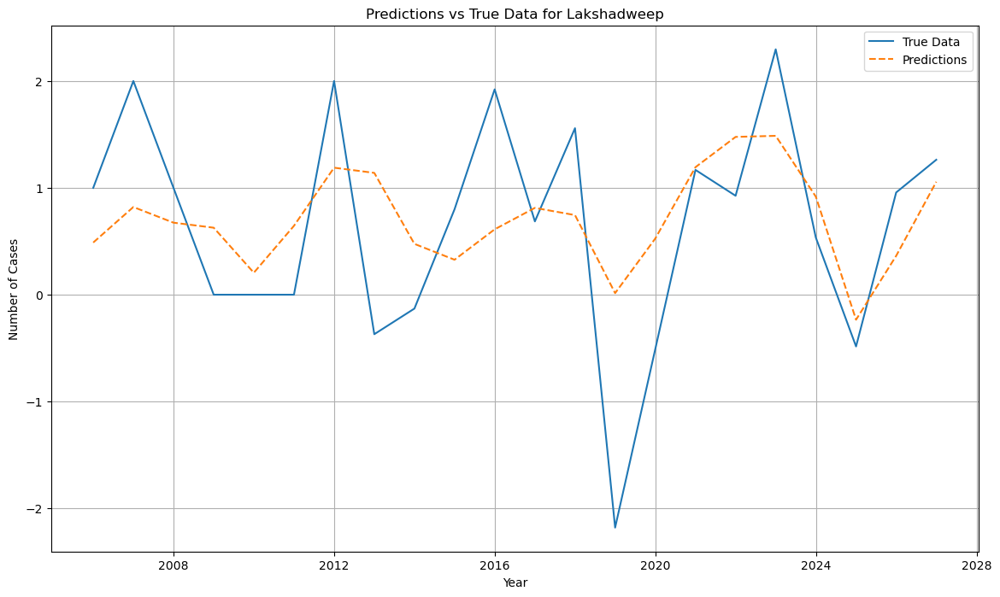

Augmented cases shape for Puducherry: (28, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
20/22 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2496 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.2451 - val_loss: 0.1064
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0713 - val_loss: 0.0694
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0717 - val_loss: 0.0689
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0813 - val_loss: 0.0715
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0702 - val_loss: 0.0713
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0534 - val_loss: 0.0688
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0562 - val_loss: 0.0667
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0968 - val_loss: 0.0668
Epoch 9/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0583 - val_loss: 0.0679
Epoch 10/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0464 - val_loss: 0.0676
Epoch 11/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0467 - val_loss: 0.0654
Epoch 12/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0667 - val_

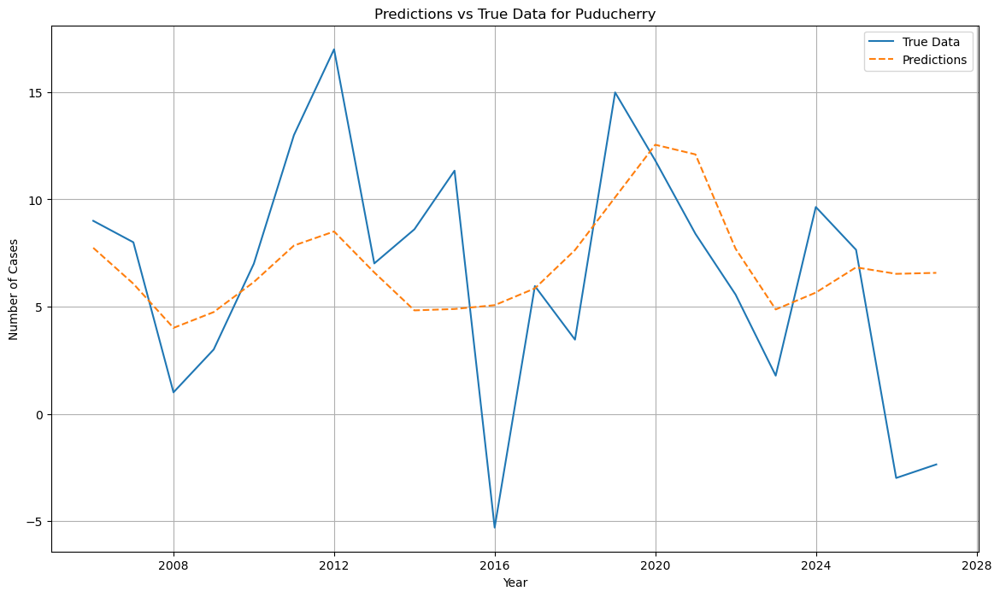

Augmented cases shape for jammu & Kashmir: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

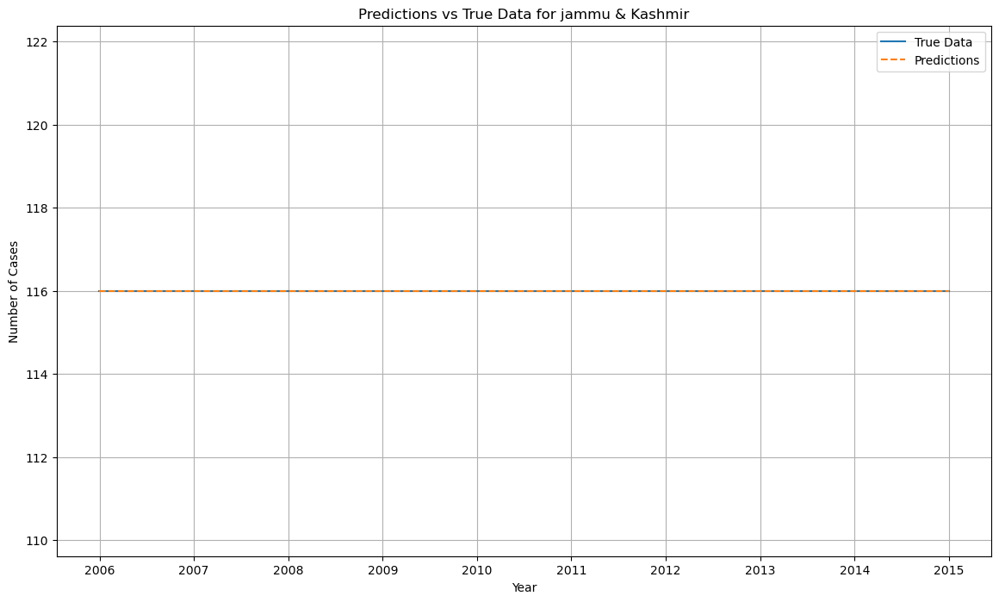

Augmented cases shape for Orissa: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_l

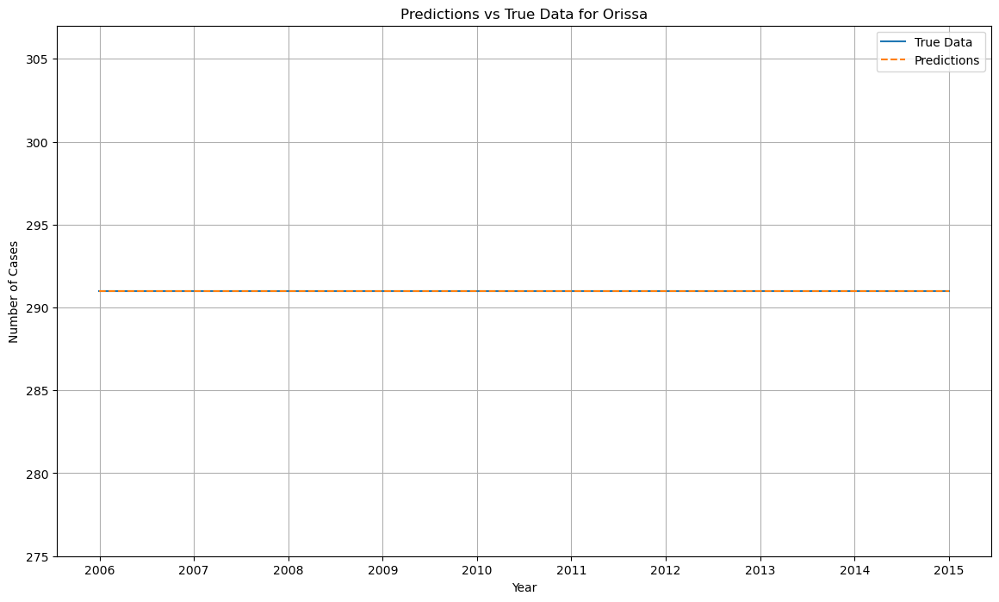

Augmented cases shape for Total States: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_l

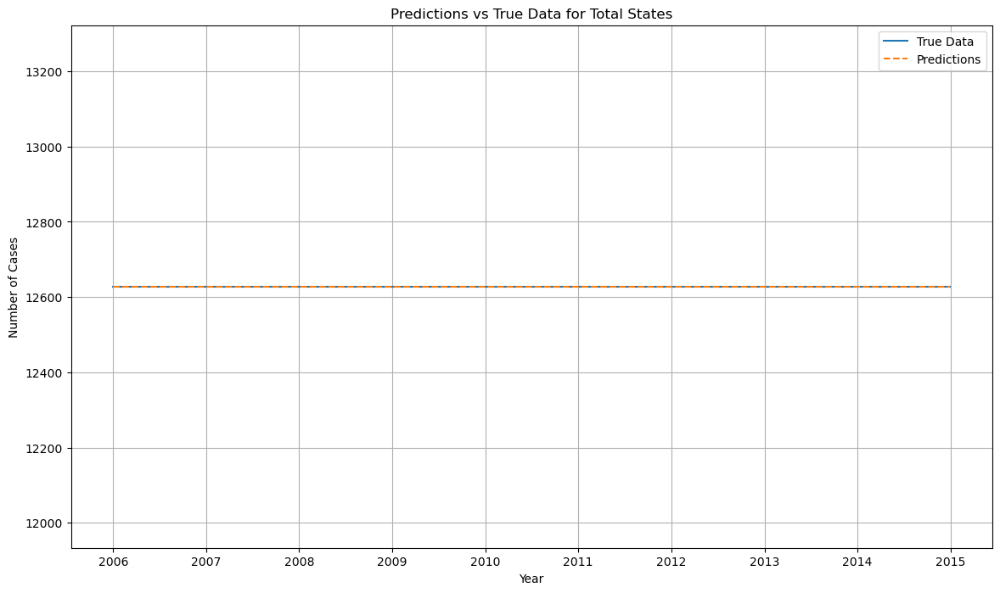

Augmented cases shape for A & N Islands: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_l

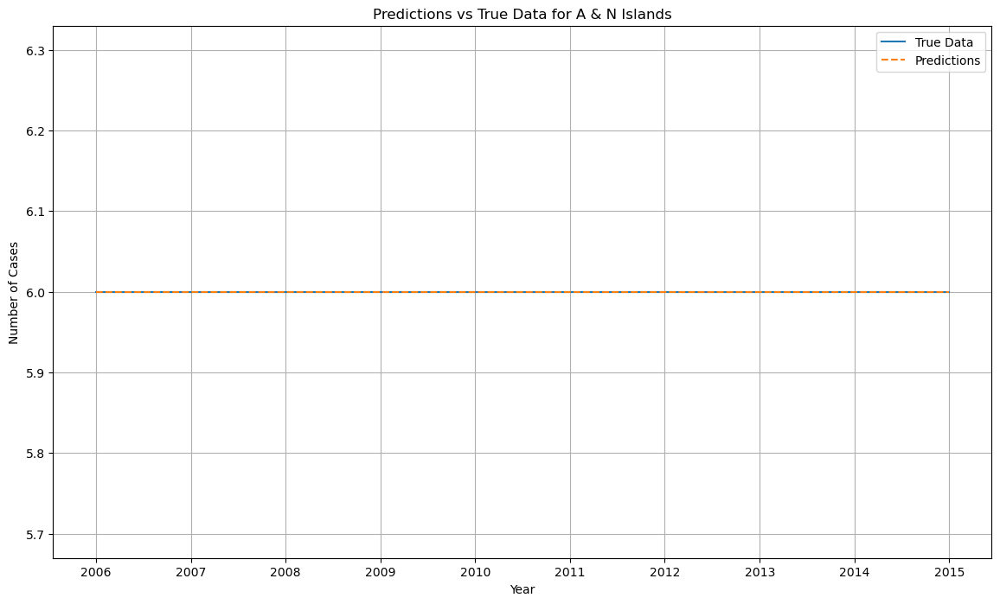

Augmented cases shape for D & N Haveli: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 193ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_l

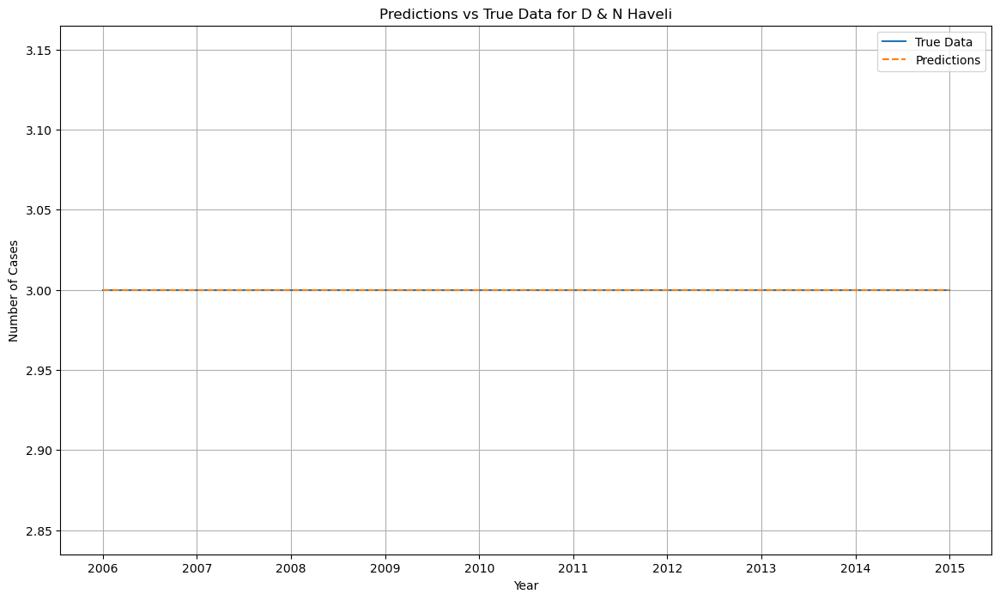

Augmented cases shape for Daman & DIU: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

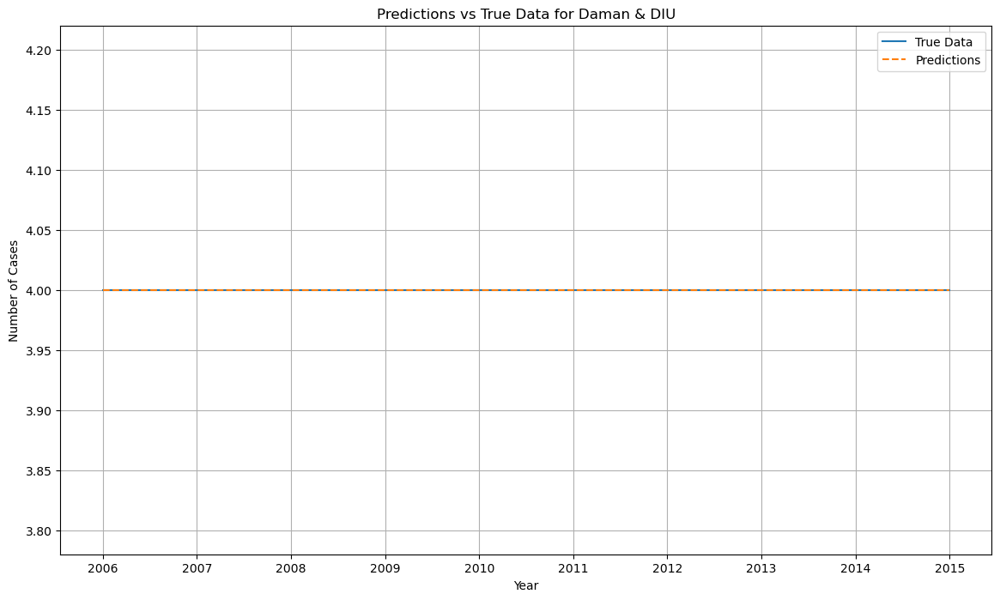

Augmented cases shape for Delhi: (17, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2132 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 138ms/step - loss: 0.2438 - val_loss: 0.2178
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3135 - val_loss: 0.1394
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.1534 - val_loss: 0.0960
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0619 - val_loss: 0.0961
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1111 - val_loss: 0.0944
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0812 - val_loss: 0.0939
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0979 - val_loss: 0.0935
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0795 - val_loss: 0.0936
Epoch 9/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0855 - val_loss: 0.0933
Epoch 10/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0893 - val_loss: 0.0935
Epoch 11/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1677 - val_loss: 0.0930
Epoch 12/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0670 - val

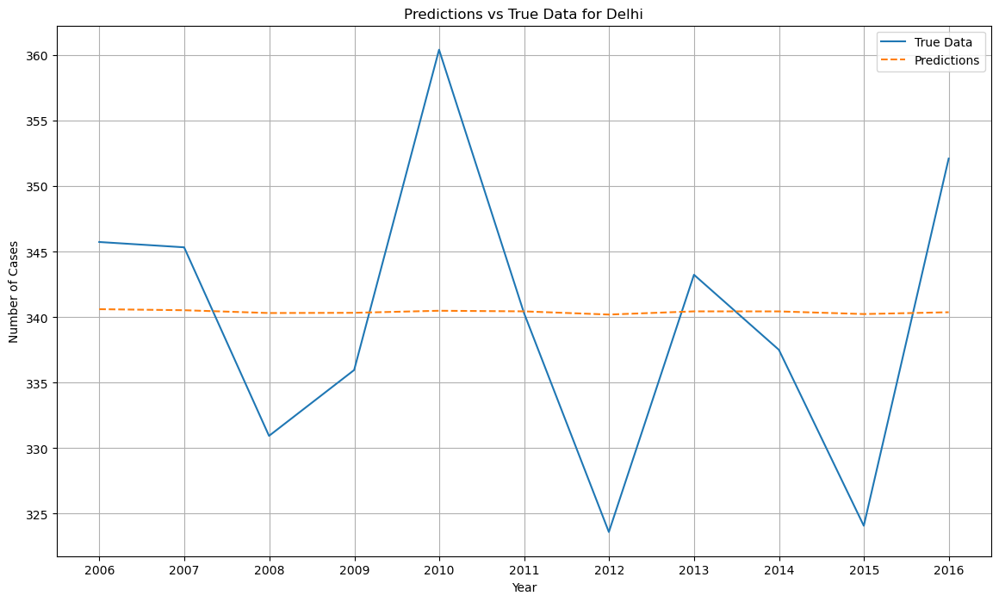

Augmented cases shape for Lakshadeep: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

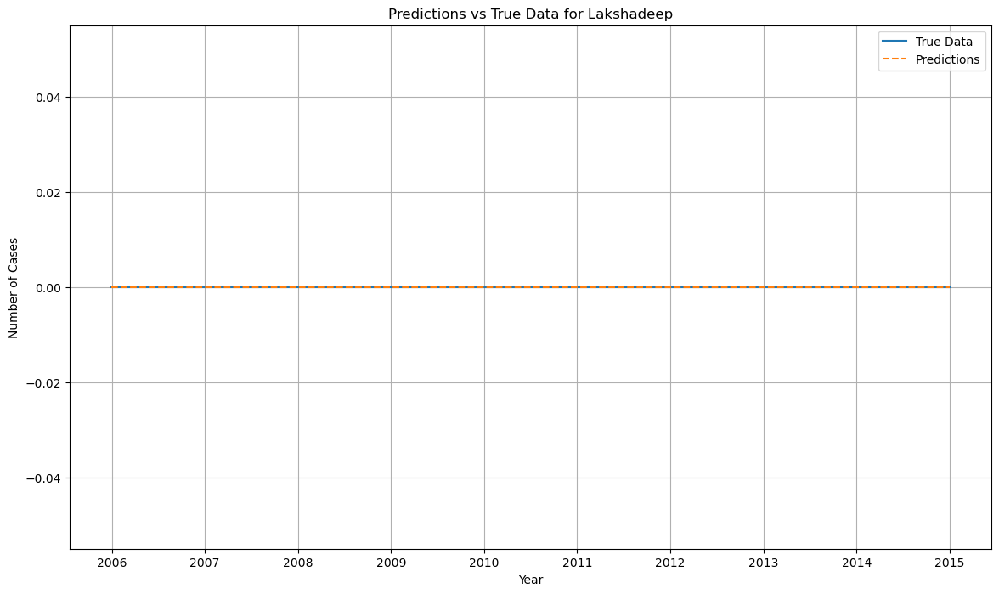

Augmented cases shape for Pondicherry: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

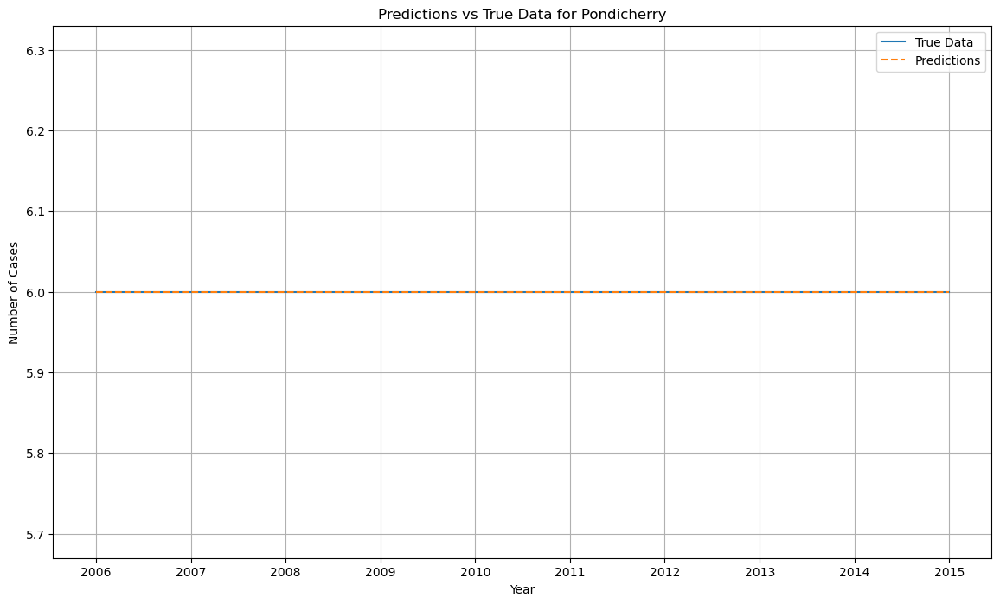

Augmented cases shape for Total (UTs): (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

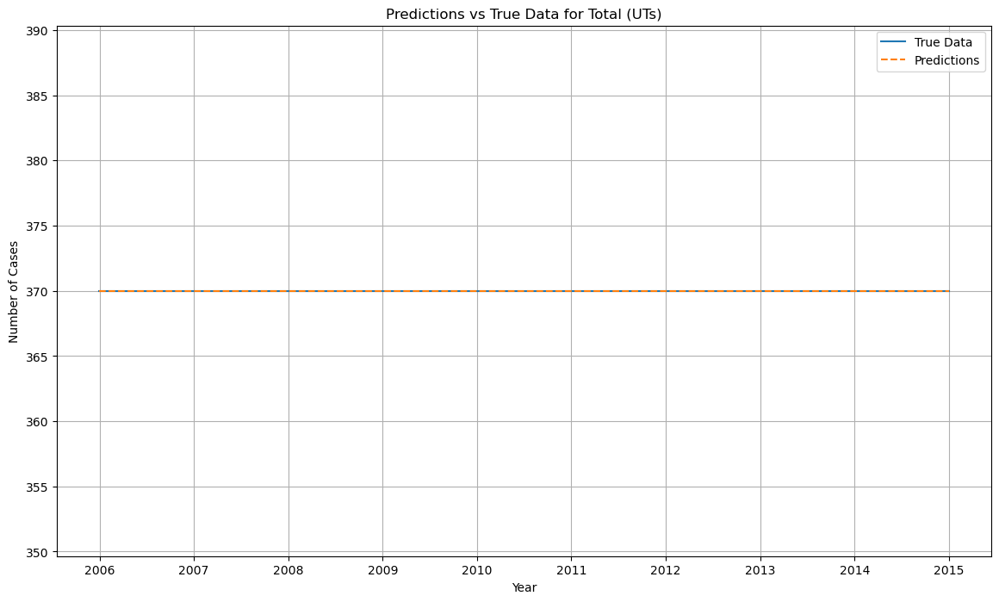

Augmented cases shape for Total (All-India): (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

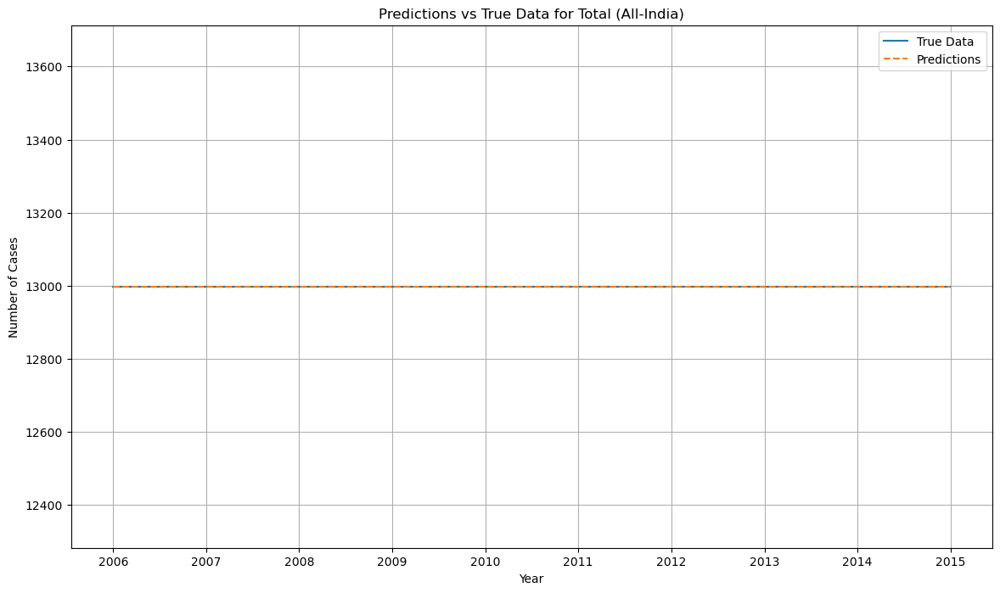

Augmented cases shape for Ahmedabad: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_l

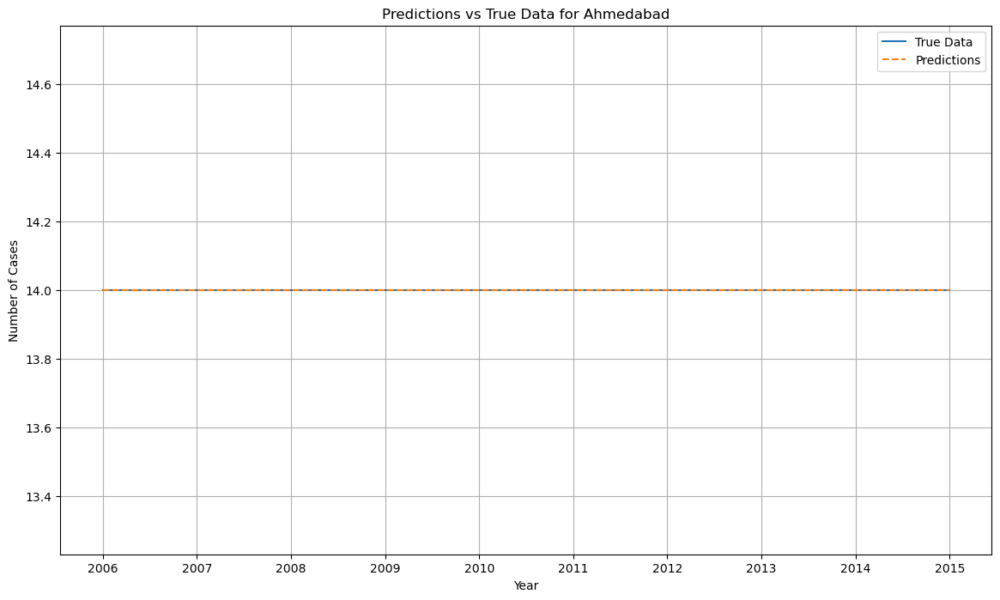

Augmented cases shape for Bangalore: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_l

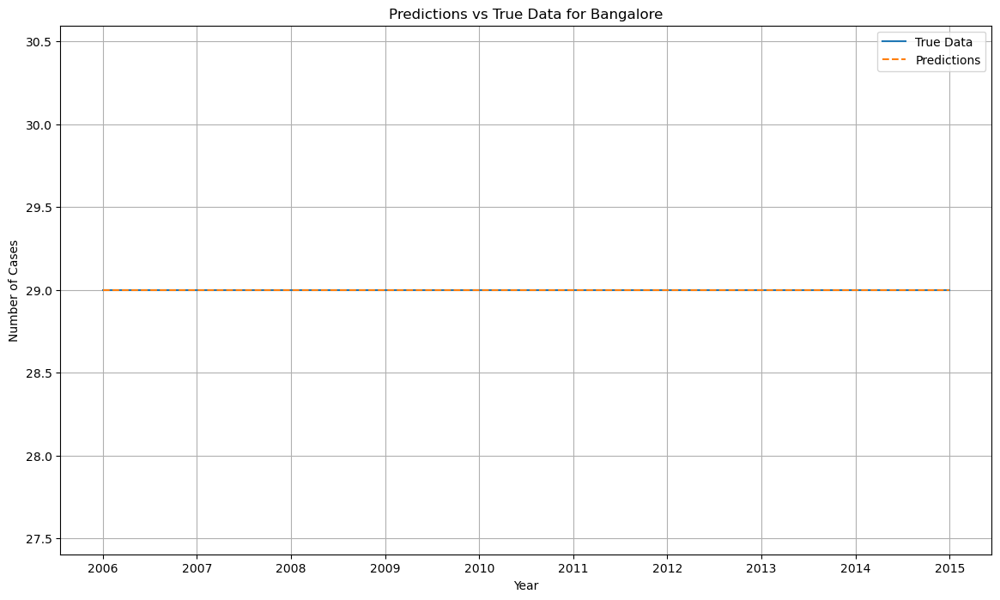

Augmented cases shape for Bhopal: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 135ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

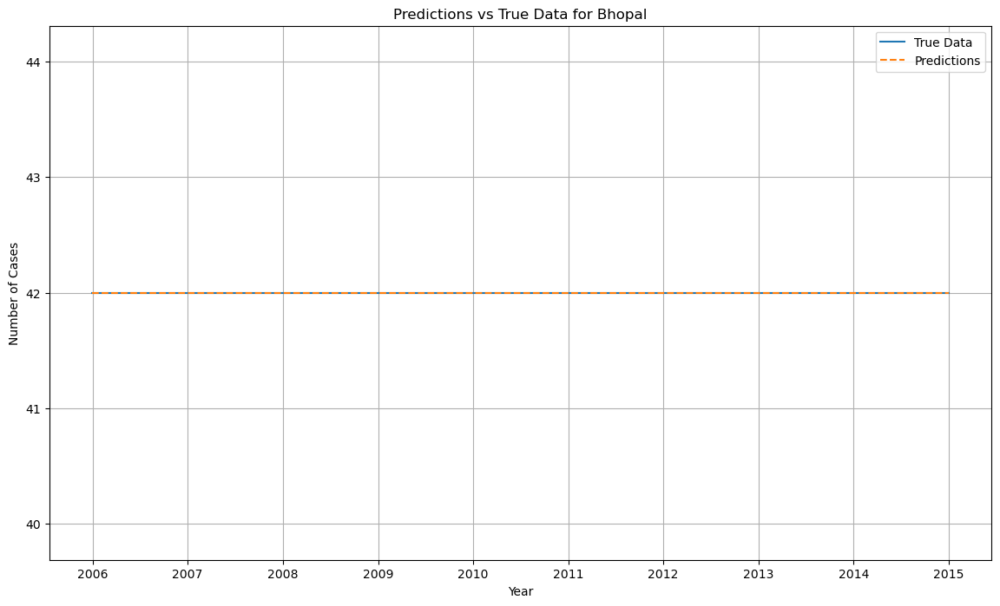

Augmented cases shape for Calcutta: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

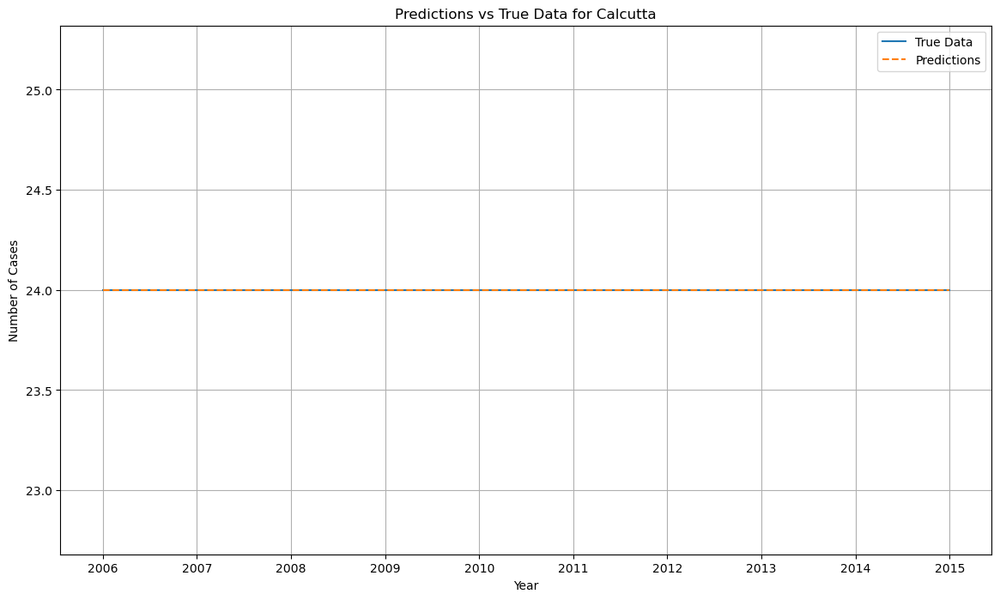

Augmented cases shape for Chennai: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_l

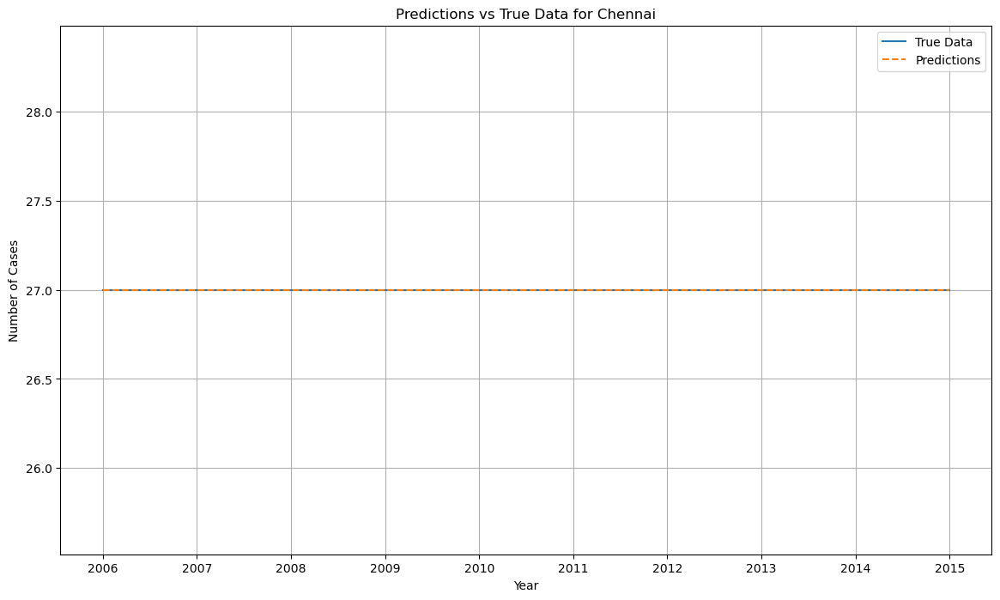

Augmented cases shape for Coimbatore: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 172ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_l

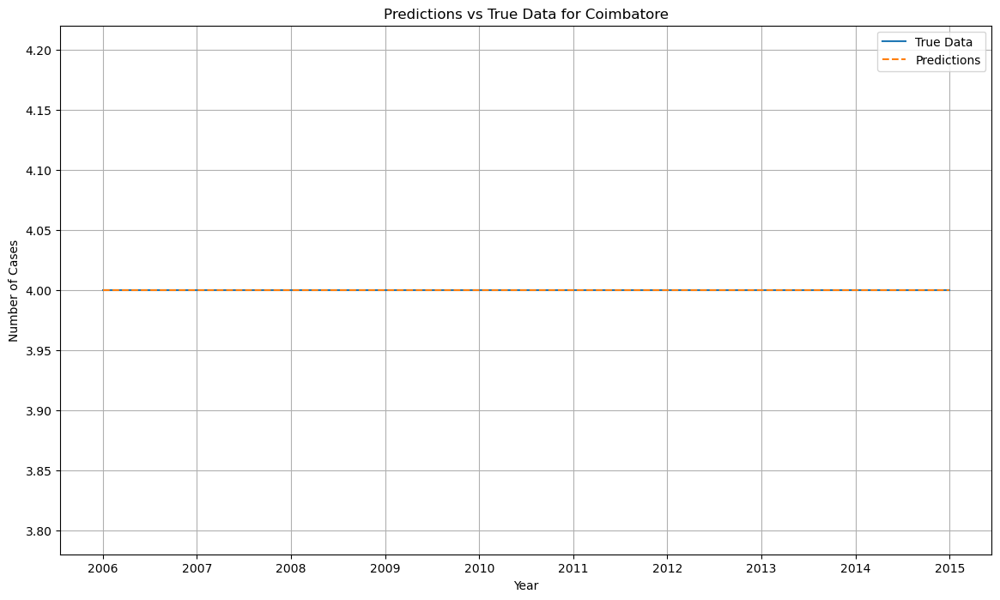

Augmented cases shape for Hyderabad: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

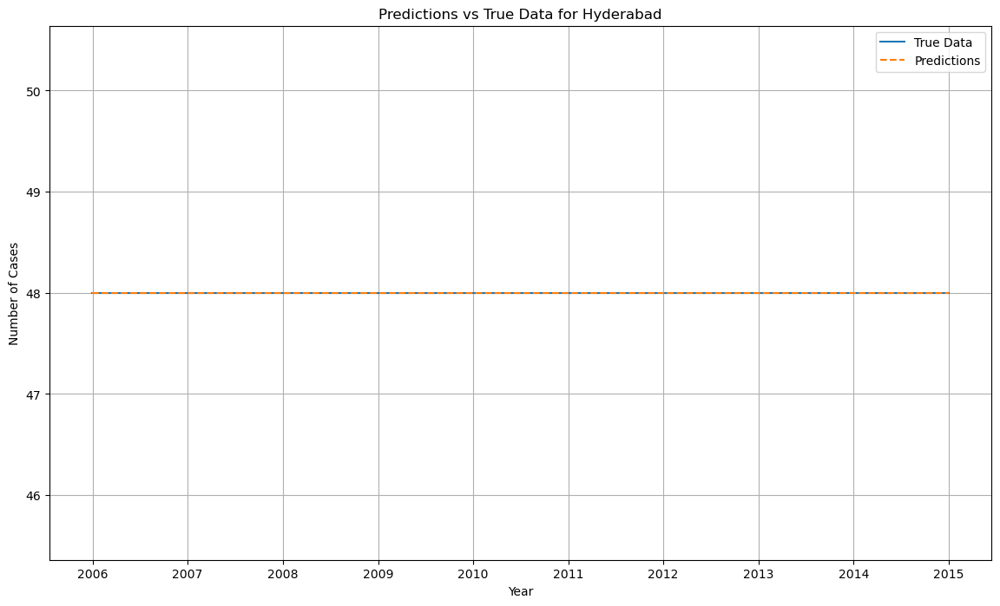

Augmented cases shape for Indore: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

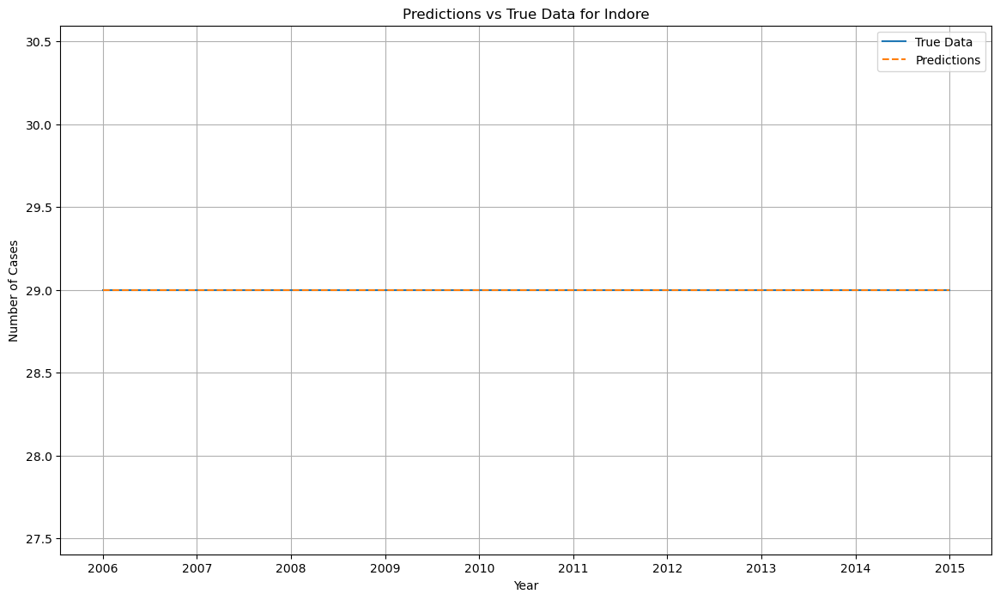

Augmented cases shape for Jaipur: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

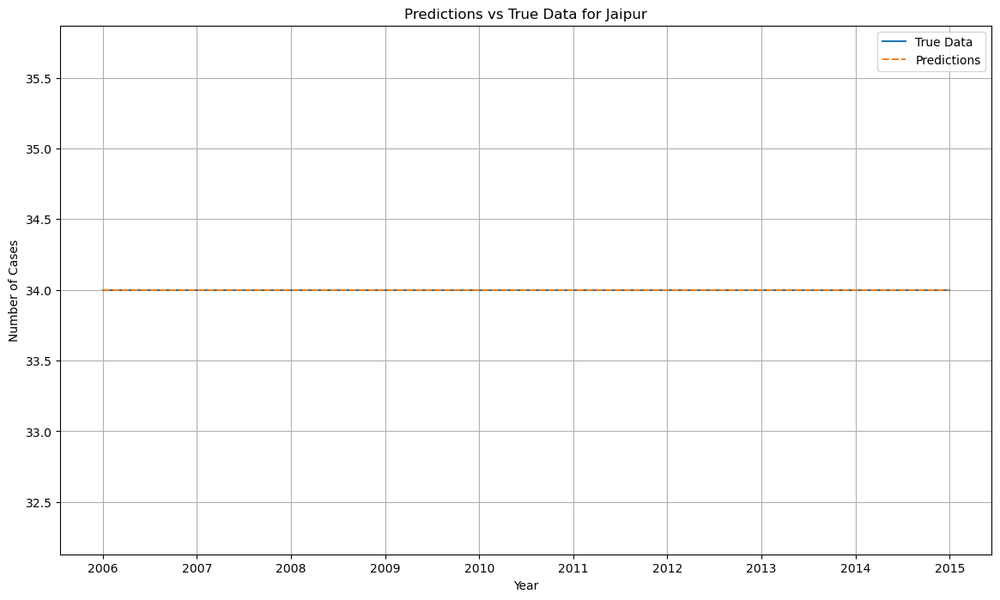

Augmented cases shape for Kanpur: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0000e+00 - val_l

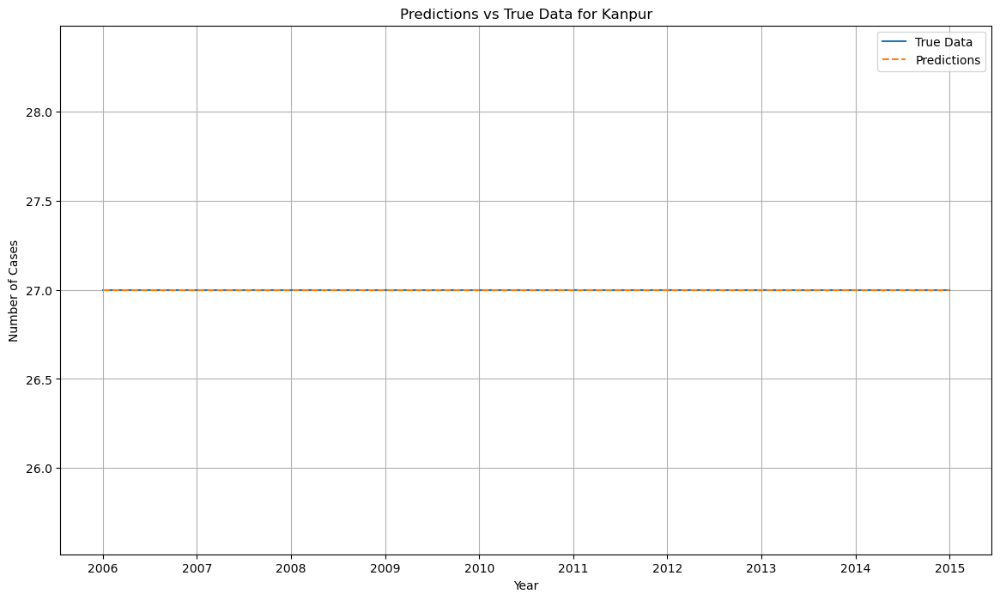

Augmented cases shape for Kochi: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 6/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

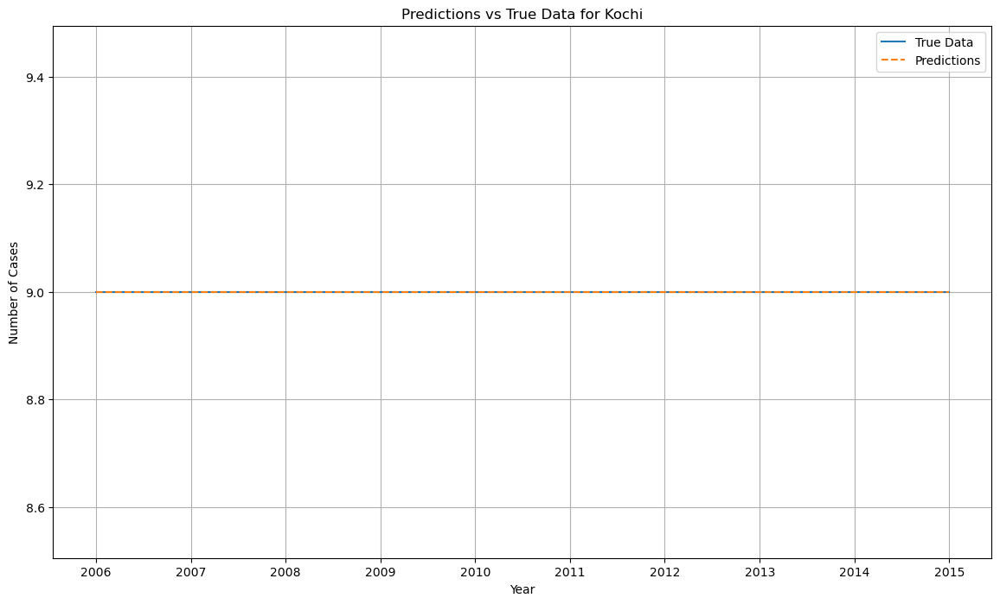

Augmented cases shape for Lucknow: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_l

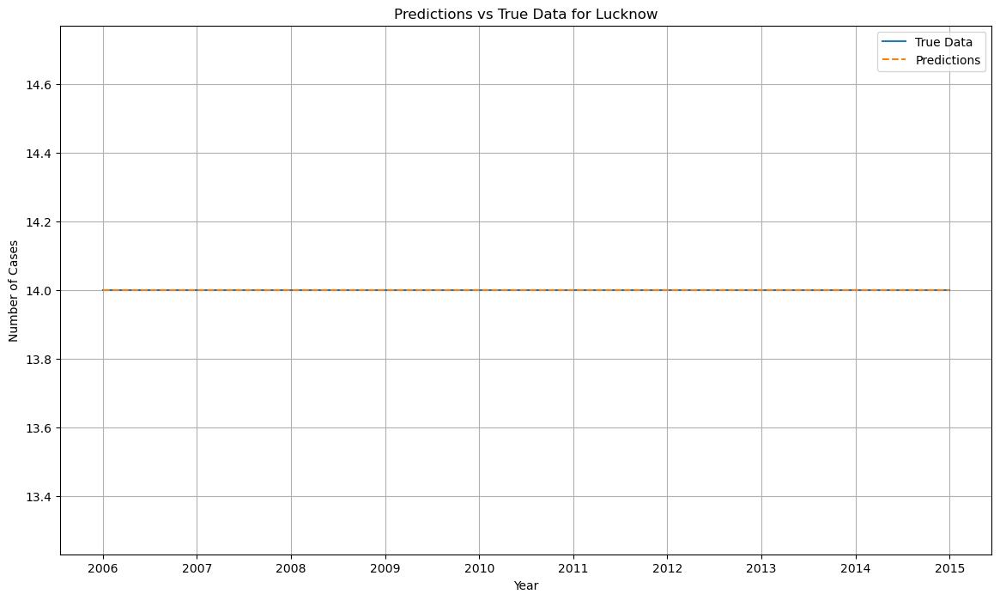

Augmented cases shape for Ludhiana: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

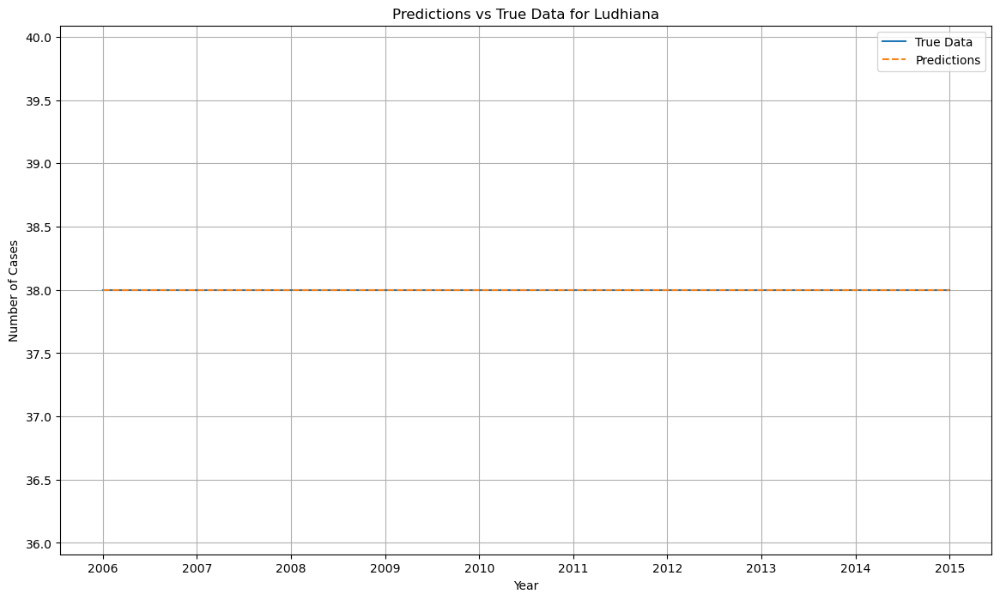

Augmented cases shape for Madurai: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_l

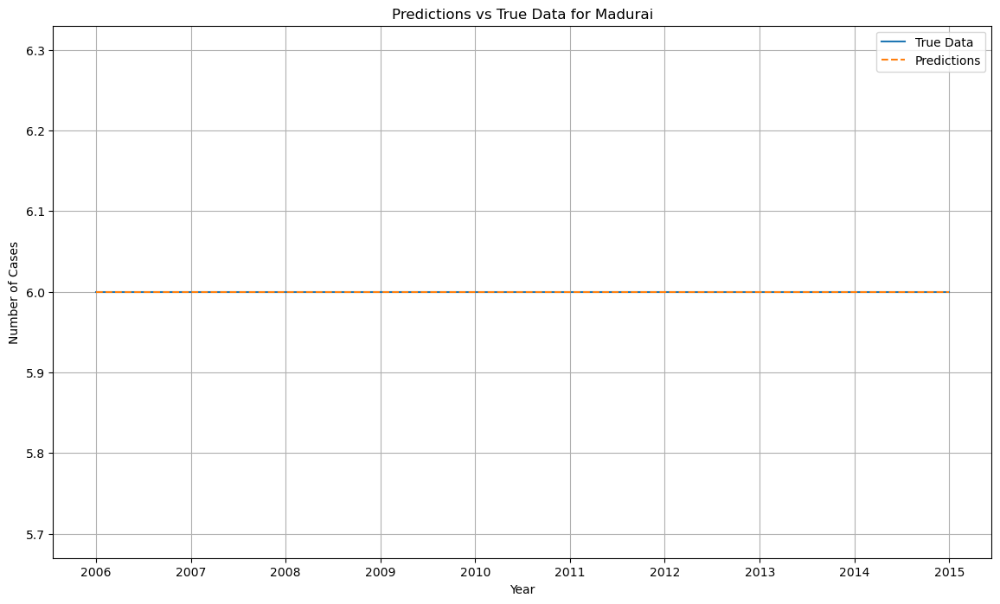

Augmented cases shape for Mumbai: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 180ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_l

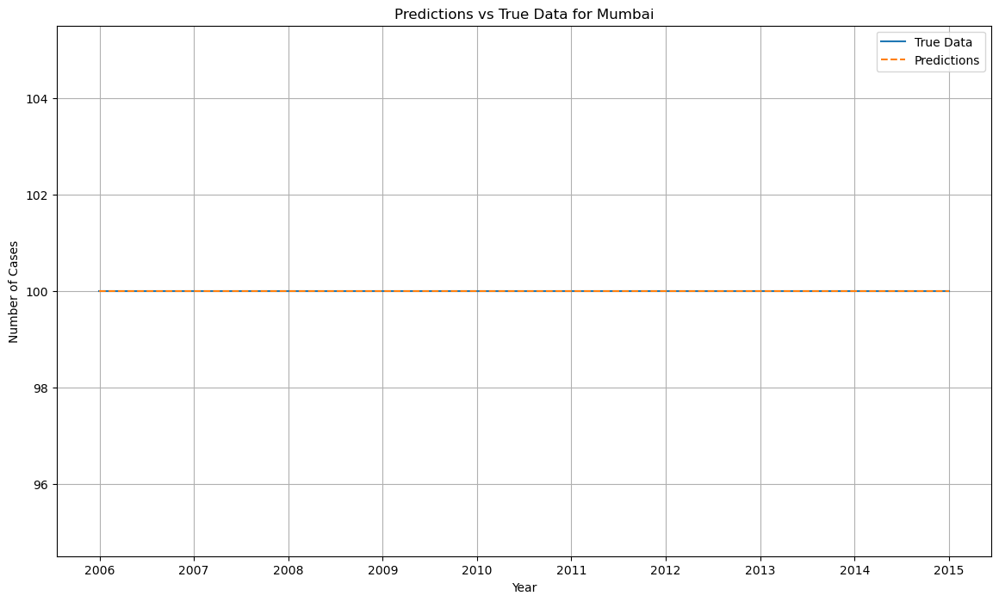

Augmented cases shape for Nagpur: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_l

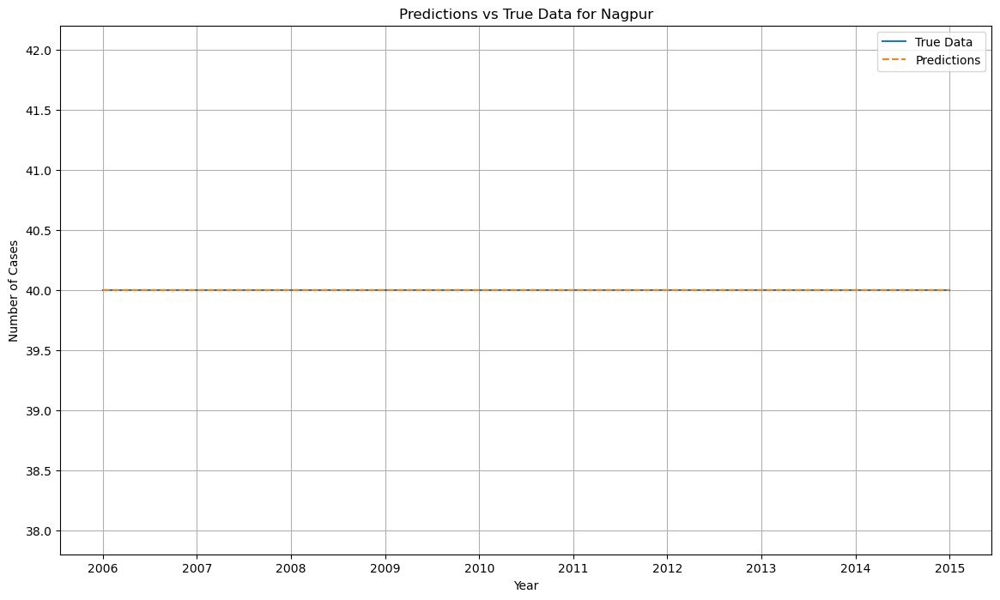

Augmented cases shape for Patna: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 161ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0000e+00 - val_l

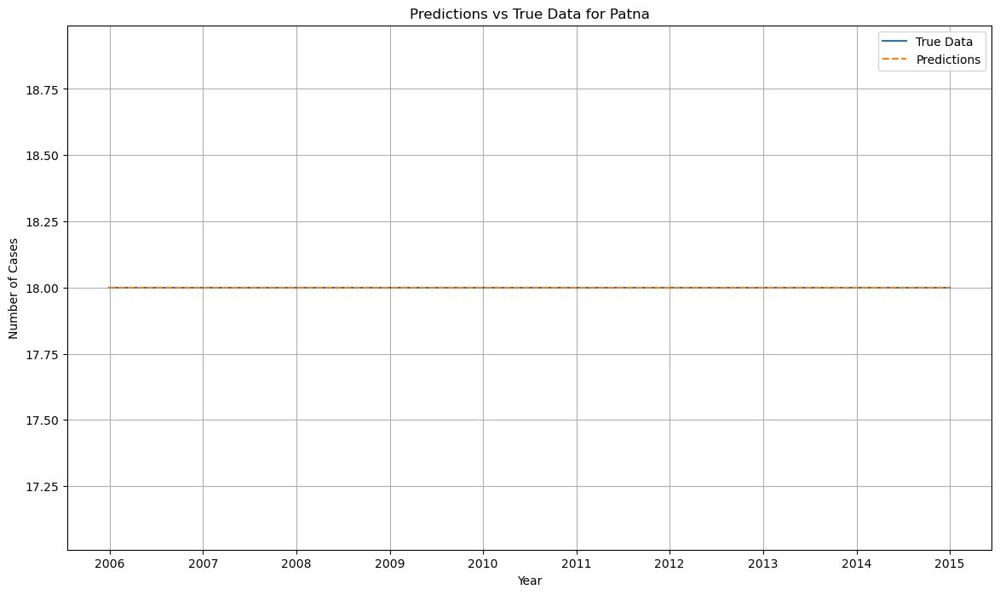

Augmented cases shape for Pune: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 8/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_l

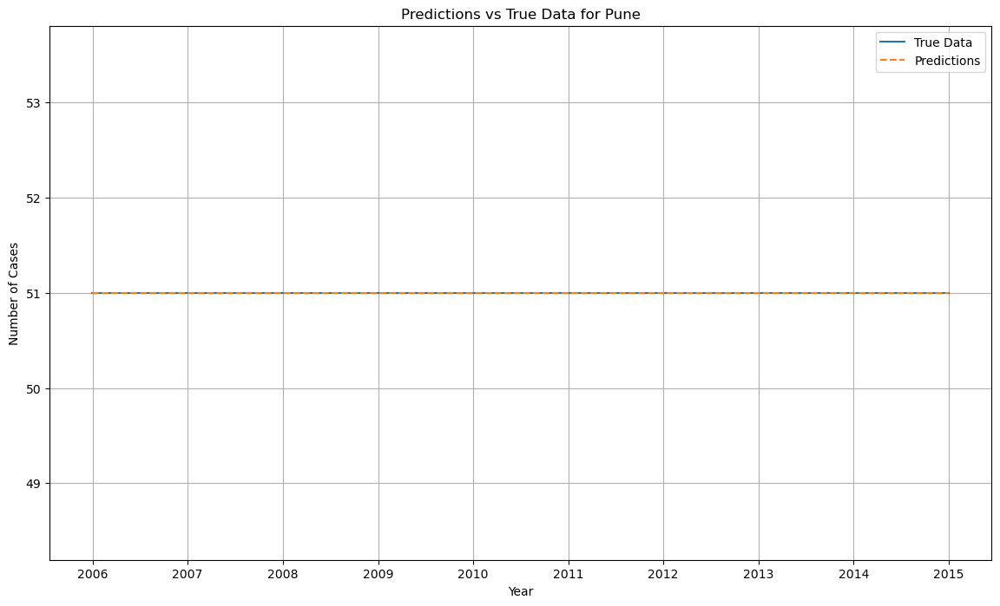

Augmented cases shape for Surat: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 7/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00  

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_l

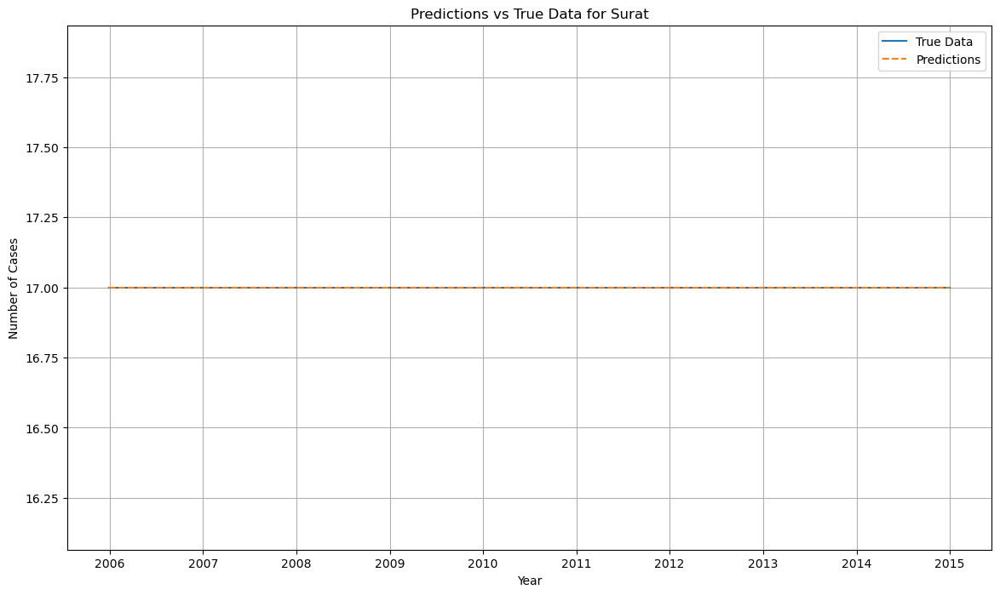

Augmented cases shape for Vadodra: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 1/10 ━━━━━━━━━━━━━━━━━━━━ 2:38 18s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0000e+00 - val_loss

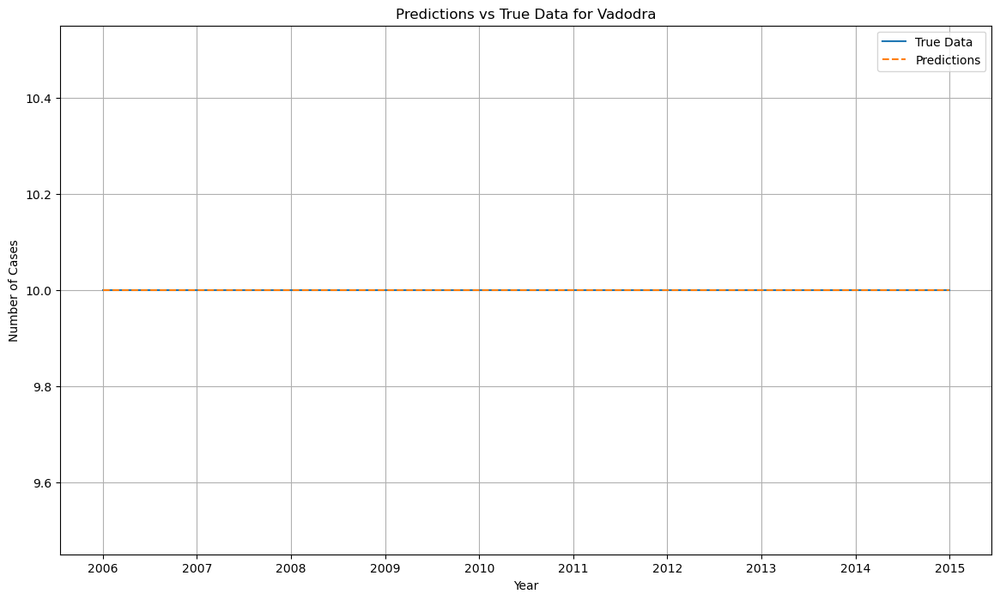

Augmented cases shape for Varanasi: (16, 1)
Epoch 1/50


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.

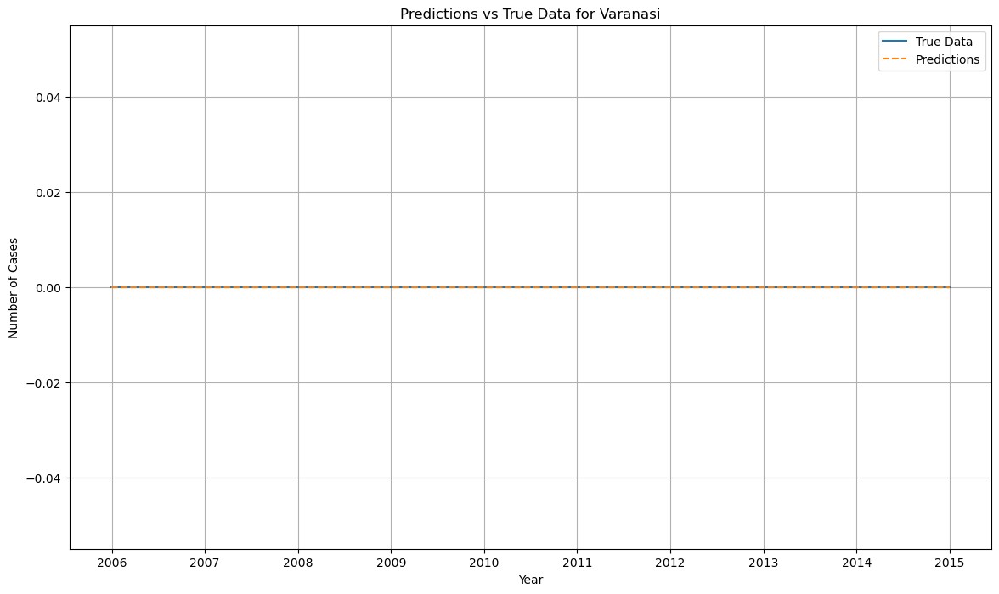

Augmented cases shape for Vishakhapatnam: (16, 1)


C:\Users\kings\AppData\Local\Temp\ipykernel_10284\232897368.py:29: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')
d:\environments\caseanalysis\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
 1/10 ━━━━━━━━━━━━━━━━━━━━ 40s 4s/step - loss: 0.0000e+00

d:\environments\caseanalysis\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 2/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 3/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 4/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 5/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 6/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 7/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 8/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 9/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 10/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 11/50
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0000e+00 - val_loss: 0

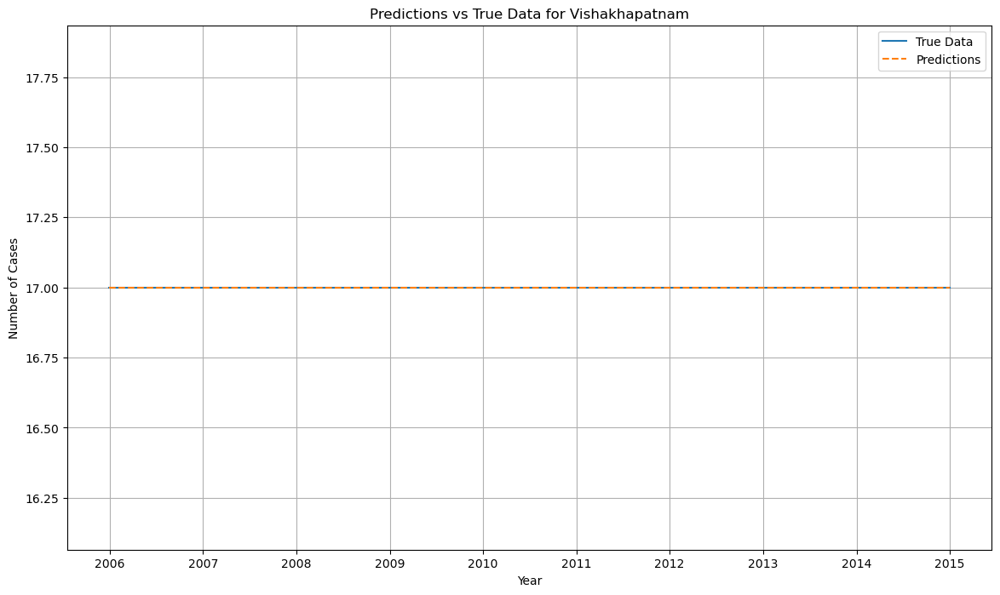

In [196]:
# 
# Data Augmentation Function
def augment_data(data, n_years_future):
    mean = np.mean(data, axis=0)
    std = np.std(data, axis=0) * 1.5  # Adjusting standard deviation for more variability
    augmented_data = np.concatenate([data, norm.rvs(loc=mean, scale=std, size=(n_years_future, data.shape[1]))], axis=0)
    return augmented_data

# Iterate over each unique state
for state in states:
    # Filter data for the current state
    state_data = df_model[df_model.index.get_level_values('STATE/UT') == state]
    
    # Select only the column of interest
    state_data = state_data[['No. Of Cases In Which Offenders Were Known To The Victims']]
    
    # Check if state_data is empty or not
    if state_data.empty:
        print(f"No data found for state {state}")
        continue

    # Data Augmentation
    augmented_cases = augment_data(state_data.values, n_years_future=n_years_future)

    # Check dimensions of augmented_cases
    print(f"Augmented cases shape for {state}:", augmented_cases.shape)

    # Prepare DataFrame for LSTM
    df_aug = pd.DataFrame(augmented_cases, columns=state_data.columns)
    df_aug.index = pd.date_range(start='1999', periods=len(augmented_cases), freq='A')

    # Scaling the data
    scalar = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scalar.fit_transform(df_aug)

    # Define the LSTM Model with Dropout
    model = Sequential()
    model.add(LSTM(units=50, activation='relu', input_shape=(n_input, 1), return_sequences=True))
    model.add(Dropout(0.2))  # Adding dropout layer for regularization
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))  # Output one value
    model.compile(optimizer='adam', loss='mse')

    # Create Time Series Generator
    generator = TimeseriesGenerator(scaled_data, scaled_data, length=n_input, batch_size=batch_size)

    # Callbacks for EarlyStopping
    earlystopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

    # Fit the model
    history = model.fit(generator, epochs=epochs, validation_data=generator, callbacks=[earlystopping], verbose=1)

    # Predict and inverse transform results
    predictions = model.predict(generator)
    predictions = scalar.inverse_transform(predictions)

    # Evaluating the model
    y_true = df_aug.values[n_input:]
    mse = mean_squared_error(y_true, predictions)
    print(f'Mean Squared Error for {state}: {mse}')

    # Plotting results
    plt.figure(figsize=(14, 8))
    plt.plot(df_aug.index[n_input:], y_true, label='True Data')
    plt.plot(df_aug.index[n_input:], predictions, label='Predictions', linestyle='--')
    plt.xlabel('Year')
    plt.ylabel('Number of Cases')
    plt.title(f'Predictions vs True Data for {state}')
    plt.legend()
    plt.grid(True)
    plt.show()

## Due to data limitations the model is not able to perform well.